In [484]:
%matplotlib inline

import os,sys,inspect

PATH = '/Users/gaetanoantonicchio/Documents/GitHub/DataMining-2'
sys.path.insert(0, PATH)

import pandas as pd
import numpy as np
import seaborn as sns

# sklearn modules
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, RepeatedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import plot_confusion_matrix

from sklearn.pipeline import Pipeline
from keras.optimizers import SGD, Adam
from keras.layers import Dense, Input, Dropout, Activation
from keras import Sequential
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import StratifiedKFold

import plotly.express as px
import matplotlib.pyplot as plt
from fma_metadata import utils

import warnings
warnings.filterwarnings('ignore')

#### Preprocessing

In [485]:
# read data: features
data = utils.load('/Users/gaetanoantonicchio/Desktop/dataset_DM2/fma_metadata/features.csv')

# read labels: song_happiness
labels = pd.read_csv('/Users/gaetanoantonicchio/Documents/GitHub/DataMining-2/src/Data (cleaned)/Labels/song_happiness_labels.csv')
label= labels.set_index('track_id')

# merge labels with data
data = data.merge(labels, on='track_id')

# remove duplicate rows
data.drop_duplicates(keep=False, inplace=True)
# remove Null values (if there are)
data.dropna()

# reset index to track_id
data = data.set_index('track_id')

# view data
data.head()

,"(chroma_cens, kurtosis, 01)","(chroma_cens, kurtosis, 02)","(chroma_cens, kurtosis, 03)","(chroma_cens, kurtosis, 04)","(chroma_cens, kurtosis, 05)","(chroma_cens, kurtosis, 06)","(chroma_cens, kurtosis, 07)","(chroma_cens, kurtosis, 08)","(chroma_cens, kurtosis, 09)","(chroma_cens, kurtosis, 10)",...,"(tonnetz, std, 05)","(tonnetz, std, 06)","(zcr, kurtosis, 01)","(zcr, max, 01)","(zcr, mean, 01)","(zcr, median, 01)","(zcr, min, 01)","(zcr, skew, 01)","(zcr, std, 01)",valence
track_id,,,,,,,,,,,,,,,,,,,,,
2,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,1.341231,...,0.012226,0.012111,5.758890,0.459473,0.085629,0.071289,0.0,2.089872,0.061448,happy
3,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,0.619185,...,0.014212,0.017740,2.824694,0.466309,0.084578,0.063965,0.0,1.716724,0.069330,sad
5,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,1.038546,...,0.012691,0.014759,6.808415,0.375000,0.053114,0.041504,0.0,2.193303,0.044861,happy
10,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,1.982386,...,0.017952,0.013921,21.434212,0.452148,0.077515,0.071777,0.0,3.542325,0.040800,happy
134,0.918445,0.674147,0.577818,1.281117,0.933746,0.078177,1.199204,-0.175223,0.925482,1.438509,...,0.016322,0.015819,4.731087,0.419434,0.064370,0.050781,0.0,1.806106,0.054623,happy


In [486]:
# check number of records per class
data.valence.value_counts()

sad      7724
happy    5405
Name: valence, dtype: int64

In [487]:
le = preprocessing.LabelEncoder()
data['valence'] = le.fit_transform(data['valence'])
data.valence.value_counts()

1    7724
0    5405
Name: valence, dtype: int64

LEGEND <BR>
1: sad <br>
0: happy

In [488]:
# remove labels from dataset 
labels = data[['valence']]
data.drop('valence', axis=1, inplace=True)

In [489]:
# preview labels
labels

,valence
track_id,
2,0
3,1
5,0
10,0
134,0
...,...
124857,0
124862,1
124863,1


In [491]:
data = np.array(data)
labels=np.array(labels)

In [492]:
data

array([[ 7.18065262e+00,  5.23030901e+00,  2.49320805e-01, ...,
         0.00000000e+00,  2.08987212e+00,  6.14481084e-02],
       [ 1.88896334e+00,  7.60539293e-01,  3.45296562e-01, ...,
         0.00000000e+00,  1.71672380e+00,  6.93301633e-02],
       [ 5.27562976e-01, -7.76543170e-02, -2.79610306e-01, ...,
         0.00000000e+00,  2.19330311e+00,  4.48606014e-02],
       ...,
       [ 4.43874672e-02, -2.35208139e-01,  9.63845029e-02, ...,
         1.95312500e-03,  1.96102118e+00,  3.52281034e-02],
       [-7.51019001e-01,  2.66916680e+00,  1.02221727e-01, ...,
         0.00000000e+00,  1.94983971e+00,  3.58997248e-02],
       [-1.30098629e+00, -6.41399980e-01, -1.38426518e+00, ...,
         0.00000000e+00,  4.30246782e+00,  7.72547349e-03]])

In [493]:
labels

array([[0],
       [1],
       [0],
       ...,
       [1],
       [0],
       [1]])

## Partition Data into: Development set and Internal Test set

In [786]:
# split data in traning and test
X_dev, X_test, y_dev, y_test = train_test_split(data, labels, test_size=0.30, random_state=42, stratify=labels,
                                                   shuffle=True) 

In [787]:
X_train, X_test_int, y_train, y_test_int = train_test_split(X_dev, y_dev, test_size=0.3, random_state=42, shuffle=True)

In [788]:
X_train.shape, y_train.shape

((6433, 518), (6433, 1))

In [789]:
X_test_int.shape, y_test_int.shape

((2757, 518), (2757, 1))

In [790]:
X_test.shape, y_test.shape

((3939, 518), (3939, 1))

In [791]:
# normalize data
scaler = StandardScaler()

scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test_int = scaler.transform(X_test_int) #fit only on X_train to don't get biased with information of X_test
X_test = scaler.transform(X_test)

X_dev = np.array(X_dev)
X_test = np.array(X_test)
y_test = np.array(y_test)
y_dev = np.array(y_dev)

In [792]:
scaler.fit(X_dev)
X_dev = scaler.transform(X_dev)

# Create Neural Network : Keras

To understand how the model behaves, several configurations have been tested so to get an idea of the search-space in which to start looking for the optimal hyperparameters.<br>
#### Validation Schema<br>
The data are split into **Development set** (70%) and **Test set**(30%). The latter was never used during the model selection phase, and was employed only once when we tested the final model.<br>
The Development set was further split into **Training set**(70%) and **Internal Test Set**(30%).<br> The Training set was used for **Model selection** which was performed using a **5 fold cross validation**, during which the mentioned set was continoulsy split into training and validation set. Once we selected the best model we estimated its goodness on the Internal Test set, which worked as a tool for understanding how the model behaved on unseen data. <br>
After the Model selection phase was completed, the selected model was retrained on the full development set (Traing set + Internal test set) and then tested on the Test set.


In [557]:
input_dim = X_train.shape[1]
target_dim = y_train.shape[0]

print(f"number of inputs: {input_dim}\nnumber of patterns: {X_train.shape[0]}")


number of inputs: 518
number of patterns: 6433


In [532]:
#from sklearn.utils import shuffle

#shuffle data
#X_dev, y_dev =  shuffle(X_dev, y_dev)        # the data were already shuffled when the split was performed.

In [533]:
X_train

array([[-0.4102098 , -0.18898484, -0.40005718, ...,  0.42287475,
        -0.41929255, -0.90969019],
       [-0.20209235,  0.05789601, -0.02287232, ..., -0.60468182,
        -0.60286949, -0.72218753],
       [-0.5352439 , -0.19446588, -0.48561702, ...,  1.32198675,
        -0.659094  , -1.27062304],
       ...,
       [-0.16135706, -0.07797338, -0.27957911, ..., -0.60468182,
        -0.34864444,  0.28083105],
       [-0.51967746, -0.52791701, -0.1976743 , ...,  0.16598561,
        -0.24961236, -0.95337147],
       [ 0.12500434,  0.3066854 ,  0.20158073, ..., -0.60468182,
        -0.00854719,  0.99581673]])

##  Screening phase - Deep Network (518, 50, 50, 50, 1)
### SGD + L2 Regularization

In [534]:
#help(Dense)

In [558]:
from tensorflow.keras import regularizers

In [734]:
def MLP_deep():
    initializer = tf.keras.initializers.GlorotNormal()
    input_dim = X_train.shape[1]
    
    model = Sequential()
    model.add(Dense(50, activation='relu', input_dim=input_dim,kernel_initializer=initializer, kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dense(50, activation='relu',kernel_initializer=initializer,kernel_regularizer=regularizers.l2(0.06)))
    model.add(Dense(50, activation='relu',kernel_initializer=initializer,kernel_regularizer=regularizers.l2(0.06)))

    #output layer
    model.add(Dense(1, activation='sigmoid',kernel_initializer=initializer))

    return model

In [735]:
model_deep = MLP_deep()

# define optimizer
sgd = SGD(learning_rate=0.001, momentum=0.7, nesterov=True
)
model_deep.compile(optimizer=sgd, loss='binary_crossentropy', metrics=['accuracy'])
# print model information
model_deep.summary()

Model: "sequential_124"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_371 (Dense)            (None, 50)                25950     
_________________________________________________________________
dense_372 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_373 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_374 (Dense)            (None, 1)                 51        
Total params: 31,101
Trainable params: 31,101
Non-trainable params: 0
_________________________________________________________________


With higher value of learning_rate the model goes in overflow

In [736]:
history_deep = model_deep.fit(X_train, y_train, epochs= 300, validation_split=0.3, batch_size=120, shuffle=True,verbose=False).history

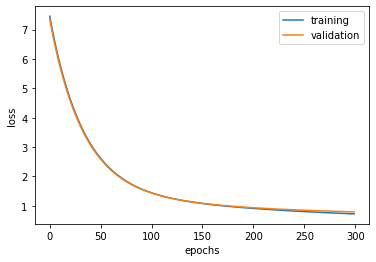

In [737]:
# training-validation loss
plt.plot(history_deep['loss'], label='training')
plt.plot(history_deep['val_loss'], label='validation')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

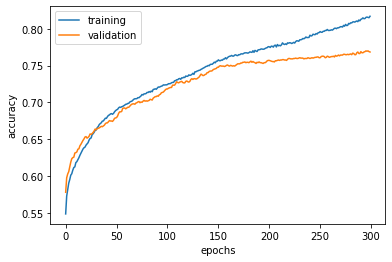

In [738]:
# training-validation accuracy
plt.plot(history_deep['accuracy'], label='training')
plt.plot(history_deep['val_accuracy'], label='validation')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

In [739]:
# internal test 
threshold = 0.50
# convert prediciton to binary 
y_pred = model_deep.predict(X_test_int, verbose=2)
y_pred = y_pred > threshold

print('Accuracy %s' % accuracy_score(y_test_int, y_pred))
print('F1-score %s' % f1_score(y_test_int, y_pred, average=None))
print(classification_report(y_test_int, y_pred))

87/87 - 0s
Accuracy 0.7584330794341676
F1-score [0.70053957 0.79756839]
              precision    recall  f1-score   support

           0       0.71      0.69      0.70      1132
           1       0.79      0.81      0.80      1625

    accuracy                           0.76      2757
   macro avg       0.75      0.75      0.75      2757
weighted avg       0.76      0.76      0.76      2757



## Adam + L2 regularization

In [585]:
def MLP_adam():
    initializer = tf.keras.initializers.GlorotNormal()
    input_dim = X_train.shape[1]
    
    model = Sequential()
    model.add(Dense(50, activation='relu', input_dim=input_dim,kernel_initializer=initializer, kernel_regularizer=regularizers.l2(0.05)))
    model.add(Dense(50, activation='relu',kernel_initializer=initializer,kernel_regularizer=regularizers.l2(0.05)))
    model.add(Dense(50, activation='relu',kernel_initializer=initializer,kernel_regularizer=regularizers.l2(0.05)))
    
    #output layer
    model.add(Dense(1, activation='sigmoid',kernel_initializer=initializer))

    return model

In [586]:
model_adam = MLP_adam()

# define optimizer
adam = Adam(learning_rate=0.001)

model_adam.compile(optimizer=adam, loss='binary_crossentropy', metrics=['accuracy'])
# print model information
model_adam.summary()

Model: "sequential_93"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_291 (Dense)            (None, 50)                25950     
_________________________________________________________________
dense_292 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_293 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_294 (Dense)            (None, 1)                 51        
Total params: 31,101
Trainable params: 31,101
Non-trainable params: 0
_________________________________________________________________


In [587]:
history_adam = model_adam.fit(X_train, y_train, epochs= 200, validation_split=0.3, batch_size=20, shuffle=True).history

Epoch 1/200
226/226 [==============================] - 1s 4ms/step - loss: 3.3322 - accuracy: 0.6509 - val_loss: 1.0034 - val_accuracy: 0.7171
Epoch 2/200
226/226 [==============================] - 1s 2ms/step - loss: 0.7782 - accuracy: 0.6944 - val_loss: 0.6538 - val_accuracy: 0.7197
Epoch 3/200
226/226 [==============================] - 1s 2ms/step - loss: 0.6621 - accuracy: 0.7122 - val_loss: 0.6679 - val_accuracy: 0.7021
Epoch 4/200
226/226 [==============================] - 1s 2ms/step - loss: 0.6434 - accuracy: 0.7195 - val_loss: 0.6467 - val_accuracy: 0.7135
Epoch 5/200
226/226 [==============================] - 1s 3ms/step - loss: 0.6379 - accuracy: 0.7286 - val_loss: 0.6129 - val_accuracy: 0.7446
Epoch 6/200
226/226 [==============================] - 1s 3ms/step - loss: 0.6211 - accuracy: 0.7324 - val_loss: 0.6191 - val_accuracy: 0.7228
Epoch 7/200
226/226 [==============================] - 1s 3ms/step - loss: 0.6169 - accuracy: 0.7393 - val_loss: 0.6015 - val_accuracy: 0.7373

Epoch 58/200
226/226 [==============================] - 1s 2ms/step - loss: 0.5451 - accuracy: 0.7686 - val_loss: 0.5763 - val_accuracy: 0.7565
Epoch 59/200
226/226 [==============================] - 1s 2ms/step - loss: 0.5455 - accuracy: 0.7679 - val_loss: 0.5799 - val_accuracy: 0.7482
Epoch 60/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5465 - accuracy: 0.7679 - val_loss: 0.6221 - val_accuracy: 0.7171
Epoch 61/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5538 - accuracy: 0.7586 - val_loss: 0.5944 - val_accuracy: 0.7295
Epoch 62/200
226/226 [==============================] - 1s 3ms/step - loss: 0.5493 - accuracy: 0.7688 - val_loss: 0.5796 - val_accuracy: 0.7383
Epoch 63/200
226/226 [==============================] - 1s 3ms/step - loss: 0.5447 - accuracy: 0.7682 - val_loss: 0.5696 - val_accuracy: 0.7560
Epoch 64/200
226/226 [==============================] - 1s 3ms/step - loss: 0.5435 - accuracy: 0.7750 - val_loss: 0.5775 - val_accuracy:

Epoch 115/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5334 - accuracy: 0.7730 - val_loss: 0.5805 - val_accuracy: 0.7394
Epoch 116/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5417 - accuracy: 0.7679 - val_loss: 0.5850 - val_accuracy: 0.7316
Epoch 117/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5391 - accuracy: 0.7708 - val_loss: 0.5584 - val_accuracy: 0.7637
Epoch 118/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5378 - accuracy: 0.7677 - val_loss: 0.5732 - val_accuracy: 0.7435
Epoch 119/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5364 - accuracy: 0.7766 - val_loss: 0.5637 - val_accuracy: 0.7513
Epoch 120/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7695 - val_loss: 0.5774 - val_accuracy: 0.7363
Epoch 121/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5352 - accuracy: 0.7697 - val_loss: 0.5694 - val_ac

226/226 [==============================] - 0s 2ms/step - loss: 0.5338 - accuracy: 0.7710 - val_loss: 0.5741 - val_accuracy: 0.7399
Epoch 172/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5338 - accuracy: 0.7710 - val_loss: 0.5609 - val_accuracy: 0.7477
Epoch 173/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5280 - accuracy: 0.7784 - val_loss: 0.5640 - val_accuracy: 0.7611
Epoch 174/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5308 - accuracy: 0.7735 - val_loss: 0.5716 - val_accuracy: 0.7446
Epoch 175/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5309 - accuracy: 0.7730 - val_loss: 0.5724 - val_accuracy: 0.7415
Epoch 176/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5331 - accuracy: 0.7739 - val_loss: 0.5635 - val_accuracy: 0.7534
Epoch 177/200
226/226 [==============================] - 0s 2ms/step - loss: 0.5292 - accuracy: 0.7768 - val_loss: 0.5708 - val_accuracy: 0.7497

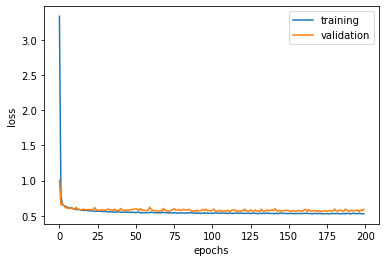

In [588]:
# training-validation loss
plt.plot(history_adam['loss'], label='training')
plt.plot(history_adam['val_loss'], label='validation')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

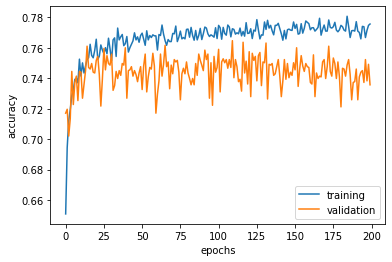

In [589]:
# training-validation accuracy
plt.plot(history_adam['accuracy'], label='training')
plt.plot(history_adam['val_accuracy'], label='validation')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

In [590]:
# internal test 
threshold = 0.50
# convert prediciton to binary 
y_pred = model_adam.predict(X_test_int, verbose=2)
y_pred = y_pred > threshold

print('Accuracy %s' % accuracy_score(y_test_int, y_pred))
print('F1-score %s' % f1_score(y_test_int, y_pred, average=None))
print(classification_report(y_test_int, y_pred))

87/87 - 0s
Accuracy 0.7381211461733769
F1-score [0.63498483 0.79581448]
              precision    recall  f1-score   support

           0       0.74      0.55      0.63      1132
           1       0.74      0.87      0.80      1625

    accuracy                           0.74      2757
   macro avg       0.74      0.71      0.72      2757
weighted avg       0.74      0.74      0.73      2757



## Shallow models : (518, 60, 20, 1)
### SGD + L2 regularization

In [706]:
def MLP_shallow():
    initializer = tf.keras.initializers.GlorotNormal()
    input_dim = X_train.shape[1]
    
    model = Sequential()
    model.add(Dense(60, activation='relu', input_dim=input_dim,kernel_initializer=initializer, kernel_regularizer=regularizers.l2(0.12)))    
    model.add(Dense(20, activation='relu', input_dim=input_dim,kernel_initializer=initializer, kernel_regularizer=regularizers.l2(0.09)))    

    #output layer
    model.add(Dense(1, activation='sigmoid',kernel_initializer=initializer))

    return model

In [707]:
model_shallow = MLP_shallow()

# define optimizer
sgd = SGD(learning_rate=0.001, momentum=0.7, nesterov=True
)
model_shallow.compile(optimizer=sgd, loss='binary_crossentropy', metrics=['accuracy'])
# print model information
model_shallow.summary()

Model: "sequential_120"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_357 (Dense)            (None, 60)                31140     
_________________________________________________________________
dense_358 (Dense)            (None, 20)                1220      
_________________________________________________________________
dense_359 (Dense)            (None, 1)                 21        
Total params: 32,381
Trainable params: 32,381
Non-trainable params: 0
_________________________________________________________________


In [708]:
history_shallow = model_shallow.fit(X_train, y_train, epochs= 700, validation_split=0.3, batch_size=120, shuffle=True).history

Epoch 1/700
38/38 [==============================] - 1s 31ms/step - loss: 16.2950 - accuracy: 0.4974 - val_loss: 15.8107 - val_accuracy: 0.5202
Epoch 2/700
38/38 [==============================] - 0s 10ms/step - loss: 15.3761 - accuracy: 0.5339 - val_loss: 14.9250 - val_accuracy: 0.5606
Epoch 3/700
38/38 [==============================] - 0s 8ms/step - loss: 14.5254 - accuracy: 0.5605 - val_loss: 14.1028 - val_accuracy: 0.5798
Epoch 4/700
38/38 [==============================] - 0s 8ms/step - loss: 13.7305 - accuracy: 0.5778 - val_loss: 13.3333 - val_accuracy: 0.5881
Epoch 5/700
38/38 [==============================] - 1s 16ms/step - loss: 12.9845 - accuracy: 0.5958 - val_loss: 12.6105 - val_accuracy: 0.6026
Epoch 6/700
38/38 [==============================] - 1s 14ms/step - loss: 12.2831 - accuracy: 0.6036 - val_loss: 11.9310 - val_accuracy: 0.6036
Epoch 7/700
38/38 [==============================] - ETA: 0s - loss: 11.6442 - accuracy: 0.612 - 0s 13ms/step - loss: 11.6231 - accuracy: 

38/38 [==============================] - 0s 4ms/step - loss: 1.2458 - accuracy: 0.7029 - val_loss: 1.2225 - val_accuracy: 0.7052
Epoch 59/700
38/38 [==============================] - 1s 14ms/step - loss: 1.2130 - accuracy: 0.7046 - val_loss: 1.1906 - val_accuracy: 0.7067
Epoch 60/700
38/38 [==============================] - 1s 15ms/step - loss: 1.1819 - accuracy: 0.7042 - val_loss: 1.1604 - val_accuracy: 0.7073
Epoch 61/700
38/38 [==============================] - 0s 10ms/step - loss: 1.1526 - accuracy: 0.7060 - val_loss: 1.1318 - val_accuracy: 0.7083
Epoch 62/700
38/38 [==============================] - 1s 16ms/step - loss: 1.1248 - accuracy: 0.7055 - val_loss: 1.1048 - val_accuracy: 0.7093
Epoch 63/700
38/38 [==============================] - 1s 15ms/step - loss: 1.0985 - accuracy: 0.7073 - val_loss: 1.0793 - val_accuracy: 0.7088
Epoch 64/700
38/38 [==============================] - 0s 8ms/step - loss: 1.0736 - accuracy: 0.7073 - val_loss: 1.0552 - val_accuracy: 0.7093
Epoch 65/700
3

38/38 [==============================] - 0s 7ms/step - loss: 0.6519 - accuracy: 0.7366 - val_loss: 0.6479 - val_accuracy: 0.7389
Epoch 116/700
38/38 [==============================] - 0s 10ms/step - loss: 0.6500 - accuracy: 0.7360 - val_loss: 0.6461 - val_accuracy: 0.7383
Epoch 117/700
38/38 [==============================] - 0s 11ms/step - loss: 0.6483 - accuracy: 0.7373 - val_loss: 0.6445 - val_accuracy: 0.7383
Epoch 118/700
38/38 [==============================] - 1s 14ms/step - loss: 0.6465 - accuracy: 0.7380 - val_loss: 0.6429 - val_accuracy: 0.7389
Epoch 119/700
38/38 [==============================] - 0s 6ms/step - loss: 0.6449 - accuracy: 0.7386 - val_loss: 0.6414 - val_accuracy: 0.7394
Epoch 120/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6434 - accuracy: 0.7395 - val_loss: 0.6399 - val_accuracy: 0.7383
Epoch 121/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6419 - accuracy: 0.7400 - val_loss: 0.6386 - val_accuracy: 0.7404
Epoch 122/

38/38 [==============================] - 0s 6ms/step - loss: 0.6022 - accuracy: 0.7551 - val_loss: 0.6055 - val_accuracy: 0.7513
Epoch 173/700
38/38 [==============================] - 0s 6ms/step - loss: 0.6018 - accuracy: 0.7533 - val_loss: 0.6052 - val_accuracy: 0.7528
Epoch 174/700
38/38 [==============================] - 0s 5ms/step - loss: 0.6013 - accuracy: 0.7546 - val_loss: 0.6049 - val_accuracy: 0.7513
Epoch 175/700
38/38 [==============================] - 0s 5ms/step - loss: 0.6009 - accuracy: 0.7553 - val_loss: 0.6045 - val_accuracy: 0.7508
Epoch 176/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6004 - accuracy: 0.7555 - val_loss: 0.6043 - val_accuracy: 0.7513
Epoch 177/700
38/38 [==============================] - 0s 3ms/step - loss: 0.6001 - accuracy: 0.7548 - val_loss: 0.6041 - val_accuracy: 0.7518
Epoch 178/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5996 - accuracy: 0.7531 - val_loss: 0.6036 - val_accuracy: 0.7508
Epoch 179/700

38/38 [==============================] - 1s 17ms/step - loss: 0.5830 - accuracy: 0.7626 - val_loss: 0.5929 - val_accuracy: 0.7565
Epoch 230/700
38/38 [==============================] - 0s 13ms/step - loss: 0.5828 - accuracy: 0.7630 - val_loss: 0.5928 - val_accuracy: 0.7549
Epoch 231/700
38/38 [==============================] - 0s 11ms/step - loss: 0.5825 - accuracy: 0.7646 - val_loss: 0.5927 - val_accuracy: 0.7560
Epoch 232/700
38/38 [==============================] - 0s 13ms/step - loss: 0.5822 - accuracy: 0.7617 - val_loss: 0.5924 - val_accuracy: 0.7549
Epoch 233/700
38/38 [==============================] - 0s 9ms/step - loss: 0.5819 - accuracy: 0.7624 - val_loss: 0.5920 - val_accuracy: 0.7554
Epoch 234/700
38/38 [==============================] - 0s 7ms/step - loss: 0.5816 - accuracy: 0.7630 - val_loss: 0.5921 - val_accuracy: 0.7560
Epoch 235/700
38/38 [==============================] - 0s 7ms/step - loss: 0.5815 - accuracy: 0.7655 - val_loss: 0.5917 - val_accuracy: 0.7570
Epoch 236

38/38 [==============================] - 1s 15ms/step - loss: 0.5705 - accuracy: 0.7706 - val_loss: 0.5856 - val_accuracy: 0.7606
Epoch 287/700
38/38 [==============================] - 0s 11ms/step - loss: 0.5702 - accuracy: 0.7746 - val_loss: 0.5854 - val_accuracy: 0.7611
Epoch 288/700
38/38 [==============================] - 0s 8ms/step - loss: 0.5701 - accuracy: 0.7728 - val_loss: 0.5856 - val_accuracy: 0.7627
Epoch 289/700
38/38 [==============================] - 0s 8ms/step - loss: 0.5699 - accuracy: 0.7730 - val_loss: 0.5851 - val_accuracy: 0.7606
Epoch 290/700
38/38 [==============================] - 0s 7ms/step - loss: 0.5697 - accuracy: 0.7704 - val_loss: 0.5851 - val_accuracy: 0.7591
Epoch 291/700
38/38 [==============================] - 0s 6ms/step - loss: 0.5695 - accuracy: 0.7750 - val_loss: 0.5853 - val_accuracy: 0.7627
Epoch 292/700
38/38 [==============================] - 0s 7ms/step - loss: 0.5693 - accuracy: 0.7722 - val_loss: 0.5851 - val_accuracy: 0.7627
Epoch 293/7

38/38 [==============================] - 1s 16ms/step - loss: 0.5612 - accuracy: 0.7779 - val_loss: 0.5810 - val_accuracy: 0.7632
Epoch 343/700
38/38 [==============================] - 1s 19ms/step - loss: 0.5611 - accuracy: 0.7788 - val_loss: 0.5812 - val_accuracy: 0.7637
Epoch 344/700
38/38 [==============================] - 1s 20ms/step - loss: 0.5609 - accuracy: 0.7770 - val_loss: 0.5813 - val_accuracy: 0.7632
Epoch 345/700
38/38 [==============================] - 1s 17ms/step - loss: 0.5609 - accuracy: 0.7793 - val_loss: 0.5808 - val_accuracy: 0.7648
Epoch 346/700
38/38 [==============================] - 1s 19ms/step - loss: 0.5608 - accuracy: 0.7777 - val_loss: 0.5809 - val_accuracy: 0.7648
Epoch 347/700
38/38 [==============================] - 1s 19ms/step - loss: 0.5607 - accuracy: 0.7768 - val_loss: 0.5808 - val_accuracy: 0.7648
Epoch 348/700
38/38 [==============================] - 1s 15ms/step - loss: 0.5606 - accuracy: 0.7806 - val_loss: 0.5810 - val_accuracy: 0.7653
Epoch 

Epoch 399/700
38/38 [==============================] - 1s 14ms/step - loss: 0.5540 - accuracy: 0.7833 - val_loss: 0.5779 - val_accuracy: 0.7627
Epoch 400/700
38/38 [==============================] - 1s 16ms/step - loss: 0.5538 - accuracy: 0.7837 - val_loss: 0.5789 - val_accuracy: 0.7674
Epoch 401/700
38/38 [==============================] - 1s 13ms/step - loss: 0.5540 - accuracy: 0.7828 - val_loss: 0.5785 - val_accuracy: 0.7653
Epoch 402/700
38/38 [==============================] - 1s 14ms/step - loss: 0.5537 - accuracy: 0.7810 - val_loss: 0.5784 - val_accuracy: 0.7648
Epoch 403/700
38/38 [==============================] - 1s 14ms/step - loss: 0.5535 - accuracy: 0.7790 - val_loss: 0.5784 - val_accuracy: 0.7627
Epoch 404/700
38/38 [==============================] - 0s 12ms/step - loss: 0.5536 - accuracy: 0.7833 - val_loss: 0.5781 - val_accuracy: 0.7627
Epoch 405/700
38/38 [==============================] - 0s 11ms/step - loss: 0.5534 - accuracy: 0.7830 - val_loss: 0.5788 - val_accuracy:

Epoch 456/700
38/38 [==============================] - 0s 11ms/step - loss: 0.5484 - accuracy: 0.7848 - val_loss: 0.5765 - val_accuracy: 0.7658
Epoch 457/700
38/38 [==============================] - 0s 13ms/step - loss: 0.5478 - accuracy: 0.7837 - val_loss: 0.5765 - val_accuracy: 0.7611
Epoch 458/700
38/38 [==============================] - 1s 13ms/step - loss: 0.5481 - accuracy: 0.7817 - val_loss: 0.5763 - val_accuracy: 0.7658
Epoch 459/700
38/38 [==============================] - 1s 15ms/step - loss: 0.5479 - accuracy: 0.7859 - val_loss: 0.5765 - val_accuracy: 0.7679
Epoch 460/700
38/38 [==============================] - 0s 12ms/step - loss: 0.5479 - accuracy: 0.7839 - val_loss: 0.5765 - val_accuracy: 0.7663
Epoch 461/700
38/38 [==============================] - 0s 11ms/step - loss: 0.5477 - accuracy: 0.7853 - val_loss: 0.5764 - val_accuracy: 0.7674
Epoch 462/700
38/38 [==============================] - 0s 10ms/step - loss: 0.5477 - accuracy: 0.7841 - val_loss: 0.5764 - val_accuracy:

Epoch 513/700
38/38 [==============================] - 0s 12ms/step - loss: 0.5432 - accuracy: 0.7850 - val_loss: 0.5750 - val_accuracy: 0.7642
Epoch 514/700
38/38 [==============================] - 0s 13ms/step - loss: 0.5432 - accuracy: 0.7877 - val_loss: 0.5746 - val_accuracy: 0.7679
Epoch 515/700
38/38 [==============================] - 0s 11ms/step - loss: 0.5429 - accuracy: 0.7846 - val_loss: 0.5752 - val_accuracy: 0.7663
Epoch 516/700
38/38 [==============================] - 1s 16ms/step - loss: 0.5431 - accuracy: 0.7848 - val_loss: 0.5748 - val_accuracy: 0.7632
Epoch 517/700
38/38 [==============================] - 0s 11ms/step - loss: 0.5432 - accuracy: 0.7870 - val_loss: 0.5750 - val_accuracy: 0.7668
Epoch 518/700
38/38 [==============================] - 1s 16ms/step - loss: 0.5427 - accuracy: 0.7901 - val_loss: 0.5753 - val_accuracy: 0.7637
Epoch 519/700
38/38 [==============================] - 1s 14ms/step - loss: 0.5427 - accuracy: 0.7877 - val_loss: 0.5753 - val_accuracy:

Epoch 570/700
38/38 [==============================] - 1s 18ms/step - loss: 0.5389 - accuracy: 0.7879 - val_loss: 0.5737 - val_accuracy: 0.7684
Epoch 571/700
38/38 [==============================] - 1s 21ms/step - loss: 0.5387 - accuracy: 0.7899 - val_loss: 0.5737 - val_accuracy: 0.7637
Epoch 572/700
38/38 [==============================] - 1s 24ms/step - loss: 0.5389 - accuracy: 0.7886 - val_loss: 0.5740 - val_accuracy: 0.7694
Epoch 573/700
38/38 [==============================] - 1s 19ms/step - loss: 0.5388 - accuracy: 0.7884 - val_loss: 0.5741 - val_accuracy: 0.7689
Epoch 574/700
38/38 [==============================] - 1s 19ms/step - loss: 0.5385 - accuracy: 0.7884 - val_loss: 0.5735 - val_accuracy: 0.7699
Epoch 575/700
38/38 [==============================] - 1s 27ms/step - loss: 0.5385 - accuracy: 0.7906 - val_loss: 0.5735 - val_accuracy: 0.7648
Epoch 576/700
38/38 [==============================] - 1s 27ms/step - loss: 0.5385 - accuracy: 0.7890 - val_loss: 0.5748 - val_accuracy:

Epoch 627/700
38/38 [==============================] - 0s 7ms/step - loss: 0.5348 - accuracy: 0.7908 - val_loss: 0.5733 - val_accuracy: 0.7668
Epoch 628/700
38/38 [==============================] - 0s 7ms/step - loss: 0.5346 - accuracy: 0.7935 - val_loss: 0.5734 - val_accuracy: 0.7699
Epoch 629/700
38/38 [==============================] - 0s 13ms/step - loss: 0.5350 - accuracy: 0.7921 - val_loss: 0.5736 - val_accuracy: 0.7684
Epoch 630/700
38/38 [==============================] - 1s 16ms/step - loss: 0.5349 - accuracy: 0.7897 - val_loss: 0.5738 - val_accuracy: 0.7663
Epoch 631/700
38/38 [==============================] - 1s 20ms/step - loss: 0.5345 - accuracy: 0.7926 - val_loss: 0.5735 - val_accuracy: 0.7653
Epoch 632/700
38/38 [==============================] - 1s 23ms/step - loss: 0.5349 - accuracy: 0.7915 - val_loss: 0.5740 - val_accuracy: 0.7658
Epoch 633/700
38/38 [==============================] - 1s 24ms/step - loss: 0.5346 - accuracy: 0.7930 - val_loss: 0.5732 - val_accuracy: 0

38/38 [==============================] - 1s 15ms/step - loss: 0.5313 - accuracy: 0.7941 - val_loss: 0.5746 - val_accuracy: 0.7684
Epoch 684/700
38/38 [==============================] - 1s 15ms/step - loss: 0.5316 - accuracy: 0.7957 - val_loss: 0.5731 - val_accuracy: 0.7710
Epoch 685/700
38/38 [==============================] - 1s 13ms/step - loss: 0.5314 - accuracy: 0.7950 - val_loss: 0.5738 - val_accuracy: 0.7679
Epoch 686/700
38/38 [==============================] - 0s 11ms/step - loss: 0.5310 - accuracy: 0.7944 - val_loss: 0.5737 - val_accuracy: 0.7715
Epoch 687/700
38/38 [==============================] - 1s 13ms/step - loss: 0.5311 - accuracy: 0.7955 - val_loss: 0.5731 - val_accuracy: 0.7674
Epoch 688/700
38/38 [==============================] - 0s 12ms/step - loss: 0.5311 - accuracy: 0.7955 - val_loss: 0.5734 - val_accuracy: 0.7694
Epoch 689/700
38/38 [==============================] - 0s 9ms/step - loss: 0.5309 - accuracy: 0.7968 - val_loss: 0.5729 - val_accuracy: 0.7648
Epoch 6

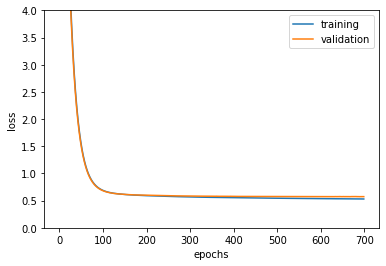

In [709]:
# training-validation loss
plt.plot(history_shallow['loss'], label='training')
plt.plot(history_shallow['val_loss'], label='validation')
plt.ylim(0,4)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

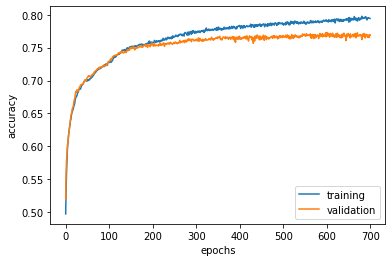

In [710]:
# training-validation accuracy
plt.plot(history_shallow['accuracy'], label='training')
plt.plot(history_shallow['val_accuracy'], label='validation')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

In [711]:
# internal test 
threshold = 0.50
# convert prediciton to binary 
y_pred = model_shallow.predict(X_test_int, verbose=2)
y_pred = y_pred > threshold

print('Accuracy %s' % accuracy_score(y_test_int, y_pred))
print('F1-score %s' % f1_score(y_test_int, y_pred, average=None))
print(classification_report(y_test_int, y_pred))

87/87 - 0s
Accuracy 0.7577076532462822
F1-score [0.69188192 0.80035864]
              precision    recall  f1-score   support

           0       0.72      0.66      0.69      1132
           1       0.78      0.82      0.80      1625

    accuracy                           0.76      2757
   macro avg       0.75      0.74      0.75      2757
weighted avg       0.76      0.76      0.76      2757



### SGD - without  - L2 regularization

In [754]:
def MLP_shallow_ng():
    initializer = tf.keras.initializers.GlorotNormal()
    input_dim = X_train.shape[1]
    
    model = Sequential()
    model.add(Dense(60, activation='relu', input_dim=input_dim,kernel_initializer=initializer,kernel_regularizer=regularizers.l2(0.02) ))    
    model.add(Dense(20, activation='relu', input_dim=input_dim,kernel_initializer=initializer, kernel_regularizer=regularizers.l2(0.02)))    

    #output layer
    model.add(Dense(1, activation='sigmoid',kernel_initializer=initializer))

    return model

In [755]:
model_shallow_ng = MLP_shallow_ng()

# define optimizer
sgd = SGD(learning_rate=0.001, momentum=0.7, nesterov=True
)
model_shallow_ng.compile(optimizer=sgd, loss='binary_crossentropy', metrics=['accuracy'])
# print model information
model_shallow_ng.summary()

Model: "sequential_128"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_384 (Dense)            (None, 60)                31140     
_________________________________________________________________
dense_385 (Dense)            (None, 20)                1220      
_________________________________________________________________
dense_386 (Dense)            (None, 1)                 21        
Total params: 32,381
Trainable params: 32,381
Non-trainable params: 0
_________________________________________________________________


In [756]:
history_shallow_ng =model_shallow_ng.fit(X_train, y_train, epochs= 700, validation_split=0.3, batch_size=120, shuffle=True, verbose=False).history

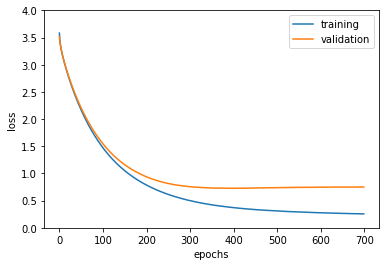

In [757]:
# training-validation loss
plt.plot(history_shallow_ng['loss'], label='training')
plt.plot(history_shallow_ng['val_loss'], label='validation')
plt.ylim(0,4)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

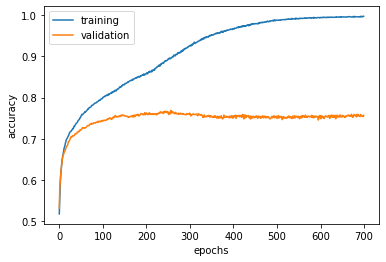

In [758]:
# training-validation accuracy
plt.plot(history_shallow_ng['accuracy'], label='training')
plt.plot(history_shallow_ng['val_accuracy'], label='validation')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

In [761]:
# internal test 
threshold = 0.50
# convert prediciton to binary 
y_pred = model_shallow_ng.predict(X_test_int, verbose=2)
y_pred = y_pred > threshold

print('Accuracy %s' % accuracy_score(y_test_int, y_pred))
print('F1-score %s' % f1_score(y_test_int, y_pred, average=None))
print(classification_report(y_test_int, y_pred))

87/87 - 0s
Accuracy 0.750816104461371
F1-score [0.69206634 0.79074018]
              precision    recall  f1-score   support

           0       0.70      0.68      0.69      1132
           1       0.78      0.80      0.79      1625

    accuracy                           0.75      2757
   macro avg       0.74      0.74      0.74      2757
weighted avg       0.75      0.75      0.75      2757



# Random Search - Hyperparameter tuning

It will be performed first a coarse random search in order to restric the search space. The best model will be then fed to a fine random search which will fine tune the hyperparameters found by the coarse search.

In [101]:
from sklearn.model_selection import RandomizedSearchCV

In [762]:
def ANN(n_layers=2, h_dim=64, activation='relu',learning_rate=0.01,
                momentum=0.0,nesterov=True, optimizer='sgd', lambd=0,  **kwargs):
    # define the model
    model = Sequential()

    n_feature = X_train.shape[1]
    
    model.add(Dense(60, activation=activation, input_shape=(n_feature,),kernel_regularizer=regularizers.l2(lambd)))
    for i in range(n_layers-1):
        model.add(Dense(h_dim, activation=activation,kernel_regularizer=regularizers.l2(lambd)))
        
    #linear activation
    model.add(Dense(1, activation='sigmoid'))

    #compile the model
    if optimizer == 'sgd':
        optimizer = SGD(learning_rate=learning_rate, momentum=momentum, nesterov=nesterov)
    else:
        raise ValueError('accepted optimizers are Adam and SGD')
        
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    
    return model

In [763]:
# parameters' grid
n_layers = [1, 2]
h_dim = [20, 50]
activation = ['relu']
optimizer = [ 'sgd']
momentum = [random.uniform(0.65,0.8)]
learning_rate=[random.uniform(0.001,0.0017)]
lambd = [random.uniform(0.10, 0.13)]

params = dict(optimizer=optimizer, n_layers=n_layers, h_dim=h_dim, activation=activation, momentum=momentum,
             learning_rate=learning_rate, lambd=lambd)

In [766]:
# coarse grid search
model = KerasClassifier(build_fn=ANN)

rnd = RandomizedSearchCV(estimator=model, param_distributions=params, n_iter=10, cv=5)
rnd_result = rnd.fit(X_train, y_train, epochs=700, batch_size=120,shuffle=True, verbose=1)

In [765]:
# results random search - avg 5 fold cv
print("Best: %f using %s" % (rnd_result.best_score_, rnd_result.best_params_))
means = rnd_result.cv_results_['mean_test_score']
stds = rnd_result.cv_results_['std_test_score']
params = rnd_result.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.752219 using {'optimizer': 'sgd', 'n_layers': 1, 'momentum': 0.7934243001699697, 'learning_rate': 0.0011222982488957825, 'lambd': 0.11744317773833411, 'h_dim': 20, 'activation': 'relu'}
0.752219 (0.013788) with: {'optimizer': 'sgd', 'n_layers': 1, 'momentum': 0.7934243001699697, 'learning_rate': 0.0011222982488957825, 'lambd': 0.11744317773833411, 'h_dim': 20, 'activation': 'relu'}
0.746313 (0.016053) with: {'optimizer': 'sgd', 'n_layers': 2, 'momentum': 0.7934243001699697, 'learning_rate': 0.0011222982488957825, 'lambd': 0.11744317773833411, 'h_dim': 20, 'activation': 'relu'}
0.748801 (0.016338) with: {'optimizer': 'sgd', 'n_layers': 1, 'momentum': 0.7934243001699697, 'learning_rate': 0.0011222982488957825, 'lambd': 0.11744317773833411, 'h_dim': 50, 'activation': 'relu'}
0.747090 (0.014120) with: {'optimizer': 'sgd', 'n_layers': 2, 'momentum': 0.7934243001699697, 'learning_rate': 0.0011222982488957825, 'lambd': 0.11744317773833411, 'h_dim': 50, 'activation': 'relu'}


The best model tested so far has the following architecture: (518, 60, 20).<br>
In the first screening several combination of hyperparameters were tested on the validation set. <br>
The results obtained were satisfactory compared to other architectures, therefore we started a random search starting from that model. The goal was to improve the performance of the model by fine tuning its hyperparameter.

## Check how the best model behaves

In [779]:
def MLP_best():
    initializer = tf.keras.initializers.GlorotNormal()
    input_dim = X_train.shape[1]
    
    model = Sequential()
    model.add(Dense(60, activation='relu', input_dim=input_dim,kernel_initializer=initializer, kernel_regularizer=regularizers.l2(0.12)))    
    model.add(Dense(20, activation='relu', input_dim=input_dim,kernel_initializer=initializer, kernel_regularizer=regularizers.l2(0.11744317773833411)))    

    #output layer
    model.add(Dense(1, activation='sigmoid',kernel_initializer=initializer))

    return model

In [768]:
model_best = MLP_best()

# define optimizer
sgd = SGD(learning_rate=0.0011222982488957825, momentum=0.7934243001699697, nesterov=True
)
model_best.compile(optimizer=sgd, loss='binary_crossentropy', metrics=['accuracy'])
# print model information
model_best.summary()

Model: "sequential_150"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_439 (Dense)            (None, 60)                31140     
_________________________________________________________________
dense_440 (Dense)            (None, 20)                1220      
_________________________________________________________________
dense_441 (Dense)            (None, 1)                 21        
Total params: 32,381
Trainable params: 32,381
Non-trainable params: 0
_________________________________________________________________


In [769]:
history_best =model_best.fit(X_train, y_train, epochs= 700, validation_split=0.3, batch_size=120, shuffle=True, verbose=True).history

Epoch 1/700
38/38 [==============================] - 0s 8ms/step - loss: 16.4969 - accuracy: 0.5048 - val_loss: 15.6905 - val_accuracy: 0.5238
Epoch 2/700
38/38 [==============================] - 0s 4ms/step - loss: 14.9780 - accuracy: 0.5503 - val_loss: 14.2469 - val_accuracy: 0.5637
Epoch 3/700
38/38 [==============================] - 0s 4ms/step - loss: 13.6102 - accuracy: 0.5809 - val_loss: 12.9518 - val_accuracy: 0.5881
Epoch 4/700
38/38 [==============================] - 0s 5ms/step - loss: 12.3783 - accuracy: 0.6032 - val_loss: 11.7837 - val_accuracy: 0.6021
Epoch 5/700
38/38 [==============================] - 0s 6ms/step - loss: 11.2659 - accuracy: 0.6176 - val_loss: 10.7285 - val_accuracy: 0.6135
Epoch 6/700
38/38 [==============================] - 0s 5ms/step - loss: 10.2604 - accuracy: 0.6249 - val_loss: 9.7741 - val_accuracy: 0.6249
Epoch 7/700
38/38 [==============================] - 0s 5ms/step - loss: 9.3509 - accuracy: 0.6349 - val_loss: 8.9106 - val_accuracy: 0.6347
Ep

Epoch 59/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6941 - accuracy: 0.7015 - val_loss: 0.6845 - val_accuracy: 0.7036
Epoch 60/700
38/38 [==============================] - 0s 5ms/step - loss: 0.6889 - accuracy: 0.7040 - val_loss: 0.6797 - val_accuracy: 0.7041
Epoch 61/700
38/38 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7044 - val_loss: 0.6749 - val_accuracy: 0.7047
Epoch 62/700
38/38 [==============================] - 0s 5ms/step - loss: 0.6796 - accuracy: 0.7042 - val_loss: 0.6708 - val_accuracy: 0.7057
Epoch 63/700
38/38 [==============================] - 0s 5ms/step - loss: 0.6755 - accuracy: 0.7038 - val_loss: 0.6668 - val_accuracy: 0.7088
Epoch 64/700
38/38 [==============================] - 0s 5ms/step - loss: 0.6718 - accuracy: 0.7051 - val_loss: 0.6633 - val_accuracy: 0.7114
Epoch 65/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6683 - accuracy: 0.7058 - val_loss: 0.6602 - val_accuracy: 0.7145
Epoch 

38/38 [==============================] - 0s 4ms/step - loss: 0.6110 - accuracy: 0.7486 - val_loss: 0.6106 - val_accuracy: 0.7482
Epoch 117/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6104 - accuracy: 0.7468 - val_loss: 0.6101 - val_accuracy: 0.7461
Epoch 118/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6100 - accuracy: 0.7482 - val_loss: 0.6097 - val_accuracy: 0.7487
Epoch 119/700
38/38 [==============================] - 0s 3ms/step - loss: 0.6094 - accuracy: 0.7497 - val_loss: 0.6094 - val_accuracy: 0.7492
Epoch 120/700
38/38 [==============================] - 0s 3ms/step - loss: 0.6088 - accuracy: 0.7508 - val_loss: 0.6087 - val_accuracy: 0.7497
Epoch 121/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6082 - accuracy: 0.7508 - val_loss: 0.6086 - val_accuracy: 0.7482
Epoch 122/700
38/38 [==============================] - 0s 4ms/step - loss: 0.6078 - accuracy: 0.7497 - val_loss: 0.6079 - val_accuracy: 0.7492
Epoch 123/700

38/38 [==============================] - 0s 4ms/step - loss: 0.5860 - accuracy: 0.7619 - val_loss: 0.5928 - val_accuracy: 0.7570
Epoch 174/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5856 - accuracy: 0.7628 - val_loss: 0.5931 - val_accuracy: 0.7570
Epoch 175/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5851 - accuracy: 0.7637 - val_loss: 0.5937 - val_accuracy: 0.7523
Epoch 176/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5849 - accuracy: 0.7635 - val_loss: 0.5923 - val_accuracy: 0.7575
Epoch 177/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5845 - accuracy: 0.7630 - val_loss: 0.5920 - val_accuracy: 0.7591
Epoch 178/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5842 - accuracy: 0.7628 - val_loss: 0.5922 - val_accuracy: 0.7575
Epoch 179/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5840 - accuracy: 0.7653 - val_loss: 0.5918 - val_accuracy: 0.7565
Epoch 180/700

38/38 [==============================] - 0s 5ms/step - loss: 0.5704 - accuracy: 0.7717 - val_loss: 0.5845 - val_accuracy: 0.7622
Epoch 231/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5703 - accuracy: 0.7695 - val_loss: 0.5838 - val_accuracy: 0.7653
Epoch 232/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5702 - accuracy: 0.7679 - val_loss: 0.5839 - val_accuracy: 0.7611
Epoch 233/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5699 - accuracy: 0.7728 - val_loss: 0.5833 - val_accuracy: 0.7617
Epoch 234/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5697 - accuracy: 0.7706 - val_loss: 0.5841 - val_accuracy: 0.7653
Epoch 235/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5693 - accuracy: 0.7733 - val_loss: 0.5844 - val_accuracy: 0.7622
Epoch 236/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5693 - accuracy: 0.7728 - val_loss: 0.5831 - val_accuracy: 0.7622
Epoch 237/700

38/38 [==============================] - 0s 5ms/step - loss: 0.5605 - accuracy: 0.7715 - val_loss: 0.5802 - val_accuracy: 0.7668
Epoch 288/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5599 - accuracy: 0.7753 - val_loss: 0.5791 - val_accuracy: 0.7668
Epoch 289/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5598 - accuracy: 0.7746 - val_loss: 0.5793 - val_accuracy: 0.7637
Epoch 290/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5596 - accuracy: 0.7764 - val_loss: 0.5795 - val_accuracy: 0.7596
Epoch 291/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5597 - accuracy: 0.7735 - val_loss: 0.5785 - val_accuracy: 0.7684
Epoch 292/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5593 - accuracy: 0.7773 - val_loss: 0.5791 - val_accuracy: 0.7679
Epoch 293/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5595 - accuracy: 0.7777 - val_loss: 0.5790 - val_accuracy: 0.7591
Epoch 294/700

38/38 [==============================] - 0s 3ms/step - loss: 0.5530 - accuracy: 0.7781 - val_loss: 0.5768 - val_accuracy: 0.7648
Epoch 345/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5523 - accuracy: 0.7777 - val_loss: 0.5771 - val_accuracy: 0.7653
Epoch 346/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5525 - accuracy: 0.7790 - val_loss: 0.5770 - val_accuracy: 0.7694
Epoch 347/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5526 - accuracy: 0.7795 - val_loss: 0.5765 - val_accuracy: 0.7674
Epoch 348/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5525 - accuracy: 0.7779 - val_loss: 0.5764 - val_accuracy: 0.7663
Epoch 349/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5520 - accuracy: 0.7770 - val_loss: 0.5791 - val_accuracy: 0.7627
Epoch 350/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5520 - accuracy: 0.7781 - val_loss: 0.5763 - val_accuracy: 0.7611
Epoch 351/700

38/38 [==============================] - 0s 3ms/step - loss: 0.5464 - accuracy: 0.7813 - val_loss: 0.5742 - val_accuracy: 0.7668
Epoch 402/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.7817 - val_loss: 0.5754 - val_accuracy: 0.7674
Epoch 403/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5462 - accuracy: 0.7828 - val_loss: 0.5758 - val_accuracy: 0.7632
Epoch 404/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5467 - accuracy: 0.7826 - val_loss: 0.5750 - val_accuracy: 0.7663
Epoch 405/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5462 - accuracy: 0.7826 - val_loss: 0.5754 - val_accuracy: 0.7668
Epoch 406/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.7857 - val_loss: 0.5765 - val_accuracy: 0.7653
Epoch 407/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5466 - accuracy: 0.7844 - val_loss: 0.5736 - val_accuracy: 0.7658
Epoch 408/700

38/38 [==============================] - 0s 3ms/step - loss: 0.5414 - accuracy: 0.7861 - val_loss: 0.5734 - val_accuracy: 0.7668
Epoch 459/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5416 - accuracy: 0.7853 - val_loss: 0.5745 - val_accuracy: 0.7663
Epoch 460/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5413 - accuracy: 0.7846 - val_loss: 0.5727 - val_accuracy: 0.7642
Epoch 461/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5413 - accuracy: 0.7839 - val_loss: 0.5730 - val_accuracy: 0.7689
Epoch 462/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5414 - accuracy: 0.7859 - val_loss: 0.5727 - val_accuracy: 0.7668
Epoch 463/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5411 - accuracy: 0.7866 - val_loss: 0.5742 - val_accuracy: 0.7674
Epoch 464/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5408 - accuracy: 0.7837 - val_loss: 0.5726 - val_accuracy: 0.7617
Epoch 465/700

38/38 [==============================] - 0s 3ms/step - loss: 0.5368 - accuracy: 0.7888 - val_loss: 0.5725 - val_accuracy: 0.7674
Epoch 516/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5373 - accuracy: 0.7879 - val_loss: 0.5719 - val_accuracy: 0.7617
Epoch 517/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5368 - accuracy: 0.7879 - val_loss: 0.5735 - val_accuracy: 0.7627
Epoch 518/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5371 - accuracy: 0.7875 - val_loss: 0.5734 - val_accuracy: 0.7627
Epoch 519/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5366 - accuracy: 0.7879 - val_loss: 0.5739 - val_accuracy: 0.7658
Epoch 520/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5365 - accuracy: 0.7877 - val_loss: 0.5746 - val_accuracy: 0.7679
Epoch 521/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5368 - accuracy: 0.7868 - val_loss: 0.5724 - val_accuracy: 0.7715
Epoch 522/700

38/38 [==============================] - 0s 3ms/step - loss: 0.5327 - accuracy: 0.7899 - val_loss: 0.5728 - val_accuracy: 0.7679
Epoch 573/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5329 - accuracy: 0.7888 - val_loss: 0.5745 - val_accuracy: 0.7684
Epoch 574/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5330 - accuracy: 0.7910 - val_loss: 0.5716 - val_accuracy: 0.7663
Epoch 575/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5325 - accuracy: 0.7919 - val_loss: 0.5743 - val_accuracy: 0.7663
Epoch 576/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5333 - accuracy: 0.7893 - val_loss: 0.5715 - val_accuracy: 0.7679
Epoch 577/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5320 - accuracy: 0.7917 - val_loss: 0.5736 - val_accuracy: 0.7674
Epoch 578/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5319 - accuracy: 0.7893 - val_loss: 0.5721 - val_accuracy: 0.7653
Epoch 579/700

38/38 [==============================] - 0s 3ms/step - loss: 0.5296 - accuracy: 0.7917 - val_loss: 0.5721 - val_accuracy: 0.7668
Epoch 630/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5291 - accuracy: 0.7919 - val_loss: 0.5717 - val_accuracy: 0.7658
Epoch 631/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.7915 - val_loss: 0.5725 - val_accuracy: 0.7611
Epoch 632/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5285 - accuracy: 0.7946 - val_loss: 0.5798 - val_accuracy: 0.7653
Epoch 633/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5293 - accuracy: 0.7950 - val_loss: 0.5730 - val_accuracy: 0.7674
Epoch 634/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5286 - accuracy: 0.7924 - val_loss: 0.5718 - val_accuracy: 0.7658
Epoch 635/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5282 - accuracy: 0.7935 - val_loss: 0.5745 - val_accuracy: 0.7642
Epoch 636/700

38/38 [==============================] - 0s 4ms/step - loss: 0.5266 - accuracy: 0.7950 - val_loss: 0.5721 - val_accuracy: 0.7642
Epoch 687/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5260 - accuracy: 0.7972 - val_loss: 0.5732 - val_accuracy: 0.7617
Epoch 688/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5253 - accuracy: 0.7961 - val_loss: 0.5724 - val_accuracy: 0.7694
Epoch 689/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5253 - accuracy: 0.7961 - val_loss: 0.5736 - val_accuracy: 0.7617
Epoch 690/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5254 - accuracy: 0.8008 - val_loss: 0.5744 - val_accuracy: 0.7642
Epoch 691/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5254 - accuracy: 0.7944 - val_loss: 0.5730 - val_accuracy: 0.7684
Epoch 692/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5262 - accuracy: 0.7964 - val_loss: 0.5739 - val_accuracy: 0.7705
Epoch 693/700

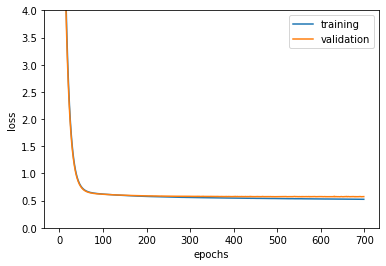

In [770]:
# training-validation loss
plt.plot(history_best['loss'], label='training')
plt.plot(history_best['val_loss'], label='validation')
plt.ylim(0,4)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

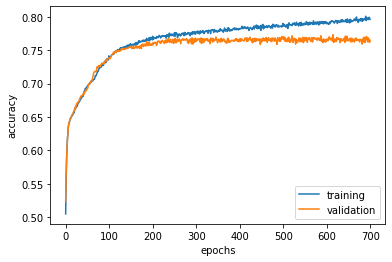

In [771]:
# training-validation accuracy
plt.plot(history_best['accuracy'], label='training')
plt.plot(history_best['val_accuracy'], label='validation')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

In [772]:
# internal test 
threshold = 0.50
# convert prediciton to binary 
y_pred = model_best.predict(X_test_int, verbose=2)
y_pred = y_pred > threshold

print('Accuracy %s' % accuracy_score(y_test_int, y_pred))
print('F1-score %s' % f1_score(y_test_int, y_pred, average=None))
print(classification_report(y_test_int, y_pred))

87/87 - 0s
Accuracy 0.7598839318099383
F1-score [0.69549218 0.80179641]
              precision    recall  f1-score   support

           0       0.73      0.67      0.70      1132
           1       0.78      0.82      0.80      1625

    accuracy                           0.76      2757
   macro avg       0.75      0.75      0.75      2757
weighted avg       0.76      0.76      0.76      2757



## If we use Adam instead of SGD will the performance improve?

In [773]:
model_best_adam = MLP_best()

# define optimizer
adam = Adam(learning_rate=0.0011222982488957825)
model_best_adam.compile(optimizer=adam, loss='binary_crossentropy', metrics=['accuracy'])
# print model information
model_best_adam.summary()

Model: "sequential_151"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_442 (Dense)            (None, 60)                31140     
_________________________________________________________________
dense_443 (Dense)            (None, 20)                1220      
_________________________________________________________________
dense_444 (Dense)            (None, 1)                 21        
Total params: 32,381
Trainable params: 32,381
Non-trainable params: 0
_________________________________________________________________


In [774]:
history_best_adam =model_best_adam.fit(X_train, y_train, epochs= 700, validation_split=0.3, batch_size=120, shuffle=True, verbose=True).history

Epoch 1/700
38/38 [==============================] - 0s 7ms/step - loss: 11.3129 - accuracy: 0.5878 - val_loss: 6.6349 - val_accuracy: 0.6725
Epoch 2/700
38/38 [==============================] - 0s 4ms/step - loss: 4.5612 - accuracy: 0.6835 - val_loss: 2.9937 - val_accuracy: 0.6881
Epoch 3/700
38/38 [==============================] - 0s 4ms/step - loss: 2.2936 - accuracy: 0.6953 - val_loss: 1.7362 - val_accuracy: 0.7197
Epoch 4/700
38/38 [==============================] - 0s 5ms/step - loss: 1.4666 - accuracy: 0.7106 - val_loss: 1.2295 - val_accuracy: 0.7295
Epoch 5/700
38/38 [==============================] - 0s 5ms/step - loss: 1.1071 - accuracy: 0.7155 - val_loss: 0.9774 - val_accuracy: 0.7285
Epoch 6/700
38/38 [==============================] - 0s 5ms/step - loss: 0.9179 - accuracy: 0.7075 - val_loss: 0.8490 - val_accuracy: 0.7083
Epoch 7/700
38/38 [==============================] - 0s 4ms/step - loss: 0.8091 - accuracy: 0.7073 - val_loss: 0.7545 - val_accuracy: 0.7207
Epoch 8/700


38/38 [==============================] - 0s 5ms/step - loss: 0.5619 - accuracy: 0.7593 - val_loss: 0.5762 - val_accuracy: 0.7503
Epoch 59/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5663 - accuracy: 0.7606 - val_loss: 0.5699 - val_accuracy: 0.7534
Epoch 60/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5610 - accuracy: 0.7595 - val_loss: 0.5773 - val_accuracy: 0.7554
Epoch 61/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5591 - accuracy: 0.7646 - val_loss: 0.5707 - val_accuracy: 0.7627
Epoch 62/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5625 - accuracy: 0.7568 - val_loss: 0.5733 - val_accuracy: 0.7456
Epoch 63/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5608 - accuracy: 0.7577 - val_loss: 0.5638 - val_accuracy: 0.7679
Epoch 64/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5638 - accuracy: 0.7566 - val_loss: 0.5670 - val_accuracy: 0.7601
Epoch 65/700
38/38 

Epoch 116/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5347 - accuracy: 0.7781 - val_loss: 0.5660 - val_accuracy: 0.7534
Epoch 117/700
38/38 [==============================] - 0s 6ms/step - loss: 0.5313 - accuracy: 0.7750 - val_loss: 0.5731 - val_accuracy: 0.7482
Epoch 118/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5292 - accuracy: 0.7730 - val_loss: 0.5816 - val_accuracy: 0.7394
Epoch 119/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5333 - accuracy: 0.7753 - val_loss: 0.5635 - val_accuracy: 0.7466
Epoch 120/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5302 - accuracy: 0.7784 - val_loss: 0.5684 - val_accuracy: 0.7466
Epoch 121/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5274 - accuracy: 0.7793 - val_loss: 0.5688 - val_accuracy: 0.7518
Epoch 122/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5315 - accuracy: 0.7808 - val_loss: 0.5685 - val_accuracy: 0.7487

38/38 [==============================] - 0s 4ms/step - loss: 0.5188 - accuracy: 0.7777 - val_loss: 0.5720 - val_accuracy: 0.7394
Epoch 174/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5164 - accuracy: 0.7868 - val_loss: 0.5787 - val_accuracy: 0.7446
Epoch 175/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5200 - accuracy: 0.7788 - val_loss: 0.5675 - val_accuracy: 0.7425
Epoch 176/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5183 - accuracy: 0.7804 - val_loss: 0.5778 - val_accuracy: 0.7513
Epoch 177/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5158 - accuracy: 0.7859 - val_loss: 0.5605 - val_accuracy: 0.7497
Epoch 178/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5142 - accuracy: 0.7908 - val_loss: 0.5627 - val_accuracy: 0.7549
Epoch 179/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5202 - accuracy: 0.7884 - val_loss: 0.5759 - val_accuracy: 0.7461
Epoch 180/700

38/38 [==============================] - 0s 5ms/step - loss: 0.5082 - accuracy: 0.7899 - val_loss: 0.5683 - val_accuracy: 0.7518
Epoch 231/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5063 - accuracy: 0.7870 - val_loss: 0.5750 - val_accuracy: 0.7461
Epoch 232/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5116 - accuracy: 0.7853 - val_loss: 0.5568 - val_accuracy: 0.7466
Epoch 233/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5084 - accuracy: 0.7919 - val_loss: 0.5689 - val_accuracy: 0.7518
Epoch 234/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5096 - accuracy: 0.7873 - val_loss: 0.5770 - val_accuracy: 0.7477
Epoch 235/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5112 - accuracy: 0.7864 - val_loss: 0.5654 - val_accuracy: 0.7560
Epoch 236/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5067 - accuracy: 0.7866 - val_loss: 0.5704 - val_accuracy: 0.7461
Epoch 237/700

38/38 [==============================] - 0s 3ms/step - loss: 0.5037 - accuracy: 0.7919 - val_loss: 0.5684 - val_accuracy: 0.7492
Epoch 288/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5074 - accuracy: 0.7810 - val_loss: 0.5772 - val_accuracy: 0.7456
Epoch 289/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5055 - accuracy: 0.7815 - val_loss: 0.5755 - val_accuracy: 0.7409
Epoch 290/700
38/38 [==============================] - 0s 7ms/step - loss: 0.5164 - accuracy: 0.7879 - val_loss: 0.5761 - val_accuracy: 0.7513
Epoch 291/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5021 - accuracy: 0.7939 - val_loss: 0.5665 - val_accuracy: 0.7580
Epoch 292/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5037 - accuracy: 0.7952 - val_loss: 0.5705 - val_accuracy: 0.7570
Epoch 293/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5012 - accuracy: 0.7884 - val_loss: 0.5777 - val_accuracy: 0.7482
Epoch 294/700

38/38 [==============================] - 0s 4ms/step - loss: 0.5026 - accuracy: 0.7917 - val_loss: 0.6017 - val_accuracy: 0.7358
Epoch 345/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5064 - accuracy: 0.7881 - val_loss: 0.5869 - val_accuracy: 0.7394
Epoch 346/700
38/38 [==============================] - 0s 3ms/step - loss: 0.5082 - accuracy: 0.7833 - val_loss: 0.5736 - val_accuracy: 0.7539
Epoch 347/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5027 - accuracy: 0.7930 - val_loss: 0.5850 - val_accuracy: 0.7425
Epoch 348/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4941 - accuracy: 0.7966 - val_loss: 0.5741 - val_accuracy: 0.7482
Epoch 349/700
38/38 [==============================] - 0s 5ms/step - loss: 0.5016 - accuracy: 0.7937 - val_loss: 0.5806 - val_accuracy: 0.7415
Epoch 350/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5037 - accuracy: 0.7875 - val_loss: 0.5921 - val_accuracy: 0.7363
Epoch 351/700

38/38 [==============================] - 0s 3ms/step - loss: 0.4984 - accuracy: 0.7988 - val_loss: 0.5822 - val_accuracy: 0.7394
Epoch 402/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4941 - accuracy: 0.7908 - val_loss: 0.5817 - val_accuracy: 0.7492
Epoch 403/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4985 - accuracy: 0.7899 - val_loss: 0.5812 - val_accuracy: 0.7513
Epoch 404/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7972 - val_loss: 0.5798 - val_accuracy: 0.7446
Epoch 405/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.8004 - val_loss: 0.5807 - val_accuracy: 0.7430
Epoch 406/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4941 - accuracy: 0.7917 - val_loss: 0.5807 - val_accuracy: 0.7389
Epoch 407/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7919 - val_loss: 0.5778 - val_accuracy: 0.7456
Epoch 408/700

38/38 [==============================] - 0s 4ms/step - loss: 0.4945 - accuracy: 0.7977 - val_loss: 0.5933 - val_accuracy: 0.7363
Epoch 459/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4919 - accuracy: 0.7979 - val_loss: 0.5795 - val_accuracy: 0.7549
Epoch 460/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4934 - accuracy: 0.8008 - val_loss: 0.5944 - val_accuracy: 0.7420
Epoch 461/700
38/38 [==============================] - 0s 4ms/step - loss: 0.5037 - accuracy: 0.7919 - val_loss: 0.5824 - val_accuracy: 0.7601
Epoch 462/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4918 - accuracy: 0.7950 - val_loss: 0.5841 - val_accuracy: 0.7451
Epoch 463/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4904 - accuracy: 0.7970 - val_loss: 0.5872 - val_accuracy: 0.7435
Epoch 464/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7984 - val_loss: 0.5996 - val_accuracy: 0.7373
Epoch 465/700

38/38 [==============================] - 0s 7ms/step - loss: 0.4957 - accuracy: 0.7984 - val_loss: 0.5835 - val_accuracy: 0.7472
Epoch 516/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4952 - accuracy: 0.7977 - val_loss: 0.5713 - val_accuracy: 0.7518
Epoch 517/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4901 - accuracy: 0.7972 - val_loss: 0.5759 - val_accuracy: 0.7539
Epoch 518/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4878 - accuracy: 0.7970 - val_loss: 0.5960 - val_accuracy: 0.7420
Epoch 519/700
38/38 [==============================] - 0s 5ms/step - loss: 0.4872 - accuracy: 0.7995 - val_loss: 0.5961 - val_accuracy: 0.7358
Epoch 520/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4952 - accuracy: 0.7899 - val_loss: 0.5762 - val_accuracy: 0.7544
Epoch 521/700
38/38 [==============================] - 0s 5ms/step - loss: 0.4843 - accuracy: 0.8059 - val_loss: 0.5870 - val_accuracy: 0.7409
Epoch 522/700

38/38 [==============================] - 0s 6ms/step - loss: 0.4812 - accuracy: 0.8072 - val_loss: 0.5785 - val_accuracy: 0.7560
Epoch 573/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4845 - accuracy: 0.8010 - val_loss: 0.6014 - val_accuracy: 0.7394
Epoch 574/700
38/38 [==============================] - 0s 7ms/step - loss: 0.4843 - accuracy: 0.8059 - val_loss: 0.6199 - val_accuracy: 0.7259
Epoch 575/700
38/38 [==============================] - 0s 6ms/step - loss: 0.4901 - accuracy: 0.7961 - val_loss: 0.5959 - val_accuracy: 0.7523
Epoch 576/700
38/38 [==============================] - 0s 5ms/step - loss: 0.4890 - accuracy: 0.7944 - val_loss: 0.5857 - val_accuracy: 0.7363
Epoch 577/700
38/38 [==============================] - 0s 6ms/step - loss: 0.4906 - accuracy: 0.7999 - val_loss: 0.5864 - val_accuracy: 0.7461
Epoch 578/700
38/38 [==============================] - 0s 5ms/step - loss: 0.4846 - accuracy: 0.8017 - val_loss: 0.5839 - val_accuracy: 0.7482
Epoch 579/700

38/38 [==============================] - 0s 4ms/step - loss: 0.4832 - accuracy: 0.8075 - val_loss: 0.5943 - val_accuracy: 0.7326
Epoch 630/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4879 - accuracy: 0.8052 - val_loss: 0.5937 - val_accuracy: 0.7311
Epoch 631/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4813 - accuracy: 0.8064 - val_loss: 0.5981 - val_accuracy: 0.7456
Epoch 632/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4826 - accuracy: 0.8001 - val_loss: 0.6033 - val_accuracy: 0.7415
Epoch 633/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4856 - accuracy: 0.8068 - val_loss: 0.5997 - val_accuracy: 0.7456
Epoch 634/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4814 - accuracy: 0.8086 - val_loss: 0.5928 - val_accuracy: 0.7456
Epoch 635/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4904 - accuracy: 0.7966 - val_loss: 0.5792 - val_accuracy: 0.7477
Epoch 636/700

38/38 [==============================] - 0s 5ms/step - loss: 0.4824 - accuracy: 0.8103 - val_loss: 0.5956 - val_accuracy: 0.7332
Epoch 687/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4796 - accuracy: 0.8139 - val_loss: 0.6154 - val_accuracy: 0.7404
Epoch 688/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4863 - accuracy: 0.8041 - val_loss: 0.5997 - val_accuracy: 0.7456
Epoch 689/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4829 - accuracy: 0.8079 - val_loss: 0.5882 - val_accuracy: 0.7482
Epoch 690/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4896 - accuracy: 0.7970 - val_loss: 0.6120 - val_accuracy: 0.7456
Epoch 691/700
38/38 [==============================] - 0s 4ms/step - loss: 0.4905 - accuracy: 0.8006 - val_loss: 0.5859 - val_accuracy: 0.7425
Epoch 692/700
38/38 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.8046 - val_loss: 0.5931 - val_accuracy: 0.7472
Epoch 693/700

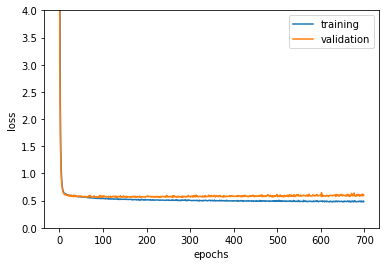

In [775]:
# training-validation loss
plt.plot(history_best_adam['loss'], label='training')
plt.plot(history_best_adam['val_loss'], label='validation')
plt.ylim(0,4)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

Maintaining the same configuration and changing the optimizer, we notice that with Adam optimizer the model shows a slight overfitting.

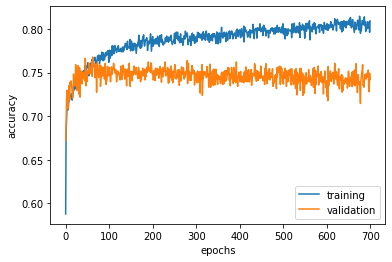

In [776]:
# training-validation accuracy
plt.plot(history_best_adam['accuracy'], label='training')
plt.plot(history_best_adam['val_accuracy'], label='validation')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

## Let's do another Random Search testing other architectures

In [103]:
def build_model(n_layers=2, h_dim=64, activation='relu',learning_rate=0.01,
                momentum=0.0,nesterov=True, optimizer='adam', lambd=0, dropout_rate=0, **kwargs):
    # define the model
    model = Sequential()

    n_feature = X_train.shape[1]
    
    model.add(Dense(h_dim, activation=activation, input_shape=(n_feature,),kernel_regularizer=regularizers.l2(lambd)))
    model.add(Dropout(dropout_rate))
    for i in range(n_layers-1):
        model.add(Dense(h_dim, activation=activation,kernel_regularizer=regularizers.l2(lambd)))
        model.add(Dropout(dropout_rate))

    #linear activation
    model.add(Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(lambd)))

    #compile the model
    if optimizer == 'adam':
        optimizer = Adam(lr=learning_rate)
    elif optimizer == 'sgd':
        optimizer = SGD(learning_rate=learning_rate, momentum=momentum, nesterov=nesterov)
    else:
        raise ValueError('accepted optimizers are Adam and SGD')
        
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    
    return model

#### Coarse Random-Search 

In [1135]:
# parameters' grid
n_layers = [1, 2, 3]
h_dim = [30, 50, 128]
activation = ['relu']
optimizer = ['adam', 'sgd']
momentum = [0.5, 0.8]
learning_rate=[0.1, 0.01, 0.001, 0.0001]
lambd = [0, 1e-1, 1e-2, 1e-3]

params = dict(optimizer=optimizer, n_layers=n_layers, h_dim=h_dim, activation=activation, momentum=momentum,
             learning_rate=learning_rate, lambd=lambd)

In [1136]:
# coarse grid search
model = KerasClassifier(build_fn=build_model)

rnd = RandomizedSearchCV(estimator=model, param_distributions=params, n_iter=100, cv=5)
rnd_result = rnd.fit(X_train, y_train, epochs=500, batch_size=20,shuffle=True, verbose=1)

Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 1.5553 - accuracy: 0.5602
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 1.4267 - accuracy: 0.6325
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3480 - accuracy: 0.6422
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 1.2718 - accuracy: 0.6669
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2077 - accuracy: 0.6832
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1476 - accuracy: 0.7103
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0945 - accuracy: 0.7087
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0414 - accuracy: 0.7254
Epoch 9/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9995 - accuracy: 0.7367
Epoch 10/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9549 - accura

258/258 [==============================] - 0s 2ms/step - loss: 0.4381 - accuracy: 0.8898
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4363 - accuracy: 0.8923
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4362 - accuracy: 0.8923
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4362 - accuracy: 0.8906
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.8904
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4347 - accuracy: 0.8912
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4357 - accuracy: 0.8925
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.8931
Epoch 89/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.8941
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4267 - accuracy: 

258/258 [==============================] - 1s 4ms/step - loss: 0.5424 - accuracy: 0.8210: 0s - loss: 0.543
Epoch 39/200
258/258 [==============================] - 1s 5ms/step - loss: 0.5318 - accuracy: 0.8292
Epoch 40/200
258/258 [==============================] - 2s 6ms/step - loss: 0.5284 - accuracy: 0.8358: 1s - loss: 0.5222 - accu - ETA: 1s - loss: 0.5323 - accuracy: 0. - ETA: 0s - loss:
Epoch 41/200
258/258 [==============================] - 2s 6ms/step - loss: 0.5289 - accuracy: 0.8294
Epoch 42/200
258/258 [==============================] - 1s 5ms/step - loss: 0.5211 - accuracy: 0.8379
Epoch 43/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5239 - accuracy: 0.8350
Epoch 44/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5184 - accuracy: 0.8364
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5102 - accuracy: 0.8457
Epoch 46/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5055 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4089 - accuracy: 0.9176
Epoch 195/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.9205
Epoch 196/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4038 - accuracy: 0.9302
Epoch 197/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4087 - accuracy: 0.9219
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4097 - accuracy: 0.9225
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4055 - accuracy: 0.9271
Epoch 200/200
41/41 [==============================] - 0s 922us/step - loss: 0.7374 - accuracy: 0.7343
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 1.6297 - accuracy: 0.5150
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4443 - accuracy: 0.6133
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3446 - accurac

258/258 [==============================] - 0s 1ms/step - loss: 0.4119 - accuracy: 0.9147
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4062 - accuracy: 0.9223
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4039 - accuracy: 0.9215
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4065 - accuracy: 0.9195
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4044 - accuracy: 0.9246
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4035 - accuracy: 0.9232
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3972 - accuracy: 0.9242
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4037 - accuracy: 0.9240
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4072 - accuracy: 0.9229
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4028 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4281 - accuracy: 0.9046
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4203 - accuracy: 0.9104
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4259 - accuracy: 0.9073
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4239 - accuracy: 0.9060
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4230 - accuracy: 0.9042
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4214 - accuracy: 0.9060
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4179 - accuracy: 0.9099
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4175 - accuracy: 0.9095
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4212 - accuracy: 0.9003
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4163 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4662 - accuracy: 0.8683
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4636 - accuracy: 0.8683
Epoch 69/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4653 - accuracy: 0.8724: 0s - loss: 0.4618 - ac
Epoch 70/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4639 - accuracy: 0.8708
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.8694
Epoch 72/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4552 - accuracy: 0.8764
Epoch 73/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4596 - accuracy: 0.8745
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4586 - accuracy: 0.8722
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4555 - accuracy: 0.8755
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - l

258/258 [==============================] - 0s 1ms/step - loss: 0.3363 - accuracy: 0.9178
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3291 - accuracy: 0.9223
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3306 - accuracy: 0.9176
Epoch 27/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3196 - accuracy: 0.9277
Epoch 28/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3266 - accuracy: 0.9297
Epoch 29/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3188 - accuracy: 0.9269: 0s - loss: 0.2966 - 
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3133 - accuracy: 0.9264
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3162 - accuracy: 0.9298
Epoch 32/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2963 - accuracy: 0.9405
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - los

258/258 [==============================] - 0s 1ms/step - loss: 0.2520 - accuracy: 0.9621
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2476 - accuracy: 0.9623
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2531 - accuracy: 0.9637
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2401 - accuracy: 0.9677
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2401 - accuracy: 0.9677
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2408 - accuracy: 0.9687
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2412 - accuracy: 0.9691
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2354 - accuracy: 0.9726
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2299 - accuracy: 0.9738
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2405 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.2243 - accuracy: 0.9794
Epoch 141/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2348 - accuracy: 0.9689
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2410 - accuracy: 0.9689: 0s - loss: 0.2402 - accura
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2500 - accuracy: 0.9619
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2478 - accuracy: 0.9635
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2489 - accuracy: 0.9640
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2648 - accuracy: 0.9584
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2799 - accuracy: 0.9530
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2431 - accuracy: 0.9658
Epoch 149/200
258/258 [==============================] - 0s

258/258 [==============================] - 1s 2ms/step - loss: 0.2604 - accuracy: 0.9607
Epoch 99/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2460 - accuracy: 0.9644
Epoch 100/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2420 - accuracy: 0.9640
Epoch 101/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2513 - accuracy: 0.9633
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2457 - accuracy: 0.9660
Epoch 103/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2537 - accuracy: 0.9563
Epoch 104/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2648 - accuracy: 0.9572
Epoch 105/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2391 - accuracy: 0.9687
Epoch 106/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2367 - accuracy: 0.9677
Epoch 107/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2542 - ac

258/258 [==============================] - 0s 2ms/step - loss: 0.2302 - accuracy: 0.9726
Epoch 178/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2255 - accuracy: 0.9745
Epoch 179/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2254 - accuracy: 0.9728
Epoch 180/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2280 - accuracy: 0.9726
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2403 - accuracy: 0.9672
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2483 - accuracy: 0.9615
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2532 - accuracy: 0.9640
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2587 - accuracy: 0.9541
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2462 - accuracy: 0.9652
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2332 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.2351 - accuracy: 0.9732
Epoch 136/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2377 - accuracy: 0.9703
Epoch 137/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2535 - accuracy: 0.9635
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2455 - accuracy: 0.9672
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2619 - accuracy: 0.9571
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2388 - accuracy: 0.9679
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2486 - accuracy: 0.9646
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2594 - accuracy: 0.9588
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2421 - accuracy: 0.9679
Epoch 144/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2414 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.2772 - accuracy: 0.9530
Epoch 93/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2686 - accuracy: 0.9575
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2752 - accuracy: 0.9573
Epoch 95/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2516 - accuracy: 0.9668
Epoch 96/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2488 - accuracy: 0.9689
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2437 - accuracy: 0.9687
Epoch 98/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2505 - accuracy: 0.9664
Epoch 99/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2741 - accuracy: 0.9567
Epoch 100/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2707 - accuracy: 0.9551
Epoch 101/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2600 - accuracy

258/258 [==============================] - 0s 1ms/step - loss: 0.5423 - accuracy: 0.8103
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5472 - accuracy: 0.8109
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5492 - accuracy: 0.8076
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5421 - accuracy: 0.8088
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5413 - accuracy: 0.8142
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5453 - accuracy: 0.8113
Epoch 56/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5405 - accuracy: 0.8090: 0s - loss: 0.5
Epoch 57/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5456 - accuracy: 0.8195
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5451 - accuracy: 0.8158
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5

Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5493 - accuracy: 0.8230
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5492 - accuracy: 0.8267
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5489 - accuracy: 0.8222
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5488 - accuracy: 0.8224
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5471 - accuracy: 0.8274
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5487 - accuracy: 0.8278
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5464 - accuracy: 0.8214
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5447 - accuracy: 0.8271
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5448 - accuracy: 0.8239
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.5437 - accuracy: 0.8253
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5497 - accuracy: 0.8241
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5486 - accuracy: 0.8257
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5470 - accuracy: 0.8214
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5496 - accuracy: 0.8249
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5470 - accuracy: 0.8296
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5503 - accuracy: 0.8226
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5516 - accuracy: 0.8237
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5467 - accuracy: 0.8302
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5546 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.8160
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5418 - accuracy: 0.8169
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5376 - accuracy: 0.8193
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5380 - accuracy: 0.8140
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5418 - accuracy: 0.8148
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5425 - accuracy: 0.8162
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5368 - accuracy: 0.8193
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5426 - accuracy: 0.8138
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5382 - accuracy: 0.8171
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5398 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 1.2397 - accuracy: 0.7235
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9518 - accuracy: 0.7519
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7847 - accuracy: 0.7581
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6953 - accuracy: 0.7645
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6336 - accuracy: 0.7692
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6022 - accuracy: 0.7742
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5862 - accuracy: 0.7754
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5670 - accuracy: 0.7801
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5611 - accuracy: 0.7869
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5605 - accuracy: 0.7851


258/258 [==============================] - 0s 1ms/step - loss: 0.5576 - accuracy: 0.8228
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5421 - accuracy: 0.8391
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5463 - accuracy: 0.8298
Epoch 163/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5518 - accuracy: 0.8265
Epoch 164/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5503 - accuracy: 0.8228
Epoch 165/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5534 - accuracy: 0.8242
Epoch 166/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5481 - accuracy: 0.8269
Epoch 167/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5512 - accuracy: 0.8248
Epoch 168/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5543 - accuracy: 0.8246: 0s - loss: 0.5475 - ac
Epoch 169/200
258/258 [==============================] - 0s 2ms

258/258 [==============================] - 0s 2ms/step - loss: 0.5595 - accuracy: 0.8018
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5541 - accuracy: 0.8032
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5549 - accuracy: 0.8051
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5569 - accuracy: 0.8007
Epoch 43/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5496 - accuracy: 0.8084
Epoch 44/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5523 - accuracy: 0.8063
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5510 - accuracy: 0.8145
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5568 - accuracy: 0.8030
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5534 - accuracy: 0.8115
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5535 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5559 - accuracy: 0.8275
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5594 - accuracy: 0.8267
Epoch 199/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5504 - accuracy: 0.8335
Epoch 200/200
41/41 [==============================] - 0s 833us/step - loss: 0.6666 - accuracy: 0.7652
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6703 - accuracy: 0.5880
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6228 - accuracy: 0.6430
Epoch 3/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5824 - accuracy: 0.6838
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5578 - accuracy: 0.7033
Epoch 5/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7254
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.7

258/258 [==============================] - 1s 2ms/step - loss: 0.0390 - accuracy: 0.9878
Epoch 156/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0315 - accuracy: 0.9909
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0300 - accuracy: 0.9887
Epoch 158/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0369 - accuracy: 0.9876
Epoch 159/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0308 - accuracy: 0.9907
Epoch 160/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0284 - accuracy: 0.9903
Epoch 161/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0316 - accuracy: 0.9895
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0306 - accuracy: 0.9895
Epoch 163/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0269 - accuracy: 0.9903
Epoch 164/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0370 - a

Epoch 113/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0527 - accuracy: 0.9817
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0446 - accuracy: 0.9839: 0s - loss: 0.0440 - accuracy: 
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0471 - accuracy: 0.9817
Epoch 116/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0424 - accuracy: 0.9848
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0469 - accuracy: 0.9825
Epoch 118/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0475 - accuracy: 0.9823
Epoch 119/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0433 - accuracy: 0.9827
Epoch 120/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0480 - accuracy: 0.9823
Epoch 121/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0519 - accuracy: 0.9817
Epoch 122/200
258/258 [==================

258/258 [==============================] - 0s 2ms/step - loss: 0.0865 - accuracy: 0.9705
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0789 - accuracy: 0.9720
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0804 - accuracy: 0.9718
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0795 - accuracy: 0.9699
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0804 - accuracy: 0.9707
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0806 - accuracy: 0.9712
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0691 - accuracy: 0.9749
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0762 - accuracy: 0.9726
Epoch 79/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0726 - accuracy: 0.9730
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0688 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.2700 - accuracy: 0.8817
Epoch 29/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2642 - accuracy: 0.8898
Epoch 30/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2539 - accuracy: 0.8902
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2438 - accuracy: 0.8953
Epoch 32/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2405 - accuracy: 0.8902
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2254 - accuracy: 0.9064
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2305 - accuracy: 0.9060
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2115 - accuracy: 0.9091
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2199 - accuracy: 0.9099
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2030 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.0463 - accuracy: 0.9854
Epoch 109/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0472 - accuracy: 0.9819
Epoch 110/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0526 - accuracy: 0.9813
Epoch 111/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0526 - accuracy: 0.9810
Epoch 112/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0505 - accuracy: 0.9800
Epoch 113/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0487 - accuracy: 0.9827
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0462 - accuracy: 0.9843
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0453 - accuracy: 0.9845
Epoch 116/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0464 - accuracy: 0.9825
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0441 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.1084 - accuracy: 0.9586
Epoch 66/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1110 - accuracy: 0.9608
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0966 - accuracy: 0.9646
Epoch 68/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1079 - accuracy: 0.9549
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0942 - accuracy: 0.9633
Epoch 70/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0964 - accuracy: 0.9633
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1064 - accuracy: 0.9613
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0942 - accuracy: 0.9656
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0867 - accuracy: 0.9670
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0890 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4059 - accuracy: 0.7796
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4134 - accuracy: 0.7857
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3876 - accuracy: 0.7948
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3969 - accuracy: 0.7851
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4113 - accuracy: 0.7847
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3816 - accuracy: 0.8024
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3729 - accuracy: 0.8098
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8171
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3824 - accuracy: 0.8193
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3779 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.2694 - accuracy: 0.8756
Epoch 102/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2294 - accuracy: 0.8925
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2640 - accuracy: 0.8805
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2421 - accuracy: 0.8875
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2260 - accuracy: 0.8956
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2196 - accuracy: 0.8980
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2530 - accuracy: 0.8986
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2903 - accuracy: 0.8797
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2603 - accuracy: 0.8832
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2300 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.8461
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2643 - accuracy: 0.8599
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2910 - accuracy: 0.8554
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8607
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2954 - accuracy: 0.8471
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2948 - accuracy: 0.8572
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2792 - accuracy: 0.8560
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2608 - accuracy: 0.8655
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2420 - accuracy: 0.8731
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2667 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.7862
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 0.7804
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4071 - accuracy: 0.7991
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4283 - accuracy: 0.7857
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4122 - accuracy: 0.7965
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3951 - accuracy: 0.8053
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4218 - accuracy: 0.7812
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4067 - accuracy: 0.7997
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3899 - accuracy: 0.8016
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.2507 - accuracy: 0.8857
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8797
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2738 - accuracy: 0.8754
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2665 - accuracy: 0.8844
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2659 - accuracy: 0.8867
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2733 - accuracy: 0.8820
Epoch 102/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2692 - accuracy: 0.8875
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2396 - accuracy: 0.8939
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2347 - accuracy: 0.8885
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2113 - accu

258/258 [==============================] - 0s 1ms/step - loss: 0.2392 - accuracy: 0.9009
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1941 - accuracy: 0.9184
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2176 - accuracy: 0.9089
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2078 - accuracy: 0.9071
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1815 - accuracy: 0.9166
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1926 - accuracy: 0.9077
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1767 - accuracy: 0.9159
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1869 - accuracy: 0.9197
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2169 - accuracy: 0.9168
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1778 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2114 - accuracy: 0.8908
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2484 - accuracy: 0.8945
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2619 - accuracy: 0.9005
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2303 - accuracy: 0.8937
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2455 - accuracy: 0.8943
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2207 - accuracy: 0.8982
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2344 - accuracy: 0.8982
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2538 - accuracy: 0.8955
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2314 - accuracy: 0.9019
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2352 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3363 - accuracy: 0.8646
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2995 - accuracy: 0.8648
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2871 - accuracy: 0.8568
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2817 - accuracy: 0.8673
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2826 - accuracy: 0.8599
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2842 - accuracy: 0.8589
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.8578
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8687
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2542 - accuracy: 0.8757
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2638 - accuracy:

258/258 [==============================] - 0s 1ms/step - loss: 0.0800 - accuracy: 0.9710
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0476 - accuracy: 0.9835
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 0.9866
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0341 - accuracy: 0.9874
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 0.9854
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9815
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0727 - accuracy: 0.9788
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0550 - accuracy: 0.9813
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0553 - accuracy: 0.9812
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.3559 - accuracy: 0.8414
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8515
Epoch 8/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3113 - accuracy: 0.8684
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2882 - accuracy: 0.8780
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2715 - accuracy: 0.8836
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2605 - accuracy: 0.8896
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2333 - accuracy: 0.9058
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2127 - accuracy: 0.9120
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1986 - accuracy: 0.9178
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1899 - accuracy: 0.9

258/258 [==============================] - 0s 1ms/step - loss: 0.0288 - accuracy: 0.9899
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0288 - accuracy: 0.9895
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0451 - accuracy: 0.9872
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 0.9864
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0246 - accuracy: 0.9916
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0413 - accuracy: 0.9858
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0324 - accuracy: 0.9897
Epoch 93/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0360 - accuracy: 0.9858
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 0.9858
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0374 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0597 - accuracy: 0.9802
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0514 - accuracy: 0.9823
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0732 - accuracy: 0.9720
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0600 - accuracy: 0.9788
Epoch 48/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0526 - accuracy: 0.9804
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0564 - accuracy: 0.9804
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0633 - accuracy: 0.9798
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0604 - accuracy: 0.9790
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0811 - accuracy: 0.9773
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0517 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4947 - accuracy: 0.7614
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4518 - accuracy: 0.7874
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4097 - accuracy: 0.8092
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3853 - accuracy: 0.8261
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3666 - accuracy: 0.8347
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3376 - accuracy: 0.8481
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3156 - accuracy: 0.8605
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2883 - accuracy: 0.8762
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2750 - accuracy: 0.8797
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2553 - accuracy: 0.8943


258/258 [==============================] - 0s 1ms/step - loss: 0.0160 - accuracy: 0.9940
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0185 - accuracy: 0.9940
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0188 - accuracy: 0.9946
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0205 - accuracy: 0.9936
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0255 - accuracy: 0.9918
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0222 - accuracy: 0.9932
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0247 - accuracy: 0.9918
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0279 - accuracy: 0.9915
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0234 - accuracy: 0.9936
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0160 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.0304 - accuracy: 0.9887
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0307 - accuracy: 0.9903
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0275 - accuracy: 0.9901
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0296 - accuracy: 0.9909
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0290 - accuracy: 0.9909
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0355 - accuracy: 0.9874
Epoch 125/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0232 - accuracy: 0.9918
Epoch 126/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0241 - accuracy: 0.9920: 0s - loss: 0.0209 - accuracy: 0.99
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0334 - accuracy: 0.9916
Epoch 128/200
258/258 [============================

258/258 [==============================] - 0s 1ms/step - loss: 0.0236 - accuracy: 0.9920
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0191 - accuracy: 0.9936
Epoch 200/200
41/41 [==============================] - 0s 996us/step - loss: 2.3369 - accuracy: 0.7418
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 5.7453 - accuracy: 0.5787
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5896
Epoch 3/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.5865
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5896
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6828 - accuracy: 0.5896
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6902 - accuracy: 0.5896
Epoch 7/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6973 - accuracy: 0.580

258/258 [==============================] - 1s 2ms/step - loss: 0.6993 - accuracy: 0.5896
Epoch 156/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6975 - accuracy: 0.5896
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6994 - accuracy: 0.5896
Epoch 158/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7007 - accuracy: 0.5896
Epoch 159/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6992 - accuracy: 0.5896
Epoch 160/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6989 - accuracy: 0.5896
Epoch 161/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6975 - accuracy: 0.5896
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6985 - accuracy: 0.5896
Epoch 163/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6991 - accuracy: 0.5896
Epoch 164/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6994 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.7014 - accuracy: 0.5909
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7009 - accuracy: 0.5909
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7005 - accuracy: 0.5909
Epoch 116/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7013 - accuracy: 0.5874
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7012 - accuracy: 0.5909
Epoch 118/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7027 - accuracy: 0.5909
Epoch 119/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7010 - accuracy: 0.5909
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7002 - accuracy: 0.5886
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7022 - accuracy: 0.5909
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7010 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6919 - accuracy: 0.5884
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6930 - accuracy: 0.5884
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6918 - accuracy: 0.5884
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6924 - accuracy: 0.5884
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6937 - accuracy: 0.5884
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6937 - accuracy: 0.5884
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6950 - accuracy: 0.5803
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6938 - accuracy: 0.5884
Epoch 79/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6924 - accuracy: 0.5884
Epoch 80/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6927 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.7007 - accuracy: 0.5858
Epoch 29/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6997 - accuracy: 0.5858
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7003 - accuracy: 0.5858
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6991 - accuracy: 0.5788
Epoch 32/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6996 - accuracy: 0.5858
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6994 - accuracy: 0.5858
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6982 - accuracy: 0.5858
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7023 - accuracy: 0.5834
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6998 - accuracy: 0.5799
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6983 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6988 - accuracy: 0.5858
Epoch 188/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6998 - accuracy: 0.5858
Epoch 189/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6981 - accuracy: 0.5838
Epoch 190/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6976 - accuracy: 0.5858
Epoch 191/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6984 - accuracy: 0.5823: 0s - loss: 0.6960 - accu
Epoch 192/200
258/258 [==============================] - 1s 4ms/step - loss: 0.7006 - accuracy: 0.5788
Epoch 193/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6995 - accuracy: 0.5858
Epoch 194/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6979 - accuracy: 0.5858
Epoch 195/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6990 - accuracy: 0.5827
Epoch 196/200
258/258 [==============================] - 1s 2

258/258 [==============================] - 0s 2ms/step - loss: 0.6966 - accuracy: 0.5848
Epoch 67/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6952 - accuracy: 0.5825
Epoch 68/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6970 - accuracy: 0.5848
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6960 - accuracy: 0.5848
Epoch 70/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6974 - accuracy: 0.5848
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6968 - accuracy: 0.5848
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6982 - accuracy: 0.5805
Epoch 73/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6961 - accuracy: 0.5848
Epoch 74/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6964 - accuracy: 0.5848
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6963 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5865
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6859 - accuracy: 0.5896
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.5884
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5896
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6842 - accuracy: 0.5896
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.5896
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6863 - accuracy: 0.5896
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6857 - accuracy: 0.5896
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6852 - accuracy: 0.5853
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6860 - accuracy: 0.5888
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6855 - accuracy: 0.5865
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6853 - accuracy: 0.5857
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6858 - accuracy: 0.5896
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6849 - accuracy: 0.5896
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6847 - accuracy: 0.5896
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6844 - accuracy: 0.5896
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6856 - accuracy: 0.5896
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6853 - accuracy: 0.5845
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6872 - accuracy: 0.5909
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.5855
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6870 - accuracy: 0.5909
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.5878
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6876 - accuracy: 0.5874
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6850 - accuracy: 0.5871
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6856 - accuracy: 0.5909
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6866 - accuracy: 0.5909
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6854 - accuracy: 0.5894
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6876 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6848 - accuracy: 0.5873
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6864 - accuracy: 0.5884
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6861 - accuracy: 0.5830
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.5884
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.5845
Epoch 102/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6876 - accuracy: 0.5845
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.5853
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6863 - accuracy: 0.5884
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.5845
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6846 - acc

258/258 [==============================] - 0s 1ms/step - loss: 0.6850 - accuracy: 0.5858
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.5858
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6847 - accuracy: 0.5838
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6844 - accuracy: 0.5831
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6853 - accuracy: 0.5858
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6867 - accuracy: 0.5858
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6867 - accuracy: 0.5858
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6846 - accuracy: 0.5842
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6866 - accuracy: 0.5858
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6874 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.5858
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.5858
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6852 - accuracy: 0.5819
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6846 - accuracy: 0.5858
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.5815
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6861 - accuracy: 0.5807
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6844 - accuracy: 0.5858
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6857 - accuracy: 0.5858
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6857 - accuracy: 0.5858
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6868 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6916 - accuracy: 0.5848
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6918 - accuracy: 0.5848
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6904 - accuracy: 0.5848
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6903 - accuracy: 0.5759
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6923 - accuracy: 0.5848
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6900 - accuracy: 0.5848
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6901 - accuracy: 0.5770
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6901 - accuracy: 0.5848
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6882 - accuracy: 0.5848
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6883 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6873 - accuracy: 0.5848
Epoch 174/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6882 - accuracy: 0.5825
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6885 - accuracy: 0.5798
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6877 - accuracy: 0.5848
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6868 - accuracy: 0.5848
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6885 - accuracy: 0.5848
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6889 - accuracy: 0.5786
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6883 - accuracy: 0.5848
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6876 - accuracy: 0.5821
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6869 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5896
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.5896
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6799 - accuracy: 0.5896
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6799 - accuracy: 0.5896
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.5896
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5896
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5896
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5865
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5896
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6814 - a

Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5909
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5909
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5909
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5890
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5909
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5871
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5909
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5909
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5909
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781

258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5909
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.5909
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5909
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5909
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5871
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5909
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5909
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5909
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5909
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5830
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5865
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5884
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5884
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6811 - accuracy: 0.5869
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.5884
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 0.5884
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6814 - accuracy: 0.5818
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.5884
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6810 - accuracy: 0.5842
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.5858
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.5858
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6811 - accuracy: 0.5858
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6814 - accuracy: 0.5831
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.5858
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6807 - accuracy: 0.5858
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6811 - accuracy: 0.5858
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.5858
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6811 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6814 - accuracy: 0.5848
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6831 - accuracy: 0.5805
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6815 - accuracy: 0.5848
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.5848
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6815 - accuracy: 0.5821
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.5801
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6810 - accuracy: 0.5848
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.5848
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6821 - accuracy: 0.5848
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6820 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5334 - accuracy: 0.7342
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5088 - accuracy: 0.7520
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4841 - accuracy: 0.7668
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4687 - accuracy: 0.7796
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4597 - accuracy: 0.7800
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4442 - accuracy: 0.7831
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4328 - accuracy: 0.8043
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4192 - accuracy: 0.8010
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4133 - accuracy: 0.8115
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3923 - accuracy: 0.8228

258/258 [==============================] - 0s 1ms/step - loss: 0.0701 - accuracy: 0.9759
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0746 - accuracy: 0.9749
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0582 - accuracy: 0.9798
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0707 - accuracy: 0.9767
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0711 - accuracy: 0.9738
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0726 - accuracy: 0.9734
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0750 - accuracy: 0.9767
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0644 - accuracy: 0.9780
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0646 - accuracy: 0.9794
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0682 - a

Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2171 - accuracy: 0.9145
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1970 - accuracy: 0.9213
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2117 - accuracy: 0.9162
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1945 - accuracy: 0.9234
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1965 - accuracy: 0.9225
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1891 - accuracy: 0.9254
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1947 - accuracy: 0.9269
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1828 - accuracy: 0.9302
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1801 - accuracy: 0.9300
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1856

258/258 [==============================] - 0s 1ms/step - loss: 0.0966 - accuracy: 0.9648
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0959 - accuracy: 0.9670
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1018 - accuracy: 0.9631
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0919 - accuracy: 0.9683
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0844 - accuracy: 0.9685
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1106 - accuracy: 0.9644
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1051 - accuracy: 0.9650
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0972 - accuracy: 0.9668
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0878 - accuracy: 0.9670
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0971 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1157 - accuracy: 0.9557
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1393 - accuracy: 0.9504
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1193 - accuracy: 0.9551
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1192 - accuracy: 0.9569
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1309 - accuracy: 0.9526
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1231 - accuracy: 0.9571
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1306 - accuracy: 0.9514
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1216 - accuracy: 0.9572
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1188 - accuracy: 0.9549
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1161 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.2078 - accuracy: 0.9178
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2071 - accuracy: 0.9223
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2029 - accuracy: 0.9225
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2064 - accuracy: 0.9215
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1976 - accuracy: 0.9219
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1958 - accuracy: 0.9227
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1918 - accuracy: 0.9225
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1918 - accuracy: 0.9213
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1915 - accuracy: 0.9289
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1811 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0759 - accuracy: 0.9722
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0705 - accuracy: 0.9761
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0738 - accuracy: 0.9749
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0845 - accuracy: 0.9730
Epoch 200/200
41/41 [==============================] - 0s 765us/step - loss: 1.2683 - accuracy: 0.7449
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6545 - accuracy: 0.6136
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5880 - accuracy: 0.6866
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5387 - accuracy: 0.7253
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5186 - accuracy: 0.7387
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4964 - accuracy: 0

258/258 [==============================] - 0s 1ms/step - loss: 0.0841 - accuracy: 0.9697
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0946 - accuracy: 0.9697
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0881 - accuracy: 0.9705
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0859 - accuracy: 0.9716
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0661 - accuracy: 0.9786
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0817 - accuracy: 0.9736
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0761 - accuracy: 0.9753
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0675 - accuracy: 0.9767
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0876 - accuracy: 0.9693
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0784 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6847 - accuracy: 0.5841
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6838 - accuracy: 0.5865
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6836 - accuracy: 0.5896
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6853 - accuracy: 0.5818
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6850 - accuracy: 0.5873
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6837 - accuracy: 0.5853
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6833 - accuracy: 0.5896
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6851 - accuracy: 0.5896
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6828 - accuracy: 0.5896
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6828 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6836 - accuracy: 0.5909
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.5909
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6845 - accuracy: 0.5859
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6829 - accuracy: 0.5909
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 0.5909
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.5909
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.5909
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.5909
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 0.5886
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6836 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6837 - accuracy: 0.5884
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6837 - accuracy: 0.5884
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6834 - accuracy: 0.5884
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6849 - accuracy: 0.5884
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.5884
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6849 - accuracy: 0.5884
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6844 - accuracy: 0.5884
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6840 - accuracy: 0.5884
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.5787
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6847 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6857 - accuracy: 0.5791
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6845 - accuracy: 0.5884
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.5884
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6834 - accuracy: 0.5884
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6838 - accuracy: 0.5884
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6852 - accuracy: 0.5884
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6839 - accuracy: 0.5884
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6853 - accuracy: 0.5822
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6843 - accuracy: 0.5884
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6828 - a

Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6845 - accuracy: 0.5807
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.5827
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6846 - accuracy: 0.5807
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6834 - accuracy: 0.5846
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6832 - accuracy: 0.5858
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.5858
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6827 - accuracy: 0.5819
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6871 - accuracy: 0.5792
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.5834
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.6850 - accuracy: 0.5848
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6854 - accuracy: 0.5848
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6868 - accuracy: 0.5809
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6857 - accuracy: 0.5801
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6864 - accuracy: 0.5848
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6855 - accuracy: 0.5821
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6876 - accuracy: 0.5798
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6842 - accuracy: 0.5848
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6854 - accuracy: 0.5848
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6855 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6864 - accuracy: 0.5848
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.5848
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6857 - accuracy: 0.5848
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6851 - accuracy: 0.5848
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6868 - accuracy: 0.5825
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6854 - accuracy: 0.5848
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6854 - accuracy: 0.5809
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6864 - accuracy: 0.5848
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6860 - accuracy: 0.5848
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6835 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1114 - accuracy: 0.9607
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1129 - accuracy: 0.9586
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0985 - accuracy: 0.9619
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1141 - accuracy: 0.9572
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0990 - accuracy: 0.9658
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0988 - accuracy: 0.9637
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1038 - accuracy: 0.9611
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1055 - accuracy: 0.9596
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0992 - accuracy: 0.9611
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0979 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4892 - accuracy: 0.7573
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4870 - accuracy: 0.7598
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4859 - accuracy: 0.7586
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4844 - accuracy: 0.7604
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4775 - accuracy: 0.7699
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4667 - accuracy: 0.7757
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4693 - accuracy: 0.7713
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4655 - accuracy: 0.7765
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4588 - accuracy: 0.7837
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4566 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0938 - accuracy: 0.9670
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1034 - accuracy: 0.9613
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0876 - accuracy: 0.9695
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0985 - accuracy: 0.9633
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0943 - accuracy: 0.9666
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0915 - accuracy: 0.9683
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0948 - accuracy: 0.9654
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0805 - accuracy: 0.9701
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0961 - accuracy: 0.9672
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0968 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1263 - accuracy: 0.9545
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1287 - accuracy: 0.9518
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1185 - accuracy: 0.9539
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1284 - accuracy: 0.9504
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1183 - accuracy: 0.9555
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1216 - accuracy: 0.9561
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1108 - accuracy: 0.9609
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1167 - accuracy: 0.9547
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1152 - accuracy: 0.9580
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1072 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4987 - accuracy: 0.7517
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4934 - accuracy: 0.7591
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4834 - accuracy: 0.7612
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4787 - accuracy: 0.7672
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4693 - accuracy: 0.7678
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4715 - accuracy: 0.7764
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4703 - accuracy: 0.7808
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 0.7834
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4581 - accuracy: 0.7770
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4588 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0998 - accuracy: 0.9635
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0914 - accuracy: 0.9695
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0837 - accuracy: 0.9709
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0864 - accuracy: 0.9705
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0840 - accuracy: 0.9689
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0817 - accuracy: 0.9705
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0874 - accuracy: 0.9697
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0870 - accuracy: 0.9695
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0856 - accuracy: 0.9687
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0964 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1491 - accuracy: 0.9450
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1432 - accuracy: 0.9464
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1418 - accuracy: 0.9433
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1421 - accuracy: 0.9454
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1402 - accuracy: 0.9458
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1308 - accuracy: 0.9524
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1377 - accuracy: 0.9512
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1330 - accuracy: 0.9501
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1358 - accuracy: 0.9503
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1378 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.3620 - accuracy: 0.7402
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3111 - accuracy: 0.7501
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2697 - accuracy: 0.7586
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2299 - accuracy: 0.7676
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1903 - accuracy: 0.7651
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1513 - accuracy: 0.7742
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1242 - accuracy: 0.7730
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0865 - accuracy: 0.7771
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0518 - accuracy: 0.7833
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0248 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.3604 - accuracy: 0.9648
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3637 - accuracy: 0.9639
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3736 - accuracy: 0.9538
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3705 - accuracy: 0.9549
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3547 - accuracy: 0.9672
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.9631
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.9604
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.9644
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3602 - accuracy: 0.9664
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3617 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3806 - accuracy: 0.9508
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3773 - accuracy: 0.9539
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.9567
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3752 - accuracy: 0.9565
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3796 - accuracy: 0.9530
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3804 - accuracy: 0.9516
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.9572
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.9559
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3800 - accuracy: 0.9522
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3780 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.5031 - accuracy: 0.7305
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4494 - accuracy: 0.7485
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3955 - accuracy: 0.7503
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3513 - accuracy: 0.7551
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3042 - accuracy: 0.7604
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2631 - accuracy: 0.7656
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2190 - accuracy: 0.7621
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1838 - accuracy: 0.7736
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1499 - accuracy: 0.7744
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1131 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.3576 - accuracy: 0.9658
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.9600
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3630 - accuracy: 0.9615
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3610 - accuracy: 0.9640
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3603 - accuracy: 0.9623
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3553 - accuracy: 0.9674
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3600 - accuracy: 0.9625
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.9613
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.9592
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3654 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3866 - accuracy: 0.9472
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3760 - accuracy: 0.9528
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3842 - accuracy: 0.9508
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3700 - accuracy: 0.9594
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.9534
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.9578
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3813 - accuracy: 0.9520
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3787 - accuracy: 0.9520
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3722 - accuracy: 0.9584
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3763 - a

Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7064 - accuracy: 0.6915
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6452 - accuracy: 0.7008
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 1.5852 - accuracy: 0.7066
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 1.5268 - accuracy: 0.7107
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4779 - accuracy: 0.7152
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4210 - accuracy: 0.7360
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3769 - accuracy: 0.7317
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3315 - accuracy: 0.7373
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2851 - accuracy: 0.7521
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2457

258/258 [==============================] - 0s 1ms/step - loss: 0.3736 - accuracy: 0.9588
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3788 - accuracy: 0.9547
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3661 - accuracy: 0.9615
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.9596
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.9586
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.9567
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.9590
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.9586
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3768 - accuracy: 0.9600
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3745 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5213 - accuracy: 0.8140
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5214 - accuracy: 0.8142
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5198 - accuracy: 0.8099
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5262 - accuracy: 0.8057
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5152 - accuracy: 0.8185
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5199 - accuracy: 0.8140
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5246 - accuracy: 0.8072
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5164 - accuracy: 0.8169
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5254 - accuracy: 0.8092
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5211 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5197 - accuracy: 0.8177
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5281 - accuracy: 0.8138
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5253 - accuracy: 0.8144
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5293 - accuracy: 0.8074
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5264 - accuracy: 0.8197
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5214 - accuracy: 0.8125
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5256 - accuracy: 0.8183
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5266 - accuracy: 0.8152
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5216 - accuracy: 0.8181
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5289 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5188 - accuracy: 0.8150
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5156 - accuracy: 0.8092
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5193 - accuracy: 0.8105
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5171 - accuracy: 0.8125
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5196 - accuracy: 0.8113
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5145 - accuracy: 0.8152
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5150 - accuracy: 0.8127
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5184 - accuracy: 0.8144
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5168 - accuracy: 0.8125
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5198 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.7887 - accuracy: 0.7542
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.7655
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6209 - accuracy: 0.7768
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5807 - accuracy: 0.7754
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5646 - accuracy: 0.7770
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5526 - accuracy: 0.7764
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5400 - accuracy: 0.7869
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5378 - accuracy: 0.7888
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5390 - accuracy: 0.7898
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5336 - accuracy: 0.7937

258/258 [==============================] - 0s 1ms/step - loss: 0.5210 - accuracy: 0.8154
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5264 - accuracy: 0.8185
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5209 - accuracy: 0.8139
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5212 - accuracy: 0.8139
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5206 - accuracy: 0.8146
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5215 - accuracy: 0.8137
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5232 - accuracy: 0.8189
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5219 - accuracy: 0.8156
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5219 - accuracy: 0.8145
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5254 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5330 - accuracy: 0.8044
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5303 - accuracy: 0.8090
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5318 - accuracy: 0.8061
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5308 - accuracy: 0.8123
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5338 - accuracy: 0.8108
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5294 - accuracy: 0.8112
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5311 - accuracy: 0.8133
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5297 - accuracy: 0.8123
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5339 - accuracy: 0.8148
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5314 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 200/200
41/41 [==============================] - 0s 797us/step - loss: 0.6823 - accuracy: 0.5758
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 5.6661 - accuracy: 0.5777
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3094 - accuracy: 0.5884
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7576 - accuracy: 0.5884
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6876 - accuracy: 0.5884
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0

258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5858
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5858
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5858
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5858
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5858
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5858
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5858
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5858
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5347 - accuracy: 0.7643
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5381 - accuracy: 0.7561
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5308 - accuracy: 0.7623
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5303 - accuracy: 0.7719
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5301 - accuracy: 0.7728
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5218 - accuracy: 0.7767
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5229 - accuracy: 0.7664
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5251 - accuracy: 0.7715
Epoch 37/200
258/258 [==============================] - 0s 998us/step - loss: 0.5211 - accuracy: 0.7686
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5183 - accuracy

258/258 [==============================] - 0s 1ms/step - loss: 0.4128 - accuracy: 0.8344
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4166 - accuracy: 0.8377
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4099 - accuracy: 0.8395
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4162 - accuracy: 0.8331
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4114 - accuracy: 0.8379
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4089 - accuracy: 0.8432
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4039 - accuracy: 0.8469
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8459
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4094 - accuracy: 0.8424
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4134 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4696 - accuracy: 0.8039
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4669 - accuracy: 0.8059
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4642 - accuracy: 0.8092
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4653 - accuracy: 0.8055
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.8057
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4645 - accuracy: 0.8066
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4565 - accuracy: 0.8171
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4667 - accuracy: 0.8070
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4580 - accuracy: 0.8146
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4612 - accuracy: 

Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3802 - accuracy: 0.8620
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3786 - accuracy: 0.8587
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3745 - accuracy: 0.8626
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3763 - accuracy: 0.8601
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8644
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.8611
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3752 - accuracy: 0.8624
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3722 - accuracy: 0.8651
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8626
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - lo

Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5300 - accuracy: 0.7724
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5343 - accuracy: 0.7705
Epoch 28/200
258/258 [==============================] - 0s 997us/step - loss: 0.5345 - accuracy: 0.7643
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5229 - accuracy: 0.7777
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5220 - accuracy: 0.7757
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5196 - accuracy: 0.7837
Epoch 32/200
258/258 [==============================] - 0s 972us/step - loss: 0.5162 - accuracy: 0.7781
Epoch 33/200
258/258 [==============================] - 0s 999us/step - loss: 0.5182 - accuracy: 0.7750
Epoch 34/200
258/258 [==============================] - 0s 994us/step - loss: 0.5106 - accuracy: 0.7818
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss

258/258 [==============================] - 0s 1ms/step - loss: 0.3452 - accuracy: 0.8791
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3391 - accuracy: 0.8820
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3451 - accuracy: 0.8778
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3445 - accuracy: 0.8749
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8852
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3365 - accuracy: 0.8785
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3372 - accuracy: 0.8883
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3391 - accuracy: 0.8791
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3411 - accuracy: 0.8791
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3359 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4055 - accuracy: 0.8424
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3997 - accuracy: 0.8469
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4016 - accuracy: 0.8442
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3975 - accuracy: 0.8453
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3977 - accuracy: 0.8465
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3951 - accuracy: 0.8485
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8477
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3888 - accuracy: 0.8556
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3951 - accuracy: 0.8488
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3951 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4284 - accuracy: 0.8360
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4247 - accuracy: 0.8364
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4208 - accuracy: 0.8374
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4270 - accuracy: 0.8349
Epoch 103/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4233 - accuracy: 0.8368: 0s - loss: 0.4197 - accuracy: 0.
Epoch 104/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4214 - accuracy: 0.8389
Epoch 105/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4191 - accuracy: 0.8405
Epoch 106/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4186 - accuracy: 0.8401
Epoch 107/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4185 - accuracy: 0.8382
Epoch 108/200
258/258 [==============================

258/258 [==============================] - 0s 1ms/step - loss: 4.3288 - accuracy: 0.5900
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 4.2538 - accuracy: 0.5902
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 4.1812 - accuracy: 0.5890
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 4.1106 - accuracy: 0.5896
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 4.0405 - accuracy: 0.5894
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 3.9726 - accuracy: 0.5894
Epoch 63/200
258/258 [==============================] - 0s 2ms/step - loss: 3.9048 - accuracy: 0.5894
Epoch 64/200
258/258 [==============================] - 0s 2ms/step - loss: 3.8392 - accuracy: 0.5896
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 3.7749 - accuracy: 0.5896
Epoch 66/200
258/258 [==============================] - 0s 2ms/step - loss: 3.7118 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 9.6966 - accuracy: 0.5600
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 9.5101 - accuracy: 0.5597
Epoch 16/200
258/258 [==============================] - 0s 2ms/step - loss: 9.3272 - accuracy: 0.5729
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 9.1519 - accuracy: 0.5696
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 8.9735 - accuracy: 0.5748
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 8.8060 - accuracy: 0.5663
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 8.6407 - accuracy: 0.5713
Epoch 21/200
258/258 [==============================] - 1s 2ms/step - loss: 8.4764 - accuracy: 0.5785: 0s - loss: 8.4773 - accuracy: 0.
Epoch 22/200
258/258 [==============================] - 1s 2ms/step - loss: 8.3153 - accuracy: 0.5805
Epoch 23/200
258/258 [==============================] - 0s 2m

258/258 [==============================] - 0s 1ms/step - loss: 1.0296 - accuracy: 0.5909
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0225 - accuracy: 0.5909
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0155 - accuracy: 0.5909
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0086 - accuracy: 0.5909
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0019 - accuracy: 0.5909
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9953 - accuracy: 0.5909
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9887 - accuracy: 0.5909
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9824 - accuracy: 0.5909
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9762 - accuracy: 0.5909
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9702 - a

258/258 [==============================] - 0s 2ms/step - loss: 1.4932 - accuracy: 0.5884
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4768 - accuracy: 0.5884
Epoch 133/200
258/258 [==============================] - 0s 2ms/step - loss: 1.4605 - accuracy: 0.5884
Epoch 134/200
258/258 [==============================] - 1s 3ms/step - loss: 1.4446 - accuracy: 0.5884
Epoch 135/200
258/258 [==============================] - 1s 3ms/step - loss: 1.4290 - accuracy: 0.5884
Epoch 136/200
258/258 [==============================] - 1s 4ms/step - loss: 1.4138 - accuracy: 0.5884
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 1.3989 - accuracy: 0.5884
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3841 - accuracy: 0.5884
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 1.3699 - accuracy: 0.5884
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3559 - a

258/258 [==============================] - 1s 2ms/step - loss: 10.6399 - accuracy: 0.5213
Epoch 10/200
258/258 [==============================] - 1s 2ms/step - loss: 10.4367 - accuracy: 0.5289
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 10.2307 - accuracy: 0.5403
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 10.0312 - accuracy: 0.5448
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 9.8418 - accuracy: 0.5397
Epoch 14/200
258/258 [==============================] - 1s 2ms/step - loss: 9.6503 - accuracy: 0.5502
Epoch 15/200
258/258 [==============================] - 0s 2ms/step - loss: 9.4673 - accuracy: 0.5491
Epoch 16/200
258/258 [==============================] - 0s 2ms/step - loss: 9.2877 - accuracy: 0.5401
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 9.1105 - accuracy: 0.5549
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 8.9368 - accura

258/258 [==============================] - 0s 1ms/step - loss: 2.5928 - accuracy: 0.5858
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 2.5535 - accuracy: 0.5858
Epoch 91/200
258/258 [==============================] - 0s 2ms/step - loss: 2.5157 - accuracy: 0.5858
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4781 - accuracy: 0.5858
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4418 - accuracy: 0.5858
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4059 - accuracy: 0.5858
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3710 - accuracy: 0.5858
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3365 - accuracy: 0.5858
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3028 - accuracy: 0.5858
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 2.2698 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 5.2240 - accuracy: 0.5842
Epoch 47/200
258/258 [==============================] - 0s 2ms/step - loss: 5.1316 - accuracy: 0.5848
Epoch 48/200
258/258 [==============================] - 1s 2ms/step - loss: 5.0406 - accuracy: 0.5848
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 4.9530 - accuracy: 0.5836
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 4.8670 - accuracy: 0.5842
Epoch 51/200
258/258 [==============================] - 0s 2ms/step - loss: 4.7814 - accuracy: 0.5846
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 4.6974 - accuracy: 0.5844
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 4.6157 - accuracy: 0.5848
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 4.5367 - accuracy: 0.5844
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 4.4576 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6677 - accuracy: 0.6912
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6659 - accuracy: 0.6803
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6657 - accuracy: 0.6887
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6667 - accuracy: 0.6877
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6652 - accuracy: 0.6807
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6655 - accuracy: 0.6768
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6653 - accuracy: 0.6811
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6639 - accuracy: 0.6735
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6607 - accuracy: 0.6803
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6628 - accuracy: 0.6794

258/258 [==============================] - 0s 1ms/step - loss: 0.6546 - accuracy: 0.6794
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6553 - accuracy: 0.6741
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6532 - accuracy: 0.6825
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6531 - accuracy: 0.6805
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6534 - accuracy: 0.6840
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6553 - accuracy: 0.6852
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6526 - accuracy: 0.6895
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6537 - accuracy: 0.6832
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6529 - accuracy: 0.6867
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6524 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6585 - accuracy: 0.6710
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6551 - accuracy: 0.6772
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6585 - accuracy: 0.6766
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6578 - accuracy: 0.6708
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6588 - accuracy: 0.6704
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6578 - accuracy: 0.6741
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6557 - accuracy: 0.6772
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6572 - accuracy: 0.6770
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6557 - accuracy: 0.6838
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6565 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6514 - accuracy: 0.6891
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6548 - accuracy: 0.6862
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6520 - accuracy: 0.6932
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6551 - accuracy: 0.6832
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6579 - accuracy: 0.6862
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6497 - accuracy: 0.6875
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6503 - accuracy: 0.6866
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6519 - accuracy: 0.6844
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6536 - accuracy: 0.6869
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6543 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6602 - accuracy: 0.6750
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6589 - accuracy: 0.6821
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6590 - accuracy: 0.6816
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6599 - accuracy: 0.6785
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6559 - accuracy: 0.6736
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6649 - accuracy: 0.6804
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6589 - accuracy: 0.6781
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6618 - accuracy: 0.6722
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6583 - accuracy: 0.6812
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6600 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6549 - accuracy: 0.6833
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6580 - accuracy: 0.6742
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6546 - accuracy: 0.6788
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6565 - accuracy: 0.6802
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6572 - accuracy: 0.6728
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6582 - accuracy: 0.6689
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6562 - accuracy: 0.6746
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6569 - accuracy: 0.6761
Epoch 200/200
41/41 [==============================] - 0s 879us/step - loss: 0.6437 - accuracy: 0.7092
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3537 - acc

258/258 [==============================] - 0s 1ms/step - loss: 0.6585 - accuracy: 0.6790
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6614 - accuracy: 0.6693
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6568 - accuracy: 0.6765
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6591 - accuracy: 0.6742
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6587 - accuracy: 0.6682
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6594 - accuracy: 0.6685
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6588 - accuracy: 0.6705
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6582 - accuracy: 0.6773
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6590 - accuracy: 0.6674
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6598 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2133 - accuracy: 0.9104
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2155 - accuracy: 0.9192
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2312 - accuracy: 0.9048
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2147 - accuracy: 0.9131
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2202 - accuracy: 0.9114
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2053 - accuracy: 0.9168
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2115 - accuracy: 0.9215
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2095 - accuracy: 0.9195
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2075 - accuracy: 0.9186
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1975 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8539
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3315 - accuracy: 0.8543
Epoch 68/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3317 - accuracy: 0.8562
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3277 - accuracy: 0.8539
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3197 - accuracy: 0.8605
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3362 - accuracy: 0.8535
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3220 - accuracy: 0.8603
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3142 - accuracy: 0.8607
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3065 - accuracy: 0.8653
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 

Epoch 146/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1884 - accuracy: 0.9283
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1846 - accuracy: 0.9264
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1904 - accuracy: 0.9264
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1812 - accuracy: 0.9281
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1751 - accuracy: 0.9332
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1746 - accuracy: 0.9285
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1756 - accuracy: 0.9306
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1707 - accuracy: 0.9332
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1774 - accuracy: 0.9324
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.2338 - accuracy: 0.9052
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2233 - accuracy: 0.9075
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2247 - accuracy: 0.9050
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2278 - accuracy: 0.9065
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2241 - accuracy: 0.9069
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2331 - accuracy: 0.9017
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2222 - accuracy: 0.9120
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2188 - accuracy: 0.9061
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2244 - accuracy: 0.9127
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2149 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3418 - accuracy: 0.8485
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3428 - accuracy: 0.8434
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8432
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3337 - accuracy: 0.8527
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8586
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3225 - accuracy: 0.8609
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3229 - accuracy: 0.8593
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3214 - accuracy: 0.8529
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3192 - accuracy: 0.8588
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3218 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.1893 - accuracy: 0.9242
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1874 - accuracy: 0.9266
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1909 - accuracy: 0.9258
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1881 - accuracy: 0.9258
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1781 - accuracy: 0.9345
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1816 - accuracy: 0.9299
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1832 - accuracy: 0.9287
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1951 - accuracy: 0.9254
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1759 - accuracy: 0.9320
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1618 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4892 - accuracy: 0.7624
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4766 - accuracy: 0.7659
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4718 - accuracy: 0.7783
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4645 - accuracy: 0.7746
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4671 - accuracy: 0.7748
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4592 - accuracy: 0.7746
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4621 - accuracy: 0.7754
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4504 - accuracy: 0.7803
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4472 - accuracy: 0.7869
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.1341 - accuracy: 0.9501
Epoch 180/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1405 - accuracy: 0.9485
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1436 - accuracy: 0.9473
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1277 - accuracy: 0.9532
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1408 - accuracy: 0.9497
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1407 - accuracy: 0.9507
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1366 - accuracy: 0.9495
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1371 - accuracy: 0.9493
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1226 - accuracy: 0.9555
Epoch 188/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1305 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.3371 - accuracy: 0.8488
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3356 - accuracy: 0.8506
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 0.8531
Epoch 61/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3315 - accuracy: 0.8504
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3207 - accuracy: 0.8620
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3203 - accuracy: 0.8613
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3177 - accuracy: 0.8587
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8616
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8647
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3136 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4941 - accuracy: 0.7557
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4885 - accuracy: 0.7588
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4821 - accuracy: 0.7676
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4778 - accuracy: 0.7680
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4696 - accuracy: 0.7767
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4663 - accuracy: 0.7728: 0s - loss: 0.4677 - accuracy: 0.
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4600 - accuracy: 0.7789
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.7862
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4513 - accuracy: 0.7851
Epoch 24/200
258/258 [==============================] - 0s 2m

258/258 [==============================] - 0s 2ms/step - loss: 0.2337 - accuracy: 0.9056
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2411 - accuracy: 0.9005
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2341 - accuracy: 0.9011
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2369 - accuracy: 0.9065
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2312 - accuracy: 0.9092
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2441 - accuracy: 0.9063
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2214 - accuracy: 0.9087
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2372 - accuracy: 0.9032
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2239 - accuracy: 0.9089
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2183 - accur

258/258 [==============================] - 0s 1ms/step - loss: 0.1288 - accuracy: 0.9497
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1246 - accuracy: 0.9528
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1361 - accuracy: 0.9487
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1259 - accuracy: 0.9563
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1306 - accuracy: 0.9508
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1197 - accuracy: 0.9545
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1288 - accuracy: 0.9518
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1317 - accuracy: 0.9512
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1304 - accuracy: 0.9481
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1266 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1954 - accuracy: 0.9192
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1897 - accuracy: 0.9246
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1860 - accuracy: 0.9256
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1803 - accuracy: 0.9300
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1811 - accuracy: 0.9273
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1657 - accuracy: 0.9380
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1765 - accuracy: 0.9300
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1828 - accuracy: 0.9267
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1700 - accuracy: 0.9353
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1745 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.5352 - accuracy: 0.7296
Epoch 11/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5353 - accuracy: 0.7315
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5160 - accuracy: 0.7387
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5129 - accuracy: 0.7433
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5033 - accuracy: 0.7525
Epoch 15/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4969 - accuracy: 0.7550
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4964 - accuracy: 0.7560
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4799 - accuracy: 0.7667
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4842 - accuracy: 0.7634
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4769 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.1501 - accuracy: 0.9444
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1518 - accuracy: 0.9407
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1495 - accuracy: 0.9440
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1528 - accuracy: 0.9427
Epoch 173/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1471 - accuracy: 0.9419
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1364 - accuracy: 0.9530
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1393 - accuracy: 0.9497
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1470 - accuracy: 0.9477
Epoch 177/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1517 - accuracy: 0.9411
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1440 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3811 - accuracy: 0.8265
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3688 - accuracy: 0.8378
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3733 - accuracy: 0.8343
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8385
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8360
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3616 - accuracy: 0.8362
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3604 - accuracy: 0.8397
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8382
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3513 - accuracy: 0.8479
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3581 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5880 - accuracy: 0.7738
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5652 - accuracy: 0.7837
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5503 - accuracy: 0.7925
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5361 - accuracy: 0.7913
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5289 - accuracy: 0.8006
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5221 - accuracy: 0.7995
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5208 - accuracy: 0.8026
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5117 - accuracy: 0.8059
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.8070
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4918 - accuracy: 0.81

258/258 [==============================] - 0s 2ms/step - loss: 0.4628 - accuracy: 0.8982
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4643 - accuracy: 0.9001
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4730 - accuracy: 0.8935
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4636 - accuracy: 0.8939
Epoch 168/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4587 - accuracy: 0.9011
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4689 - accuracy: 0.8920
Epoch 170/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4608 - accuracy: 0.9005
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4558 - accuracy: 0.9032
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4644 - accuracy: 0.8966
Epoch 173/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4685 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4596 - accuracy: 0.8962
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4670 - accuracy: 0.8951
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4509 - accuracy: 0.9040
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4607 - accuracy: 0.8914
Epoch 125/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4661 - accuracy: 0.8908
Epoch 126/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4630 - accuracy: 0.8935
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4690 - accuracy: 0.8902
Epoch 128/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4640 - accuracy: 0.8906
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4624 - accuracy: 0.8935
Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4524 - a

Epoch 200/200
41/41 [==============================] - 0s 850us/step - loss: 0.8684 - accuracy: 0.7179
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7897 - accuracy: 0.6555
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6862 - accuracy: 0.7421
Epoch 3/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6331 - accuracy: 0.7581
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6091 - accuracy: 0.7684
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5793 - accuracy: 0.7820
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5644 - accuracy: 0.7870
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5412 - accuracy: 0.7952
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5351 - accuracy: 0.7919
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5249 - accur

258/258 [==============================] - 0s 2ms/step - loss: 0.4589 - accuracy: 0.8956
Epoch 159/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4699 - accuracy: 0.8945
Epoch 160/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4666 - accuracy: 0.8918
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4553 - accuracy: 0.8929
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4576 - accuracy: 0.8997
Epoch 163/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4694 - accuracy: 0.8958
Epoch 164/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4482 - accuracy: 0.8988
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4553 - accuracy: 0.8960
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4592 - accuracy: 0.8929
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4674 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4537 - accuracy: 0.8988
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4666 - accuracy: 0.8924
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4628 - accuracy: 0.8906
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4751 - accuracy: 0.8819
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4666 - accuracy: 0.8926
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4611 - accuracy: 0.8933
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4702 - accuracy: 0.8848
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4670 - accuracy: 0.8912
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4677 - accuracy: 0.8926
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4737 - a

Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4797 - accuracy: 0.8718
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4638 - accuracy: 0.8809
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4728 - accuracy: 0.8762
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4860 - accuracy: 0.8751
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4731 - accuracy: 0.8832
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.8774
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4701 - accuracy: 0.8823
Epoch 82/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4767 - accuracy: 0.8772
Epoch 83/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4689 - accuracy: 0.8799
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4767

258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 200/200
41/41 [==============================] - 0s 842us/step - loss: 0.6801 - a

Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 186/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 187/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 188/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 189/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 190/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884: 0s - loss: 0.6752 - accura
Epoch 191/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 192/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 193/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 194/200
258/258 [==============================] - 0s

258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 23/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 27/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848: 0s - loss: 0.6779 - accuracy: 0.
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 29/200
258/258 [==============================] - 0s 1m

258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 101/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 109/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - a

258/258 [==============================] - 1s 4ms/step - loss: 0.9332 - accuracy: 0.6642
Epoch 59/200
258/258 [==============================] - 1s 3ms/step - loss: 0.9355 - accuracy: 0.6714
Epoch 60/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9301 - accuracy: 0.6778
Epoch 61/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9336 - accuracy: 0.6681
Epoch 62/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9247 - accuracy: 0.6724
Epoch 63/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9342 - accuracy: 0.6628
Epoch 64/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9309 - accuracy: 0.6663
Epoch 65/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9247 - accuracy: 0.6735
Epoch 66/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9270 - accuracy: 0.6708
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9200 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.8718 - accuracy: 0.7188
Epoch 139/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8754 - accuracy: 0.7145
Epoch 140/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8701 - accuracy: 0.7215
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8725 - accuracy: 0.7219
Epoch 142/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8704 - accuracy: 0.7219
Epoch 143/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8680 - accuracy: 0.7225
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8706 - accuracy: 0.7165
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8640 - accuracy: 0.7217
Epoch 146/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8634 - accuracy: 0.7254
Epoch 147/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8638 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.9110 - accuracy: 0.6819
Epoch 97/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9051 - accuracy: 0.6893
Epoch 98/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9158 - accuracy: 0.6803
Epoch 99/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9027 - accuracy: 0.6945
Epoch 100/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9086 - accuracy: 0.6848
Epoch 101/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9092 - accuracy: 0.6912
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9098 - accuracy: 0.6873
Epoch 103/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9025 - accuracy: 0.6926
Epoch 104/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9023 - accuracy: 0.6914
Epoch 105/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9009 - accu

258/258 [==============================] - 1s 2ms/step - loss: 0.9268 - accuracy: 0.6832
Epoch 54/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9225 - accuracy: 0.6792
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9224 - accuracy: 0.6747
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9236 - accuracy: 0.6774
Epoch 57/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9298 - accuracy: 0.6696
Epoch 58/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9290 - accuracy: 0.6685
Epoch 59/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9244 - accuracy: 0.6805
Epoch 60/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9201 - accuracy: 0.6764
Epoch 61/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9231 - accuracy: 0.6819
Epoch 62/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9262 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 1.0158 - accuracy: 0.5906
Epoch 11/200
258/258 [==============================] - 1s 2ms/step - loss: 1.0139 - accuracy: 0.5978
Epoch 12/200
258/258 [==============================] - 1s 2ms/step - loss: 1.0101 - accuracy: 0.5963
Epoch 13/200
258/258 [==============================] - 1s 2ms/step - loss: 1.0081 - accuracy: 0.5982
Epoch 14/200
258/258 [==============================] - 1s 2ms/step - loss: 1.0025 - accuracy: 0.6062
Epoch 15/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9976 - accuracy: 0.6029
Epoch 16/200
258/258 [==============================] - 1s 2ms/step - loss: 1.0083 - accuracy: 0.6035
Epoch 17/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9988 - accuracy: 0.6037
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9900 - accuracy: 0.6130
Epoch 19/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9980 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.9033 - accuracy: 0.6909
Epoch 91/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9012 - accuracy: 0.6956
Epoch 92/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9033 - accuracy: 0.6944
Epoch 93/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9000 - accuracy: 0.6862
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8995 - accuracy: 0.6977
Epoch 95/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8985 - accuracy: 0.7004
Epoch 96/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9038 - accuracy: 0.6868
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9022 - accuracy: 0.6957
Epoch 98/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9017 - accuracy: 0.6985
Epoch 99/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8979 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.8619 - accuracy: 0.7220
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8532 - accuracy: 0.7323
Epoch 170/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8534 - accuracy: 0.7282
Epoch 171/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8503 - accuracy: 0.7241: 0s - loss: 0.8512 - accuracy
Epoch 172/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8560 - accuracy: 0.7313
Epoch 173/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8534 - accuracy: 0.7282
Epoch 174/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8523 - accuracy: 0.7332
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8514 - accuracy: 0.7259
Epoch 176/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8526 - accuracy: 0.7309
Epoch 177/200
258/258 [==============================] - 

258/258 [==============================] - 1s 2ms/step - loss: 0.8841 - accuracy: 0.7053
Epoch 126/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8882 - accuracy: 0.7082
Epoch 127/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8885 - accuracy: 0.7064
Epoch 128/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8867 - accuracy: 0.7068
Epoch 129/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8786 - accuracy: 0.7123
Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8904 - accuracy: 0.7027
Epoch 131/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8838 - accuracy: 0.7160
Epoch 132/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8842 - accuracy: 0.7115
Epoch 133/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8837 - accuracy: 0.7027
Epoch 134/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8805 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5896
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5896
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5896
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5896
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5896
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 0.5896
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5896
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5896
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5909
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5909
Epoch 43/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6779 - accuracy: 0.5909
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5909
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 0.5909
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 0.5909
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5909
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5909
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.5909
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5909
Epoch 200/200
41/41 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.5758
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0031 - accuracy: 0.5882: 0s - loss: 1.2168 - accuracy
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.5884
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5884
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5884
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5884
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5884
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss

258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5884
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5884
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5884
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5884
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5884
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5858
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5858
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5858
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5858
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5858
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5858
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.5858
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.5858
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5848
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5848
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6808 - accuracy: 0.5848
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5848
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.5848
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5848
Epoch 79/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5848
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5848
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.5848
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6158 - accuracy: 0.7260
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6177 - accuracy: 0.7219
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6152 - accuracy: 0.7248
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6181 - accuracy: 0.7297
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6148 - accuracy: 0.7289
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6136 - accuracy: 0.7276
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6138 - accuracy: 0.7248
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6161 - accuracy: 0.7264
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6160 - accuracy: 0.7244
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6153 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6126 - accuracy: 0.7289
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6167 - accuracy: 0.7258
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6159 - accuracy: 0.7202
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6157 - accuracy: 0.7223
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6137 - accuracy: 0.7215
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6123 - accuracy: 0.7301
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6133 - accuracy: 0.7254
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6152 - accuracy: 0.7268
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6127 - accuracy: 0.7260
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6132 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6182 - accuracy: 0.7330
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6190 - accuracy: 0.7186
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6161 - accuracy: 0.7252
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6205 - accuracy: 0.7301
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6205 - accuracy: 0.7241
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6241 - accuracy: 0.7192
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6237 - accuracy: 0.7182
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6226 - accuracy: 0.7241
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6219 - accuracy: 0.7256
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6214 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6109 - accuracy: 0.7344
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6080 - accuracy: 0.7318
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6094 - accuracy: 0.7303
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6111 - accuracy: 0.7256
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6142 - accuracy: 0.7305
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6121 - accuracy: 0.7299
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6134 - accuracy: 0.7299
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6080 - accuracy: 0.7272
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6118 - accuracy: 0.7402
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6100 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6200 - accuracy: 0.7200
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6218 - accuracy: 0.7233
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6224 - accuracy: 0.7231
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6237 - accuracy: 0.7309
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6214 - accuracy: 0.7266
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6129 - accuracy: 0.7274
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6197 - accuracy: 0.7317
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6264 - accuracy: 0.7212
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6174 - accuracy: 0.7301
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6221 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6218 - accuracy: 0.7292
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6226 - accuracy: 0.7237
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6248 - accuracy: 0.7270
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6258 - accuracy: 0.7183
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6248 - accuracy: 0.7154
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6187 - accuracy: 0.7222
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6258 - accuracy: 0.7146
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6217 - accuracy: 0.7286
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6196 - accuracy: 0.7194
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6257 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6281 - accuracy: 0.7126
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6232 - accuracy: 0.7212
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6248 - accuracy: 0.7212
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6218 - accuracy: 0.7216: 0s - loss: 0.6213 - accuracy
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6264 - accuracy: 0.7200
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6257 - accuracy: 0.7204
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6222 - accuracy: 0.7251
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6302 - accuracy: 0.7156
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6226 - accuracy: 0.7247
Epoch 188/200
258/258 [==============================] - 

258/258 [==============================] - 0s 1ms/step - loss: 0.2077 - accuracy: 0.8887
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2082 - accuracy: 0.8972
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2081 - accuracy: 0.8927
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2082 - accuracy: 0.8933
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2067 - accuracy: 0.9005
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2098 - accuracy: 0.8972
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2143 - accuracy: 0.8877
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1969 - accuracy: 0.9040
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2541 - accuracy: 0.8850
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2159 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4274 - accuracy: 0.7814
Epoch 17/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4252 - accuracy: 0.7728: 0s - loss: 0.4134 - accuracy: 
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4290 - accuracy: 0.7680
Epoch 19/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4136 - accuracy: 0.7777
Epoch 20/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4092 - accuracy: 0.7820
Epoch 21/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4062 - accuracy: 0.7876
Epoch 22/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4087 - accuracy: 0.7897
Epoch 23/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3990 - accuracy: 0.7831
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3954 - accuracy: 0.7901
Epoch 25/200
258/258 [==============================] - 0s 1ms/

258/258 [==============================] - 0s 1ms/step - loss: 0.2134 - accuracy: 0.9063
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2161 - accuracy: 0.9040
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2436 - accuracy: 0.9009
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2326 - accuracy: 0.9007
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2985 - accuracy: 0.8846
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2397 - accuracy: 0.8881
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2536 - accuracy: 0.8990
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2550 - accuracy: 0.9026
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2064 - accuracy: 0.9042
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2097 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2016 - accuracy: 0.9155
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2390 - accuracy: 0.9026
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2360 - accuracy: 0.9034
Epoch 136/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2211 - accuracy: 0.9135
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2204 - accuracy: 0.9124
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2233 - accuracy: 0.9106
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2220 - accuracy: 0.9091
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2306 - accuracy: 0.9073
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2104 - accuracy: 0.9071
Epoch 142/200
258/258 [==============================] - ETA: 0s - loss: 0.2080 - accur

258/258 [==============================] - 0s 1ms/step - loss: 0.2394 - accuracy: 0.8733
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2400 - accuracy: 0.8780
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2771 - accuracy: 0.8601
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2299 - accuracy: 0.8799
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2361 - accuracy: 0.8757
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2206 - accuracy: 0.8780
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2527 - accuracy: 0.8858
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2393 - accuracy: 0.8759
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2665 - accuracy: 0.8694
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2805 - accuracy:

258/258 [==============================] - 0s 1ms/step - loss: 0.3309 - accuracy: 0.8347
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3030 - accuracy: 0.8453
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8331
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3136 - accuracy: 0.8385
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3152 - accuracy: 0.8417
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8492
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3142 - accuracy: 0.8521
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3393 - accuracy: 0.8411
Epoch 57/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3227 - accuracy: 0.8452
Epoch 58/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3243 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6900 - accuracy: 0.7087
Epoch 7/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.7180
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6611 - accuracy: 0.7357
Epoch 9/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6494 - accuracy: 0.7449
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6365 - accuracy: 0.7517
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6236 - accuracy: 0.7575
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6137 - accuracy: 0.7662
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6126 - accuracy: 0.7662
Epoch 14/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5944 - accuracy: 0.7744
Epoch 15/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5895 - accuracy: 0.7

258/258 [==============================] - 0s 1ms/step - loss: 0.1570 - accuracy: 0.9757
Epoch 165/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1531 - accuracy: 0.9773
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1491 - accuracy: 0.9780
Epoch 167/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1453 - accuracy: 0.9784
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1442 - accuracy: 0.9788
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1483 - accuracy: 0.9784
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1451 - accuracy: 0.9798
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1474 - accuracy: 0.9786
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1522 - accuracy: 0.9757
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1492 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1928 - accuracy: 0.9598
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1934 - accuracy: 0.9602
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1925 - accuracy: 0.9629
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1839 - accuracy: 0.9672
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1853 - accuracy: 0.9660
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1854 - accuracy: 0.9635
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1840 - accuracy: 0.9654
Epoch 128/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.9662
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1827 - accuracy: 0.9637
Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1828 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.2900 - accuracy: 0.9236
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2898 - accuracy: 0.9238
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2840 - accuracy: 0.9262
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2729 - accuracy: 0.9332
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2769 - accuracy: 0.9273
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2779 - accuracy: 0.9300
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2748 - accuracy: 0.9308
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2703 - accuracy: 0.9320
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2637 - accuracy: 0.9386
Epoch 88/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2721 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.4593 - accuracy: 0.8395
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4542 - accuracy: 0.8442
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4347 - accuracy: 0.8554
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4419 - accuracy: 0.8483
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4324 - accuracy: 0.8516
Epoch 41/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4422 - accuracy: 0.8457
Epoch 42/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4214 - accuracy: 0.8626
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4208 - accuracy: 0.8622
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4143 - accuracy: 0.8611
Epoch 45/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4183 - accuracy: 

Epoch 116/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2090 - accuracy: 0.9608
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2068 - accuracy: 0.9561
Epoch 118/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1989 - accuracy: 0.9615
Epoch 119/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2086 - accuracy: 0.9575
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2042 - accuracy: 0.9584
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2020 - accuracy: 0.9608
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1993 - accuracy: 0.9551
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1990 - accuracy: 0.9594
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1898 - accuracy: 0.9643
Epoch 125/200
258/258 [==============================] - 0s 2ms/step - lo

258/258 [==============================] - 0s 2ms/step - loss: 0.3158 - accuracy: 0.9120
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3129 - accuracy: 0.9097
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3194 - accuracy: 0.9100
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2962 - accuracy: 0.9201: 0s - loss: 0.2946 - accuracy: 0.
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3137 - accuracy: 0.9091
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2969 - accuracy: 0.9168
Epoch 79/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3002 - accuracy: 0.9167
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3016 - accuracy: 0.9153
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3014 - accuracy: 0.9172
Epoch 82/200
258/258 [==============================] - 0s 2m

258/258 [==============================] - 0s 2ms/step - loss: 0.2006 - accuracy: 0.9133
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2078 - accuracy: 0.9172
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1987 - accuracy: 0.9164
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1947 - accuracy: 0.9213
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1755 - accuracy: 0.9330
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1872 - accuracy: 0.9269
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1788 - accuracy: 0.9285
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1686 - accuracy: 0.9316
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1827 - accuracy: 0.9306
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1637 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0461 - accuracy: 0.9843
Epoch 190/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0358 - accuracy: 0.9874
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0460 - accuracy: 0.9831
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 0.9858
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0466 - accuracy: 0.9843
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0462 - accuracy: 0.9848
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 0.9889
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 0.9848
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0368 - accuracy: 0.9872
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0300 - a

Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0674 - accuracy: 0.9763
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0479 - accuracy: 0.9819
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0575 - accuracy: 0.9771
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9823
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0494 - accuracy: 0.9819
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0480 - accuracy: 0.9837
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0688 - accuracy: 0.9777
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0587 - accuracy: 0.9813
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0546 - accuracy: 0.9786
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.2384 - accuracy: 0.9028
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2266 - accuracy: 0.9042
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2123 - accuracy: 0.9143
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2150 - accuracy: 0.9133
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2141 - accuracy: 0.9170
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2104 - accuracy: 0.9129
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2014 - accuracy: 0.9174
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1897 - accuracy: 0.9236
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1821 - accuracy: 0.9236
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1873 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 0.9854
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0443 - accuracy: 0.9860
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 0.9831
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0399 - accuracy: 0.9864
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9833
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0363 - accuracy: 0.9881
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0514 - accuracy: 0.9846
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9835
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 0.9874
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0435 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0700 - accuracy: 0.9765
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0590 - accuracy: 0.9784
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0624 - accuracy: 0.9786
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0586 - accuracy: 0.9780
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0617 - accuracy: 0.9777
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0634 - accuracy: 0.9765
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0534 - accuracy: 0.9788
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0513 - accuracy: 0.9813
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0537 - accuracy: 0.9821
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0533 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0779 - accuracy: 0.9707
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0725 - accuracy: 0.9763
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0666 - accuracy: 0.9744
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0605 - accuracy: 0.9798
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0742 - accuracy: 0.9726
Epoch 107/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0703 - accuracy: 0.9751
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0743 - accuracy: 0.9718
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0607 - accuracy: 0.9780
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0691 - accuracy: 0.9740
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0584 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4733 - accuracy: 0.8375
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4738 - accuracy: 0.8342
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4727 - accuracy: 0.8354
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4697 - accuracy: 0.8407
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4700 - accuracy: 0.8360
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4750 - accuracy: 0.8278
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4705 - accuracy: 0.8395
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4705 - accuracy: 0.8364
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4694 - accuracy: 0.8391
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4644 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6386 - accuracy: 0.7847
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6244 - accuracy: 0.7872
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6149 - accuracy: 0.7921
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6070 - accuracy: 0.7878
Epoch 22/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6001 - accuracy: 0.7915
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5899 - accuracy: 0.7942
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5799 - accuracy: 0.7997
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5756 - accuracy: 0.7985
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5674 - accuracy: 0.7981
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5606 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4503 - accuracy: 0.8682: 0s - loss: 0.4393 - accuracy
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4519 - accuracy: 0.8688
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4519 - accuracy: 0.8663
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4535 - accuracy: 0.8655
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4526 - accuracy: 0.8663
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4548 - accuracy: 0.8655
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4504 - accuracy: 0.8653
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4525 - accuracy: 0.8686
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4512 - accuracy: 0.8684
Epoch 186/200
258/258 [==============================] - 

258/258 [==============================] - 0s 1ms/step - loss: 0.4456 - accuracy: 0.8671
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4443 - accuracy: 0.8688
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4464 - accuracy: 0.8642
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.8634
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4433 - accuracy: 0.8675
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4383 - accuracy: 0.8721
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4440 - accuracy: 0.8704
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4440 - accuracy: 0.8692
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4435 - accuracy: 0.8714
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4454 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4614 - accuracy: 0.8492
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4604 - accuracy: 0.8492
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4588 - accuracy: 0.8568
Epoch 94/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4606 - accuracy: 0.8506
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4593 - accuracy: 0.8457
Epoch 96/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4600 - accuracy: 0.8467
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4613 - accuracy: 0.8475: 0s - loss: 0.4578 - accuracy: 
Epoch 98/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4585 - accuracy: 0.8523
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4594 - accuracy: 0.8504
Epoch 100/200
258/258 [==============================] - 0s 1ms

258/258 [==============================] - 0s 1ms/step - loss: 0.4517 - accuracy: 0.8671
Epoch 171/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4516 - accuracy: 0.8733
Epoch 172/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4532 - accuracy: 0.8634
Epoch 173/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4518 - accuracy: 0.8677
Epoch 174/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4518 - accuracy: 0.8718
Epoch 175/200
258/258 [==============================] - ETA: 0s - loss: 0.4517 - accuracy: 0.86 - 0s 2ms/step - loss: 0.4513 - accuracy: 0.8694
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4518 - accuracy: 0.8665
Epoch 177/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4534 - accuracy: 0.8650
Epoch 178/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4474 - accuracy: 0.8677
Epoch 179/200
258/258 [======================

Epoch 128/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4596 - accuracy: 0.8572
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4568 - accuracy: 0.8591
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4581 - accuracy: 0.8574
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4574 - accuracy: 0.8558
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4595 - accuracy: 0.8553
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4536 - accuracy: 0.8619
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4573 - accuracy: 0.8533
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4601 - accuracy: 0.8589
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4571 - accuracy: 0.8574
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 1s 3ms/step - loss: 0.6778 - accuracy: 0.5896: 0s - loss: 0.6794 - ac
Epoch 7/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6776 - accuracy: 0.5896
Epoch 8/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5896
Epoch 9/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6772 - accuracy: 0.5896
Epoch 10/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6772 - accuracy: 0.5896
Epoch 11/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 12/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 13/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 14/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 15/200
258/258 [==============================] - 1s 3ms/step - loss

258/258 [==============================] - 1s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 165/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 167/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6771 - accuracy: 0.5896: 0s - loss: 0.6759 - accura
Epoch 168/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 170/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 171/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 172/200
258/258 [==============================] - 2s 7ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 173/200
258/258 [==============================] - 0s

258/258 [==============================] - 1s 3ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 123/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 124/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 125/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 126/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 127/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 128/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 129/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 130/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 131/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6766 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 88/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 89/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 

258/258 [==============================] - 1s 4ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 36/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 37/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 38/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 39/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 40/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 41/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 42/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 43/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 44/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 

Epoch 115/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 116/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 118/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 119/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 120/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 121/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 123/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - lo

258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 74/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 79/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5388 - accuracy: 0.7328
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5595 - accuracy: 0.7223
Epoch 31/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5247 - accuracy: 0.7225
Epoch 32/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5382 - accuracy: 0.7025
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5519 - accuracy: 0.7225
Epoch 34/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5322 - accuracy: 0.7274
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5258 - accuracy: 0.7305
Epoch 36/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5508 - accuracy: 0.7250
Epoch 37/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5501 - accuracy: 0.7334
Epoch 38/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5521 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.5126 - accuracy: 0.7483
Epoch 110/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4922 - accuracy: 0.7629
Epoch 111/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5345 - accuracy: 0.7668
Epoch 112/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5049 - accuracy: 0.7487
Epoch 113/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4905 - accuracy: 0.7551
Epoch 114/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4928 - accuracy: 0.7544
Epoch 115/200
258/258 [==============================] - 1s 5ms/step - loss: 0.4906 - accuracy: 0.7721
Epoch 116/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4755 - accuracy: 0.7736
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5129 - accuracy: 0.7522
Epoch 118/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5420 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.4666 - accuracy: 0.7645
Epoch 67/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5268 - accuracy: 0.7456
Epoch 68/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5121 - accuracy: 0.7423
Epoch 69/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5052 - accuracy: 0.7377
Epoch 70/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5314 - accuracy: 0.7241
Epoch 71/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7300 - accuracy: 0.7227
Epoch 72/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5175 - accuracy: 0.7328
Epoch 73/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5076 - accuracy: 0.7338
Epoch 74/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5163 - accuracy: 0.7332
Epoch 75/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5169 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5591 - accuracy: 0.7225
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5724 - accuracy: 0.7285
Epoch 25/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5873 - accuracy: 0.6860
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5439 - accuracy: 0.7163
Epoch 27/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5316 - accuracy: 0.7151
Epoch 28/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5816 - accuracy: 0.7015
Epoch 29/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5713 - accuracy: 0.6751
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5786 - accuracy: 0.6778
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5405 - accuracy: 0.7003
Epoch 32/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5580 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.4755 - accuracy: 0.7658
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5011 - accuracy: 0.7561
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.7604
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4886 - accuracy: 0.7719
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7550
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5787 - accuracy: 0.7618
Epoch 188/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4689 - accuracy: 0.7621
Epoch 189/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4575 - accuracy: 0.7691
Epoch 190/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4766 - accuracy: 0.7604
Epoch 191/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4655 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4470 - accuracy: 0.8078
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4106 - accuracy: 0.8096
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4338 - accuracy: 0.8110
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4898 - accuracy: 0.7797
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4260 - accuracy: 0.7944
Epoch 146/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.7995
Epoch 147/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4143 - accuracy: 0.8094
Epoch 148/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4532 - accuracy: 0.8044
Epoch 149/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4714 - accuracy: 0.7904
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4471 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6483 - accuracy: 0.6481
Epoch 98/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6483 - accuracy: 0.6443
Epoch 99/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6489 - accuracy: 0.6468
Epoch 100/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6514 - accuracy: 0.6421
Epoch 101/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6476 - accuracy: 0.6513
Epoch 102/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6809 - accuracy: 0.6367
Epoch 103/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6510 - accuracy: 0.6456
Epoch 104/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6855 - accuracy: 0.6522
Epoch 105/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6463 - accuracy: 0.6526
Epoch 106/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6483 - acc

258/258 [==============================] - 0s 2ms/step - loss: 0.2011 - accuracy: 0.9808
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2100 - accuracy: 0.9777
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2002 - accuracy: 0.9804
Epoch 57/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2036 - accuracy: 0.9788
Epoch 58/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2180 - accuracy: 0.9714
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1977 - accuracy: 0.9829
Epoch 60/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1944 - accuracy: 0.9802
Epoch 61/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1898 - accuracy: 0.9854
Epoch 62/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1887 - accuracy: 0.9846
Epoch 63/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1833 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.1430 - accuracy: 0.9953
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1538 - accuracy: 0.9909
Epoch 136/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1549 - accuracy: 0.9905
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1562 - accuracy: 0.9903
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1646 - accuracy: 0.9866
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1570 - accuracy: 0.9895
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1540 - accuracy: 0.9914
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1578 - accuracy: 0.9878
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1545 - accuracy: 0.9905
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1502 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.1809 - accuracy: 0.9821
Epoch 90/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1758 - accuracy: 0.9864
Epoch 91/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1832 - accuracy: 0.9843
Epoch 92/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1777 - accuracy: 0.9856
Epoch 93/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1768 - accuracy: 0.9858
Epoch 94/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1751 - accuracy: 0.9870
Epoch 95/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1717 - accuracy: 0.9891
Epoch 96/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.9874
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1683 - accuracy: 0.9893
Epoch 98/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1710 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.2136 - accuracy: 0.9755
Epoch 48/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2092 - accuracy: 0.9775
Epoch 49/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2216 - accuracy: 0.9683
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2021 - accuracy: 0.9819
Epoch 51/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2087 - accuracy: 0.9775
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2044 - accuracy: 0.9780
Epoch 53/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2050 - accuracy: 0.9775
Epoch 54/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2010 - accuracy: 0.9794: 0s - loss: 0.1913 - accu
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1994 - accuracy: 0.9798
Epoch 56/200
258/258 [==============================] - 0s 2ms/step -

258/258 [==============================] - 0s 2ms/step - loss: 0.7023 - accuracy: 0.7447
Epoch 3/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6593 - accuracy: 0.7678
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6190 - accuracy: 0.7867
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5952 - accuracy: 0.8047
Epoch 6/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5692 - accuracy: 0.8139
Epoch 7/200
258/258 [==============================] - 1s 4ms/step - loss: 0.5352 - accuracy: 0.8368
Epoch 8/200
258/258 [==============================] - 1s 6ms/step - loss: 0.5202 - accuracy: 0.8384
Epoch 9/200
258/258 [==============================] - 1s 4ms/step - loss: 0.4939 - accuracy: 0.8483
Epoch 10/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4814 - accuracy: 0.8521
Epoch 11/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4576 - accuracy: 0.8654


258/258 [==============================] - 0s 2ms/step - loss: 0.1455 - accuracy: 0.9949
Epoch 161/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1523 - accuracy: 0.9915
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1451 - accuracy: 0.9955
Epoch 163/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1418 - accuracy: 0.9961
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1459 - accuracy: 0.9934
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1454 - accuracy: 0.9944
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1504 - accuracy: 0.9924
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1613 - accuracy: 0.9876
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1609 - accuracy: 0.9866
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1629 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2566 - accuracy: 0.9629
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2541 - accuracy: 0.9619
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2517 - accuracy: 0.9644
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2313 - accuracy: 0.9701
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2322 - accuracy: 0.9724
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2358 - accuracy: 0.9664
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2283 - accuracy: 0.9685
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2245 - accuracy: 0.9734
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2185 - accuracy: 0.9765
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2241 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.1500 - accuracy: 0.9942
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1508 - accuracy: 0.9934
Epoch 200/200
41/41 [==============================] - 0s 931us/step - loss: 0.8250 - accuracy: 0.7613
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 9.5193 - accuracy: 0.6648
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7625 - accuracy: 0.7035
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7942 - accuracy: 0.6986
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6709 - accuracy: 0.7005
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6543 - accuracy: 0.6974
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6500 - accuracy: 0.7066
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6493 - accuracy: 0.704

258/258 [==============================] - 0s 1ms/step - loss: 0.6362 - accuracy: 0.7099
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6357 - accuracy: 0.7091
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6347 - accuracy: 0.7120
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6343 - accuracy: 0.7097
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6351 - accuracy: 0.7085
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6350 - accuracy: 0.7058
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6345 - accuracy: 0.7072
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6354 - accuracy: 0.7081
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6360 - accuracy: 0.7048
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6347 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6370 - accuracy: 0.7058
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6381 - accuracy: 0.7075
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6386 - accuracy: 0.7031
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6372 - accuracy: 0.7095
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6390 - accuracy: 0.6934
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6376 - accuracy: 0.7052
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6387 - accuracy: 0.7040
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6393 - accuracy: 0.7007
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6381 - accuracy: 0.7040
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6386 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6320 - accuracy: 0.7213
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6336 - accuracy: 0.7138
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6336 - accuracy: 0.7140
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6330 - accuracy: 0.7175
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6334 - accuracy: 0.7192
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6330 - accuracy: 0.7155
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6318 - accuracy: 0.7136
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6326 - accuracy: 0.7192
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6330 - accuracy: 0.7182
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6318 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6402 - accuracy: 0.7072
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6396 - accuracy: 0.7134
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6395 - accuracy: 0.7060
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6396 - accuracy: 0.7074
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6384 - accuracy: 0.7132
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6393 - accuracy: 0.7093
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6404 - accuracy: 0.7093
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6390 - accuracy: 0.7134
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6394 - accuracy: 0.7090
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6392 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6377 - accuracy: 0.7029
Epoch 189/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6369 - accuracy: 0.7088
Epoch 190/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6381 - accuracy: 0.7158
Epoch 191/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6371 - accuracy: 0.7072
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6374 - accuracy: 0.7093
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6376 - accuracy: 0.7064
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6386 - accuracy: 0.7051
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6379 - accuracy: 0.7043
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6402 - accuracy: 0.7047
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6384 - a

Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6433 - accuracy: 0.6996
Epoch 148/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6430 - accuracy: 0.7025
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6414 - accuracy: 0.7016
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6409 - accuracy: 0.7022
Epoch 151/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6418 - accuracy: 0.6963
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6418 - accuracy: 0.7039
Epoch 153/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6421 - accuracy: 0.6965
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6431 - accuracy: 0.7058
Epoch 155/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6428 - accuracy: 0.7010
Epoch 156/200
258/258 [==============================] - 0s 2ms/step - lo

258/258 [==============================] - 1s 2ms/step - loss: 0.0567 - accuracy: 0.9804
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9845
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9837
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0435 - accuracy: 0.9848
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0567 - accuracy: 0.9821
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0513 - accuracy: 0.9821
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0505 - accuracy: 0.9813
Epoch 112/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0519 - accuracy: 0.9831
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 0.9868
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0472 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.0763 - accuracy: 0.9705
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0753 - accuracy: 0.9730
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0744 - accuracy: 0.9707
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0757 - accuracy: 0.9709
Epoch 66/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0788 - accuracy: 0.9707
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0583 - accuracy: 0.9802
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0814 - accuracy: 0.9709
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0792 - accuracy: 0.9705
Epoch 70/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0628 - accuracy: 0.9780
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0680 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.2054 - accuracy: 0.9168
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1948 - accuracy: 0.9213
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1913 - accuracy: 0.9215
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1750 - accuracy: 0.9330
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1761 - accuracy: 0.9256
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1675 - accuracy: 0.9353
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1620 - accuracy: 0.9376
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1663 - accuracy: 0.9359
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1439 - accuracy: 0.9444
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1484 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0347 - accuracy: 0.9881
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0267 - accuracy: 0.9897
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0299 - accuracy: 0.9905
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0285 - accuracy: 0.9885
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0272 - accuracy: 0.9907
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0289 - accuracy: 0.9905
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 0.9872
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0350 - accuracy: 0.9870
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0455 - accuracy: 0.9841
Epoch 188/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0333 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 0.9883
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0455 - accuracy: 0.9837
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0578 - accuracy: 0.9775
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0401 - accuracy: 0.9850
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0379 - accuracy: 0.9856
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0304 - accuracy: 0.9897
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9864
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 0.9854
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0458 - accuracy: 0.9841
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0433 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0708 - accuracy: 0.9751
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0615 - accuracy: 0.9786
Epoch 95/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0497 - accuracy: 0.9815
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0646 - accuracy: 0.9779
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0442 - accuracy: 0.9847
Epoch 98/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0581 - accuracy: 0.9806: 0s - loss: 0.0585 - accuracy: 0.98
Epoch 99/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0556 - accuracy: 0.9796
Epoch 100/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0594 - accuracy: 0.9821
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0532 - accuracy: 0.9804
Epoch 102/200
258/258 [==============================] - 

258/258 [==============================] - 0s 2ms/step - loss: 3.8852 - accuracy: 0.6397
Epoch 50/200
258/258 [==============================] - 1s 3ms/step - loss: 3.8211 - accuracy: 0.6409
Epoch 51/200
258/258 [==============================] - 1s 2ms/step - loss: 3.7575 - accuracy: 0.6318
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 3.6948 - accuracy: 0.6382
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 3.6302 - accuracy: 0.6430
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 3.5718 - accuracy: 0.6409
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 3.5107 - accuracy: 0.6417
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 3.4526 - accuracy: 0.6395: 0s - loss: 3.4677 - accura
Epoch 57/200
258/258 [==============================] - 0s 2ms/step - loss: 3.3992 - accuracy: 0.6372
Epoch 58/200
258/258 [==============================] - 0s 1ms/step

258/258 [==============================] - 0s 1ms/step - loss: 8.9615 - accuracy: 0.5532
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 8.7946 - accuracy: 0.5589
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 8.6192 - accuracy: 0.5597
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 8.4549 - accuracy: 0.5492
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 8.2826 - accuracy: 0.5709
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 8.1201 - accuracy: 0.5667
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 7.9622 - accuracy: 0.5729
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 7.8088 - accuracy: 0.5828
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 7.6577 - accuracy: 0.5900
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 7.5061 - accuracy: 0.585

258/258 [==============================] - 0s 1ms/step - loss: 0.9986 - accuracy: 0.5909
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9923 - accuracy: 0.5909
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9866 - accuracy: 0.5909
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9799 - accuracy: 0.5909
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9743 - accuracy: 0.5909
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9683 - accuracy: 0.5909
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9629 - accuracy: 0.5909
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9572 - accuracy: 0.5909
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9518 - accuracy: 0.5909
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9465 - a

258/258 [==============================] - 0s 2ms/step - loss: 1.4077 - accuracy: 0.5915
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3936 - accuracy: 0.5929
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3795 - accuracy: 0.5921
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3651 - accuracy: 0.5917
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3509 - accuracy: 0.5915
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3376 - accuracy: 0.5908
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3243 - accuracy: 0.5900
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3117 - accuracy: 0.5890
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2996 - accuracy: 0.5892
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2877 - a

258/258 [==============================] - 0s 1ms/step - loss: 2.3686 - accuracy: 0.5885
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3340 - accuracy: 0.5891
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 2.2994 - accuracy: 0.5883
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 2.2675 - accuracy: 0.5875
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 2.2349 - accuracy: 0.5881
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 2.2044 - accuracy: 0.5866
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1735 - accuracy: 0.5877
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 2.1414 - accuracy: 0.5867
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1129 - accuracy: 0.5873
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0840 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 4.8431 - accuracy: 0.6310
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 4.7604 - accuracy: 0.6250
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 4.6744 - accuracy: 0.6353
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 4.5924 - accuracy: 0.6415
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 4.5148 - accuracy: 0.6357
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 4.4346 - accuracy: 0.6351
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 4.3579 - accuracy: 0.6406
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 4.2812 - accuracy: 0.6338
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 4.2079 - accuracy: 0.6332
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 4.1382 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.8553 - accuracy: 0.5848
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8522 - accuracy: 0.5848
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8489 - accuracy: 0.5848
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8459 - accuracy: 0.5848
Epoch 200/200
41/41 [==============================] - 0s 905us/step - loss: 0.8336 - accuracy: 0.6003
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 8.6494 - accuracy: 0.5797
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9089 - accuracy: 0.5896
Epoch 3/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7326 - accuracy: 0.5876
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7070 - accuracy: 0.5841
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0

258/258 [==============================] - 1s 3ms/step - loss: 0.6799 - accuracy: 0.5896
Epoch 155/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6831 - accuracy: 0.5896
Epoch 156/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6798 - accuracy: 0.5896
Epoch 157/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6803 - accuracy: 0.5896
Epoch 158/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7818 - accuracy: 0.5878
Epoch 159/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7486 - accuracy: 0.5874
Epoch 160/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5896
Epoch 161/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6801 - accuracy: 0.5896
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5896
Epoch 163/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6797 - a

258/258 [==============================] - 0s 2ms/step - loss: 1.2721 - accuracy: 0.5876
Epoch 112/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7961 - accuracy: 0.5898
Epoch 113/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.5909
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5909
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5909
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.5909
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6808 - accuracy: 0.5836
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6799 - accuracy: 0.5909
Epoch 119/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6782 - accuracy: 0.5909
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6785 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.9545 - accuracy: 0.5789
Epoch 70/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5849
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.5884
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5876
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.5884
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6822 - accuracy: 0.5884
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5884
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.5884
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5884
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6808 - accuracy: 0.5858
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 0.5858
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.5858
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 0.5858
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6824 - accuracy: 0.5858
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.5858
Epoch 32/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5858
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5858
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.5838
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6807 - accuracy: 0.5811
Epoch 107/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.5858
Epoch 108/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6818 - accuracy: 0.5842
Epoch 109/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9074 - accuracy: 0.5745
Epoch 110/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.5850
Epoch 111/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5803
Epoch 112/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5858
Epoch 113/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5858
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.5827
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6812 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.5833: 0s - loss: 0.6818 - accuracy: 0.58
Epoch 64/200
258/258 [==============================] - 0s 2ms/step - loss: 1.4199 - accuracy: 0.5759
Epoch 65/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6819 - accuracy: 0.5805
Epoch 66/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6824 - accuracy: 0.5848
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5848
Epoch 68/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5848
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.5747
Epoch 70/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6820 - accuracy: 0.5848
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8398 - accuracy: 0.5829
Epoch 72/200
258/258 [==============================] - 1s 

258/258 [==============================] - 0s 1ms/step - loss: 0.6001 - accuracy: 0.6831
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5976 - accuracy: 0.6978
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5992 - accuracy: 0.6798
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5766 - accuracy: 0.7003
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5776 - accuracy: 0.6994
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5660 - accuracy: 0.7042
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6340 - accuracy: 0.6753
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6325 - accuracy: 0.6417
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6605 - accuracy: 0.6302
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6852 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5896
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5896
Epoch 178/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.5896
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5896
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5896
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6790 - accuracy: 0.5896
Epoch 182/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6788 - accuracy: 0.5896
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5896
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.5896
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6785 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5911
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5911
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5909
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5911
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5911
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 0.5911
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6764 - accuracy: 0.5915
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5917
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6768 - accuracy: 0.5917
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6769 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6736 - accuracy: 0.5944
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1756 - accuracy: 0.5935
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5900
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6761 - accuracy: 0.5925
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5904
Epoch 98/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6773 - accuracy: 0.5911
Epoch 99/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6862 - accuracy: 0.5898
Epoch 100/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6927 - accuracy:

Epoch 170/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6791 - accuracy: 0.5884
Epoch 171/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6794 - accuracy: 0.5884
Epoch 172/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.5884
Epoch 173/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.5884
Epoch 174/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6788 - accuracy: 0.5884
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5884
Epoch 177/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6786 - accuracy: 0.5884
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5884
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.6799 - accuracy: 0.5858
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.5858
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.5858
Epoch 132/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 133/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6805 - accuracy: 0.5858
Epoch 134/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6799 - accuracy: 0.5858: 0s - loss: 0.6801 - accu
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6797 - accuracy: 0.5858
Epoch 136/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6803 - accuracy: 0.5858
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.5858
Epoch 138/200
258/258 [==============================] - 0s 1

258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5848
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.5848
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 0.5848
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6799 - accuracy: 0.5848
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.5848
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.5848
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5829
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5848
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.5848
Epoch 95/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6800 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 1.4403 - accuracy: 0.6722
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4399 - accuracy: 0.6638
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4338 - accuracy: 0.6710
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4302 - accuracy: 0.6704
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4244 - accuracy: 0.6869
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4225 - accuracy: 0.6782
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 1.4258 - accuracy: 0.6718
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4154 - accuracy: 0.6780
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4170 - accuracy: 0.6842
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4089 - accuracy: 

41/41 [==============================] - 0s 1ms/step - loss: 1.1624 - accuracy: 0.7288
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8504 - accuracy: 0.4887
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7609 - accuracy: 0.5274
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7153 - accuracy: 0.5319
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 1.6850 - accuracy: 0.5529
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 1.6555 - accuracy: 0.5694
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6348 - accuracy: 0.5847
Epoch 7/200
258/258 [==============================] - 0s 2ms/step - loss: 1.6284 - accuracy: 0.5884
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6204 - accuracy: 0.6001
Epoch 9/200
258/258 [==============================] - 0s 2ms/step - loss: 1.6148 - accuracy: 0.5977
Epoc

258/258 [==============================] - 0s 1ms/step - loss: 1.3425 - accuracy: 0.7079
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3476 - accuracy: 0.7042
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3416 - accuracy: 0.7060
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3348 - accuracy: 0.7155
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 1.3385 - accuracy: 0.7122
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3288 - accuracy: 0.7217
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3230 - accuracy: 0.7180
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3241 - accuracy: 0.7194
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3262 - accuracy: 0.7165
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3223 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 1.4467 - accuracy: 0.6722
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4377 - accuracy: 0.6778
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4375 - accuracy: 0.6792
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4422 - accuracy: 0.6728
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4307 - accuracy: 0.6658
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4269 - accuracy: 0.6807
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4249 - accuracy: 0.6743
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4184 - accuracy: 0.6904
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4222 - accuracy: 0.6753
Epoch 47/200
258/258 [==============================] - 0s 2ms/step - loss: 1.4141 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 1.1109 - accuracy: 0.7639
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1062 - accuracy: 0.7660
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1102 - accuracy: 0.7586
Epoch 200/200
41/41 [==============================] - 0s 793us/step - loss: 1.1778 - accuracy: 0.7009
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8640 - accuracy: 0.5700
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8013 - accuracy: 0.5718
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7569 - accuracy: 0.5745
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7139 - accuracy: 0.5801
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6918 - accuracy: 0.5751
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6614 - accuracy: 0.5

258/258 [==============================] - 0s 1ms/step - loss: 1.1961 - accuracy: 0.7365
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1929 - accuracy: 0.7424
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1913 - accuracy: 0.7435
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1904 - accuracy: 0.7364
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1872 - accuracy: 0.7381
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1893 - accuracy: 0.7472
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1840 - accuracy: 0.7428
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1860 - accuracy: 0.7379
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1824 - accuracy: 0.7400
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1823 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.2747 - accuracy: 0.7233
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2702 - accuracy: 0.7229
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2713 - accuracy: 0.7257
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2679 - accuracy: 0.7239
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2641 - accuracy: 0.7264
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2624 - accuracy: 0.7282
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2620 - accuracy: 0.7231
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2626 - accuracy: 0.7251
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2582 - accuracy: 0.7286
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2523 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2671 - accuracy: 0.9471
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2828 - accuracy: 0.9376
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2695 - accuracy: 0.9460
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2804 - accuracy: 0.9372
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2648 - accuracy: 0.9450
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2729 - accuracy: 0.9458
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2642 - accuracy: 0.9464
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2667 - accuracy: 0.9468
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2617 - accuracy: 0.9504
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2585 - accuracy: 

Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2368 - accuracy: 0.9611
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2414 - accuracy: 0.9580
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2446 - accuracy: 0.9588
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2397 - accuracy: 0.9621
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2433 - accuracy: 0.9590
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2569 - accuracy: 0.9543
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2423 - accuracy: 0.9590
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2311 - accuracy: 0.9644
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2416 - accuracy: 0.9572
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.9098
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3301 - accuracy: 0.9135
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3337 - accuracy: 0.9100
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3279 - accuracy: 0.9122
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3260 - accuracy: 0.9153
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.9184
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3253 - accuracy: 0.9118
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3248 - accuracy: 0.9211
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3036 - accuracy: 0.9236
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.2228 - accuracy: 0.9654
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2353 - accuracy: 0.9600
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2348 - accuracy: 0.9609
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2401 - accuracy: 0.9582
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2371 - accuracy: 0.9598
Epoch 193/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2355 - accuracy: 0.9596
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2372 - accuracy: 0.9613
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2307 - accuracy: 0.9658
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2427 - accuracy: 0.9594
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2410 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2483 - accuracy: 0.9555
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2358 - accuracy: 0.9604
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2385 - accuracy: 0.9621
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2419 - accuracy: 0.9600
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2359 - accuracy: 0.9588
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2409 - accuracy: 0.9588
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2451 - accuracy: 0.9559
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2464 - accuracy: 0.9555
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2460 - accuracy: 0.9565
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2261 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2648 - accuracy: 0.9475
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2550 - accuracy: 0.9536
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2599 - accuracy: 0.9534
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2608 - accuracy: 0.9501
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2557 - accuracy: 0.9557
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2614 - accuracy: 0.9536
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.9526
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2561 - accuracy: 0.9512
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2635 - accuracy: 0.9516
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2536 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.2859 - accuracy: 0.9384
Epoch 64/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2829 - accuracy: 0.9425
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2759 - accuracy: 0.9425
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2853 - accuracy: 0.9409
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2818 - accuracy: 0.9390
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2785 - accuracy: 0.9388
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2723 - accuracy: 0.9439
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2791 - accuracy: 0.9452
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2831 - accuracy: 0.9400
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2856 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.2543 - accuracy: 0.9505
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2502 - accuracy: 0.9528
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2535 - accuracy: 0.9567
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2481 - accuracy: 0.9565
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2541 - accuracy: 0.9532
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2623 - accuracy: 0.9522
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2536 - accuracy: 0.9559
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2366 - accuracy: 0.9631
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2497 - accuracy: 0.9575
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2503 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6417 - accuracy: 0.7048
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6460 - accuracy: 0.7025
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6389 - accuracy: 0.7118
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6321 - accuracy: 0.7147
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6426 - accuracy: 0.7035
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6381 - accuracy: 0.7079
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6337 - accuracy: 0.7140
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6335 - accuracy: 0.7122
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6329 - accuracy: 0.7192
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6343 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6147 - accuracy: 0.7089
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6215 - accuracy: 0.7124
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6125 - accuracy: 0.7178
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6188 - accuracy: 0.7073
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6159 - accuracy: 0.7132
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6159 - accuracy: 0.7124
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6255 - accuracy: 0.6976
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6142 - accuracy: 0.7058
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6087 - accuracy: 0.7217
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6125 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6234 - accuracy: 0.7015
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6162 - accuracy: 0.7132
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6167 - accuracy: 0.7040
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6181 - accuracy: 0.7060
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6169 - accuracy: 0.7130
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6216 - accuracy: 0.7124
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6200 - accuracy: 0.7095
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6187 - accuracy: 0.7058
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6170 - accuracy: 0.7054
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6144 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6388 - accuracy: 0.7037
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6389 - accuracy: 0.7013
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6343 - accuracy: 0.7058
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6240 - accuracy: 0.7186
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6290 - accuracy: 0.7167
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6297 - accuracy: 0.7149
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6293 - accuracy: 0.7122
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6340 - accuracy: 0.7101
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6320 - accuracy: 0.7077
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6288 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5987 - accuracy: 0.7114
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6056 - accuracy: 0.7145
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6053 - accuracy: 0.7143
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6060 - accuracy: 0.7163
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6024 - accuracy: 0.7200
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6030 - accuracy: 0.7188
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6059 - accuracy: 0.7108
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6115 - accuracy: 0.7101
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6119 - accuracy: 0.7140
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6029 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6237 - accuracy: 0.7156
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6244 - accuracy: 0.7074
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6244 - accuracy: 0.7060
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6285 - accuracy: 0.6994
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6179 - accuracy: 0.7058
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6219 - accuracy: 0.7080
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6208 - accuracy: 0.7084
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6237 - accuracy: 0.7070
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6184 - accuracy: 0.7144
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6261 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6604 - accuracy: 0.7060
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6568 - accuracy: 0.6996
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6567 - accuracy: 0.6975
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6519 - accuracy: 0.7062
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6489 - accuracy: 0.6987
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6403 - accuracy: 0.7004
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6317 - accuracy: 0.7103
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6419 - accuracy: 0.7020
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6455 - accuracy: 0.6944
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6396 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6246 - accuracy: 0.7018
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6262 - accuracy: 0.7060
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6236 - accuracy: 0.6998
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6195 - accuracy: 0.7047
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6173 - accuracy: 0.7002
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6197 - accuracy: 0.7055
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6241 - accuracy: 0.6989
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6158 - accuracy: 0.7010
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6272 - accuracy: 0.6985
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6200 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 10/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5909
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5909
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 13/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 15/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.5909
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6767 - accuracy: 0.5909
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6768 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.5909
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 170/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6767 - accuracy: 0.5909
Epoch 171/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 172/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 173/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 174/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 177/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6770 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6778 - accuracy: 0.5884
Epoch 48/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6780 - accuracy: 0.5884
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6778 - accuracy: 0.5884
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5884
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5884
Epoch 54/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.5884
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.5884
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5858
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 7/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5858
Epoch 9/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 10/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5858
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.585

258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5858
Epoch 163/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6786 - accuracy: 0.5858
Epoch 164/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5858
Epoch 165/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6788 - accuracy: 0.5858: 0s - loss: 0.687
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.5858
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5858
Epoch 168/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5858
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.5858
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5858
Epoch 171/200
258/258 [==============================] - 0s 2ms/step 

258/258 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5848
Epoch 119/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5848
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.5848
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.5848
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5848
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5848
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5848
Epoch 125/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.5848
Epoch 126/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6790 - accuracy: 0.5848
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6793 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.5296 - accuracy: 0.7919
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5323 - accuracy: 0.7897
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5292 - accuracy: 0.7866
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5230 - accuracy: 0.7997
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5227 - accuracy: 0.7927
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5301 - accuracy: 0.7878
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5248 - accuracy: 0.7938
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5257 - accuracy: 0.7921
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5285 - accuracy: 0.7888
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5238 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5405 - accuracy: 0.7831
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.7825
Epoch 35/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5426 - accuracy: 0.7756
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5412 - accuracy: 0.7792
Epoch 37/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5364 - accuracy: 0.7864
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5402 - accuracy: 0.7849
Epoch 39/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5371 - accuracy: 0.7845
Epoch 40/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5314 - accuracy: 0.7907
Epoch 41/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5371 - accuracy: 0.7853
Epoch 42/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5392 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5299 - accuracy: 0.7987
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5267 - accuracy: 0.8065
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5301 - accuracy: 0.8024
Epoch 116/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5308 - accuracy: 0.7965
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5256 - accuracy: 0.7952
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5289 - accuracy: 0.7950
Epoch 119/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5262 - accuracy: 0.7911
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5263 - accuracy: 0.7936
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5274 - accuracy: 0.7969
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5246 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.5287 - accuracy: 0.7921
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5249 - accuracy: 0.7936
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5238 - accuracy: 0.7917
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5258 - accuracy: 0.7911
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.7890
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5230 - accuracy: 0.7940
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5218 - accuracy: 0.7962
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5250 - accuracy: 0.7940
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.7915
Epoch 79/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5269 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.7746
Epoch 27/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5450 - accuracy: 0.7735
Epoch 28/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5472 - accuracy: 0.7781
Epoch 29/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5467 - accuracy: 0.7793
Epoch 30/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5492 - accuracy: 0.7748
Epoch 31/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5437 - accuracy: 0.7750
Epoch 32/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5398 - accuracy: 0.7779
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5422 - accuracy: 0.7793
Epoch 34/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5448 - accuracy: 0.7758: 0s - loss: 0.5429 - accuracy: 0.77
Epoch 35/200
258/258 [==============================] - 0s 

258/258 [==============================] - 1s 2ms/step - loss: 0.5263 - accuracy: 0.7913
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5278 - accuracy: 0.7908
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5236 - accuracy: 0.7921
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5253 - accuracy: 0.7999
Epoch 188/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5282 - accuracy: 0.7937
Epoch 189/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5245 - accuracy: 0.7995
Epoch 190/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5244 - accuracy: 0.7964
Epoch 191/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5264 - accuracy: 0.7908
Epoch 192/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5289 - accuracy: 0.7915
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5257 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.7818
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5266 - accuracy: 0.7900
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5340 - accuracy: 0.7869
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5336 - accuracy: 0.7847
Epoch 146/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5357 - accuracy: 0.7830
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5327 - accuracy: 0.7822
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5326 - accuracy: 0.7865
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5280 - accuracy: 0.7894
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5350 - accuracy: 0.7884
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5319 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.8152 - accuracy: 0.5855
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8019 - accuracy: 0.5937
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8040 - accuracy: 0.5939
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8019 - accuracy: 0.6014
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8024 - accuracy: 0.5970
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8083 - accuracy: 0.5925
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8011 - accuracy: 0.6022
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7982 - accuracy: 0.6044
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8000 - accuracy: 0.6005
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7951 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6979 - accuracy: 0.7005
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6924 - accuracy: 0.7114
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6944 - accuracy: 0.7147
Epoch 183/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6962 - accuracy: 0.7087
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6927 - accuracy: 0.7114
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6930 - accuracy: 0.7105
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6906 - accuracy: 0.7021
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6880 - accuracy: 0.7143
Epoch 188/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6942 - accuracy: 0.7081
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6927 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.7246 - accuracy: 0.6650
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7264 - accuracy: 0.6702
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7205 - accuracy: 0.6772
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7186 - accuracy: 0.6825
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7227 - accuracy: 0.6805
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7231 - accuracy: 0.6763
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7185 - accuracy: 0.6805
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7201 - accuracy: 0.6774
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7212 - accuracy: 0.6829
Epoch 147/200
258/258 [==============================] - 1s 3ms/step - loss: 0.7178 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.8142 - accuracy: 0.5865
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8160 - accuracy: 0.5764
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8099 - accuracy: 0.5931
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8094 - accuracy: 0.5908
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8040 - accuracy: 0.5985
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8023 - accuracy: 0.5979
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8086 - accuracy: 0.5921
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8040 - accuracy: 0.5950
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7972 - accuracy: 0.6005
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7968 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6853 - accuracy: 0.7097
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6903 - accuracy: 0.7143
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6902 - accuracy: 0.7056
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.7097
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6915 - accuracy: 0.7050
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6872 - accuracy: 0.7114
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6894 - accuracy: 0.7085
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6861 - accuracy: 0.7126
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6824 - accuracy: 0.7243
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6823 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.7260 - accuracy: 0.6748
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7246 - accuracy: 0.6794
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7223 - accuracy: 0.6915
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7208 - accuracy: 0.6810
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7241 - accuracy: 0.6771
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7190 - accuracy: 0.6907
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7224 - accuracy: 0.6812
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7236 - accuracy: 0.6781
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7235 - accuracy: 0.6742
Epoch 142/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7201 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.7463 - accuracy: 0.6551
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7372 - accuracy: 0.6645
Epoch 92/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7420 - accuracy: 0.6664
Epoch 93/200
258/258 [==============================] - 1s 3ms/step - loss: 0.7458 - accuracy: 0.6633
Epoch 94/200
258/258 [==============================] - 1s 3ms/step - loss: 0.7394 - accuracy: 0.6685
Epoch 95/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7436 - accuracy: 0.6685
Epoch 96/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7423 - accuracy: 0.6649
Epoch 97/200
258/258 [==============================] - 1s 3ms/step - loss: 0.7352 - accuracy: 0.6641
Epoch 98/200
258/258 [==============================] - 1s 3ms/step - loss: 0.7415 - accuracy: 0.6614
Epoch 99/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7332 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 47/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 50/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 51/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 52/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6927 - accuracy: 0.5909
Epoch 4/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6811 - accuracy: 0.5909
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.5909
Epoch 6/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 7/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6768 - accuracy: 0.5909
Epoch 9/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.5909
Epoch 10/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.5909
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 12/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6767 - accuracy: 0.5909

258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 119/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 124/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6775 - accuracy: 0.5884: 0s - loss: 0.6781 - accuracy
Epoch 125/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 126/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 127/200
258/258 [==============================] - 

258/258 [==============================] - 1s 5ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 77/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 78/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 79/200
258/258 [==============================] - ETA: 0s - loss: 0.6786 - accuracy: 0.58 - 1s 4ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 80/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 81/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 82/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 83/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 84/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 85/200
258/258 [==============================]

258/258 [==============================] - 1s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 32/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 34/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.5896
Epoch 149/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.5896
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5896
Epoch 151/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6797 - accuracy: 0.5849
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6782 - accuracy: 0.5896
Epoch 153/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.5896
Epoch 154/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6807 - accuracy: 0.5896
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5822
Epoch 156/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5896
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6798 - accuracy: 0.5909
Epoch 108/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.5855
Epoch 109/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5855
Epoch 110/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5909
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5909
Epoch 112/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6805 - accuracy: 0.5909
Epoch 113/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5855
Epoch 114/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6798 - accuracy: 0.5909
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5894
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5884
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5884
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.5830
Epoch 68/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6804 - accuracy: 0.5795
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5876
Epoch 70/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.5884
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.5884
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6807 - accuracy: 0.5884
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6833 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5858
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.5858
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5858
Epoch 25/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6814 - accuracy: 0.5858
Epoch 26/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6807 - accuracy: 0.5858
Epoch 27/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6816 - accuracy: 0.5858
Epoch 28/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6812 - accuracy: 0.5858
Epoch 29/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6808 - accuracy: 0.5858
Epoch 30/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6798 - accuracy: 0.5858
Epoch 31/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6808 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 0.5858
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5858
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.5815
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.5838
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5823
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6814 - accuracy: 0.5858
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.5858
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.5858
Epoch 188/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.5819
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.5821
Epoch 140/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6824 - accuracy: 0.5848
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5848
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5848
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5813
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.5848
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.5848
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.5801
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 0.5848
Epoch 148/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6815 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6530 - accuracy: 0.6774
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6546 - accuracy: 0.6850
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6538 - accuracy: 0.6766
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6544 - accuracy: 0.6854
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6547 - accuracy: 0.6790
Epoch 102/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6559 - accuracy: 0.6737
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6543 - accuracy: 0.6829
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6538 - accuracy: 0.6840
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6520 - accuracy: 0.6807
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6530 - acc

258/258 [==============================] - 0s 1ms/step - loss: 0.6578 - accuracy: 0.6766
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6578 - accuracy: 0.6764
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6578 - accuracy: 0.6803
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6590 - accuracy: 0.6772
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6553 - accuracy: 0.6821
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6575 - accuracy: 0.6764
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6571 - accuracy: 0.6778
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6569 - accuracy: 0.6772
Epoch 61/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6578 - accuracy: 0.6743
Epoch 62/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6551 - accuracy: 

Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6595 - accuracy: 0.6792
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6586 - accuracy: 0.6805
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6580 - accuracy: 0.6935
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6578 - accuracy: 0.6901
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6586 - accuracy: 0.6801
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6579 - accuracy: 0.6852
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6550 - accuracy: 0.6939
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6572 - accuracy: 0.6866
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6554 - accuracy: 0.6811
Epoch 20/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6572

258/258 [==============================] - 0s 2ms/step - loss: 0.6523 - accuracy: 0.6871
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6530 - accuracy: 0.6844
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6516 - accuracy: 0.6856
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6518 - accuracy: 0.6827
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6505 - accuracy: 0.6866
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6495 - accuracy: 0.6947
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6533 - accuracy: 0.6918
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6505 - accuracy: 0.6897
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6509 - accuracy: 0.6895
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6499 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6602 - accuracy: 0.6753
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6575 - accuracy: 0.6790
Epoch 51/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6582 - accuracy: 0.6796
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6558 - accuracy: 0.6856
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6609 - accuracy: 0.6687
Epoch 54/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6585 - accuracy: 0.6831
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6584 - accuracy: 0.6763
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6581 - accuracy: 0.6796
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6584 - accuracy: 0.6823
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6586 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6690 - accuracy: 0.6759
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6673 - accuracy: 0.6720
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6674 - accuracy: 0.6798
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6707 - accuracy: 0.6738
Epoch 11/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6696 - accuracy: 0.6757
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6683 - accuracy: 0.6662
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6684 - accuracy: 0.6703
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6680 - accuracy: 0.6748
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6677 - accuracy: 0.6682
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6692 - accuracy: 0.

258/258 [==============================] - 0s 1ms/step - loss: 0.6601 - accuracy: 0.6767
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6606 - accuracy: 0.6705
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6591 - accuracy: 0.6722
Epoch 168/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6596 - accuracy: 0.6685
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6592 - accuracy: 0.6684
Epoch 170/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6572 - accuracy: 0.6691
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6578 - accuracy: 0.6775
Epoch 172/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6578 - accuracy: 0.6802
Epoch 173/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6598 - accuracy: 0.6703
Epoch 174/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6591 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6476 - accuracy: 0.7105
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6471 - accuracy: 0.7118
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6462 - accuracy: 0.7112
Epoch 47/200
258/258 [==============================] - 0s 979us/step - loss: 0.6467 - accuracy: 0.7089
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6462 - accuracy: 0.7099
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6444 - accuracy: 0.7132
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6455 - accuracy: 0.7128
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6447 - accuracy: 0.7136
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6450 - accuracy: 0.7124
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6446 - accuracy

Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 6.0625 - accuracy: 0.5113
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 4.9252 - accuracy: 0.5874
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 4.0929 - accuracy: 0.6300
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 3.4298 - accuracy: 0.6477
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 2.9021 - accuracy: 0.6700
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4780 - accuracy: 0.6761
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1361 - accuracy: 0.6792
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8567 - accuracy: 0.6807
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6300 - accuracy: 0.6852
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4480 - accura

258/258 [==============================] - 0s 2ms/step - loss: 0.6446 - accuracy: 0.7037
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6435 - accuracy: 0.7029
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6429 - accuracy: 0.7097
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6442 - accuracy: 0.7120
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6440 - accuracy: 0.7103
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6441 - accuracy: 0.7009
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6442 - accuracy: 0.7046
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6434 - accuracy: 0.7042
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6423 - accuracy: 0.7085
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6415 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6490 - accuracy: 0.7042
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6479 - accuracy: 0.7079
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6477 - accuracy: 0.7085
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6471 - accuracy: 0.7072
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6468 - accuracy: 0.7101
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6464 - accuracy: 0.7122
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6448 - accuracy: 0.7077
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6455 - accuracy: 0.7110
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6444 - accuracy: 0.7141
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6445 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6298 - accuracy: 0.7250
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6285 - accuracy: 0.7274
Epoch 200/200
41/41 [==============================] - 0s 794us/step - loss: 0.6602 - accuracy: 0.6931
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 6.2020 - accuracy: 0.4867
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 4.9490 - accuracy: 0.6007
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 4.0977 - accuracy: 0.6330
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 3.4358 - accuracy: 0.6507
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 2.9074 - accuracy: 0.6621
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4787 - accuracy: 0.6779
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1323 - accuracy: 0.679

258/258 [==============================] - 0s 1ms/step - loss: 0.6351 - accuracy: 0.7204
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6344 - accuracy: 0.7202
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6347 - accuracy: 0.7196
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6356 - accuracy: 0.7206
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6345 - accuracy: 0.7226
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6345 - accuracy: 0.7231
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6355 - accuracy: 0.7154
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6329 - accuracy: 0.7257
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6329 - accuracy: 0.7224
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6331 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6434 - accuracy: 0.7144
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6434 - accuracy: 0.7144
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6426 - accuracy: 0.7189
Epoch 117/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6423 - accuracy: 0.7113
Epoch 118/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6420 - accuracy: 0.7154
Epoch 119/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6426 - accuracy: 0.7126
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6425 - accuracy: 0.7152
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6414 - accuracy: 0.7132
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6414 - accuracy: 0.7198
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6425 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5896
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 74/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6772 - accuracy: 0.5896: 0s - loss: 0.6759 
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 77/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 78/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 79/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 80/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6773 - accuracy: 0.5896
Epoch 81/200
258/258 [==============================] - 1s 2ms/step - loss:

Epoch 30/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6799 - accuracy: 0.5909
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5909
Epoch 32/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5909
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.5909
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.5909
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6786 - accuracy: 0.5909
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6786 - accuracy: 0.5909
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.5909
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5909
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6780

258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 192/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 193/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 194/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 197/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6828 - accuracy: 0.5858
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.5858
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.5858
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 0.5858
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6810 - accuracy: 0.5858
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6808 - accuracy: 0.5858
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.5858
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5858
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5858
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 145/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 148/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 149/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5848
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.7012 - accuracy: 0.6768
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6911 - accuracy: 0.6749
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6925 - accuracy: 0.6821
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6927 - accuracy: 0.6757
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6937 - accuracy: 0.6677
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6914 - accuracy: 0.6794
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6979 - accuracy: 0.6636
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6875 - accuracy: 0.6685
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6898 - accuracy: 0.6698
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6902 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.6627
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.6677
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6762 - accuracy: 0.6644
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6868 - accuracy: 0.6658
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.6551
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6835 - accuracy: 0.6667
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6873 - accuracy: 0.6592
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6847 - accuracy: 0.6605
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6743 - accuracy: 0.6648
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6839 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6906 - accuracy: 0.6545
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6838 - accuracy: 0.6607
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6853 - accuracy: 0.6496: 0s - loss: 0.6998 - 
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6859 - accuracy: 0.6584
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6874 - accuracy: 0.6518
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6905 - accuracy: 0.6549
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6876 - accuracy: 0.6584
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6858 - accuracy: 0.6479
Epoch 145/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6764 - accuracy: 0.6592
Epoch 146/200
258/258 [==============================] - 1s 3ms/s

258/258 [==============================] - 0s 1ms/step - loss: 0.6761 - accuracy: 0.6667
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.6677
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6898 - accuracy: 0.6535
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6738 - accuracy: 0.6691
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6878 - accuracy: 0.6595
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.6654
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6727 - accuracy: 0.6706
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6621
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6946 - accuracy: 0.6590
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6761 - accur

258/258 [==============================] - 1s 2ms/step - loss: 0.6902 - accuracy: 0.6660
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7003 - accuracy: 0.6631
Epoch 54/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6963 - accuracy: 0.6588
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7036 - accuracy: 0.6614
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6883 - accuracy: 0.6654
Epoch 57/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6875 - accuracy: 0.6676
Epoch 58/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6939 - accuracy: 0.6684
Epoch 59/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6918 - accuracy: 0.6682
Epoch 60/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6827 - accuracy: 0.6752
Epoch 61/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6868 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.7072 - accuracy: 0.6678
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7114 - accuracy: 0.6718
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7114 - accuracy: 0.6639
Epoch 13/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7079 - accuracy: 0.6674
Epoch 14/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7007 - accuracy: 0.6718
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7072 - accuracy: 0.6639
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7061 - accuracy: 0.6722
Epoch 17/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6971 - accuracy: 0.6635
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7054 - accuracy: 0.6676
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7040 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6915 - accuracy: 0.6581
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.6534
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6868 - accuracy: 0.6582
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6856 - accuracy: 0.6516
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6944 - accuracy: 0.6575
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6921 - accuracy: 0.6571
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6884 - accuracy: 0.6410
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6967 - accuracy: 0.6493
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6876 - accuracy: 0.6464
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6897 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.9868 - accuracy: 0.7347
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9782 - accuracy: 0.7361
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9813 - accuracy: 0.7309
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9779 - accuracy: 0.7342
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9805 - accuracy: 0.7361
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9797 - accuracy: 0.7299
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9762 - accuracy: 0.7311
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9717 - accuracy: 0.7336
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9756 - accuracy: 0.7330
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9707 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.0437 - accuracy: 0.7120
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0514 - accuracy: 0.7025
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0453 - accuracy: 0.7038
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0425 - accuracy: 0.7037
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0430 - accuracy: 0.7099
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0394 - accuracy: 0.7062
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0397 - accuracy: 0.7087
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0386 - accuracy: 0.7037
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0315 - accuracy: 0.7118
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0291 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 1.1295 - accuracy: 0.6751
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1266 - accuracy: 0.6772
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1239 - accuracy: 0.6784
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1142 - accuracy: 0.6945
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1173 - accuracy: 0.6798
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1159 - accuracy: 0.6846
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1091 - accuracy: 0.6897
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1094 - accuracy: 0.6873
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1029 - accuracy: 0.6897
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1049 - accuracy: 

41/41 [==============================] - 0s 768us/step - loss: 0.9540 - accuracy: 0.7040
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4686 - accuracy: 0.5063
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4205 - accuracy: 0.5180
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3921 - accuracy: 0.5244
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3658 - accuracy: 0.5368
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3474 - accuracy: 0.5419
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3271 - accuracy: 0.5588
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3194 - accuracy: 0.5605
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3024 - accuracy: 0.5642
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2854 - accuracy: 0.5815
Ep

258/258 [==============================] - 0s 2ms/step - loss: 0.9433 - accuracy: 0.7455
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9459 - accuracy: 0.7367
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9447 - accuracy: 0.7346
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9442 - accuracy: 0.7356
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9405 - accuracy: 0.7365
Epoch 163/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9352 - accuracy: 0.7468
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9380 - accuracy: 0.7367
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9364 - accuracy: 0.7381
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9368 - accuracy: 0.7377
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9348 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.0035 - accuracy: 0.7251
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0056 - accuracy: 0.7185
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9994 - accuracy: 0.7204
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0037 - accuracy: 0.7138
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9991 - accuracy: 0.7228
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9986 - accuracy: 0.7193
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9985 - accuracy: 0.7196
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9959 - accuracy: 0.7196
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9936 - accuracy: 0.7274
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9940 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.8412 - accuracy: 0.7408
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8385 - accuracy: 0.7454
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8392 - accuracy: 0.7410
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8399 - accuracy: 0.7357
Epoch 79/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8365 - accuracy: 0.7427
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8359 - accuracy: 0.7452
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8340 - accuracy: 0.7423
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8400 - accuracy: 0.7443
Epoch 83/200
258/258 [==============================] - 1s 2ms/step - loss: 0.8290 - accuracy: 0.7489
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8271 - accuracy: 

258/258 [==============================] - 1s 3ms/step - loss: 0.9307 - accuracy: 0.6658
Epoch 32/200
258/258 [==============================] - 1s 3ms/step - loss: 0.9315 - accuracy: 0.6636
Epoch 33/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9299 - accuracy: 0.6673
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9261 - accuracy: 0.6679
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9211 - accuracy: 0.6764
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9195 - accuracy: 0.6796
Epoch 37/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9223 - accuracy: 0.6751
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9185 - accuracy: 0.6710
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9213 - accuracy: 0.6813
Epoch 40/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9168 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.7573 - accuracy: 0.7864
Epoch 191/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7553 - accuracy: 0.7851
Epoch 192/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7504 - accuracy: 0.7849
Epoch 193/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7499 - accuracy: 0.7860
Epoch 194/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7498 - accuracy: 0.7928
Epoch 195/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7462 - accuracy: 0.7853
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7500 - accuracy: 0.7860
Epoch 197/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7461 - accuracy: 0.7919
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7436 - accuracy: 0.7876
Epoch 199/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7446 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.7682 - accuracy: 0.7835
Epoch 149/200
258/258 [==============================] - 1s 3ms/step - loss: 0.7646 - accuracy: 0.7814
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7697 - accuracy: 0.7810
Epoch 151/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7610 - accuracy: 0.7872
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7631 - accuracy: 0.7851
Epoch 153/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7645 - accuracy: 0.7824
Epoch 154/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7584 - accuracy: 0.7878
Epoch 155/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7594 - accuracy: 0.7886
Epoch 156/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7626 - accuracy: 0.7872
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7590 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.8187 - accuracy: 0.7486
Epoch 107/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8158 - accuracy: 0.7606
Epoch 108/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8125 - accuracy: 0.7507
Epoch 109/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8147 - accuracy: 0.7587
Epoch 110/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8111 - accuracy: 0.7548
Epoch 111/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8113 - accuracy: 0.7593
Epoch 112/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8078 - accuracy: 0.7589
Epoch 113/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8037 - accuracy: 0.7669
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8089 - accuracy: 0.7569
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8045 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.8710 - accuracy: 0.7158
Epoch 65/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8691 - accuracy: 0.7191
Epoch 66/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8694 - accuracy: 0.7224
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8705 - accuracy: 0.7191
Epoch 68/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8651 - accuracy: 0.7144
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8626 - accuracy: 0.7284
Epoch 70/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8655 - accuracy: 0.7216
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8608 - accuracy: 0.7255
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8615 - accuracy: 0.7251
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8661 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.4470 - accuracy: 0.7874: 0s - loss: 0.4461 - accuracy: 0.
Epoch 20/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4384 - accuracy: 0.7888
Epoch 21/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4349 - accuracy: 0.7894
Epoch 22/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4242 - accuracy: 0.8000
Epoch 23/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4242 - accuracy: 0.8047
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4206 - accuracy: 0.8008
Epoch 25/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4152 - accuracy: 0.8000
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4068 - accuracy: 0.8101
Epoch 27/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4029 - accuracy: 0.8168
Epoch 28/200
258/258 [==============================] - 1s 2m

258/258 [==============================] - 0s 2ms/step - loss: 0.0478 - accuracy: 0.9825
Epoch 177/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0455 - accuracy: 0.9843
Epoch 178/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0534 - accuracy: 0.9804
Epoch 179/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0507 - accuracy: 0.9829
Epoch 180/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0512 - accuracy: 0.9825
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0459 - accuracy: 0.9850
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0457 - accuracy: 0.9823
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0514 - accuracy: 0.9850
Epoch 184/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0386 - accuracy: 0.9885
Epoch 185/200
258/258 [==============================] - 1s 2ms/step - loss: 0.0381 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.2789 - accuracy: 0.8809
Epoch 56/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2636 - accuracy: 0.8885
Epoch 57/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2691 - accuracy: 0.8855
Epoch 58/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2559 - accuracy: 0.8900
Epoch 59/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2595 - accuracy: 0.8910
Epoch 60/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2568 - accuracy: 0.8912
Epoch 61/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2393 - accuracy: 0.9052
Epoch 62/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2483 - accuracy: 0.8956
Epoch 63/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2440 - accuracy: 0.8962
Epoch 64/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2264 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.4915 - accuracy: 0.7583
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.7581
Epoch 14/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4785 - accuracy: 0.7647
Epoch 15/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4718 - accuracy: 0.7765
Epoch 16/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4647 - accuracy: 0.7773
Epoch 17/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4575 - accuracy: 0.7791
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4516 - accuracy: 0.7853
Epoch 19/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4418 - accuracy: 0.7925
Epoch 20/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4345 - accuracy: 0.7919
Epoch 21/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4298 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.1511 - accuracy: 0.9431
Epoch 93/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1505 - accuracy: 0.9421
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1485 - accuracy: 0.9417
Epoch 95/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1372 - accuracy: 0.9495
Epoch 96/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1403 - accuracy: 0.9454
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1354 - accuracy: 0.9462
Epoch 98/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1374 - accuracy: 0.9520
Epoch 99/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1328 - accuracy: 0.9481
Epoch 100/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1288 - accuracy: 0.9501
Epoch 101/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1280 - accuracy

258/258 [==============================] - 0s 1ms/step - loss: 0.3101 - accuracy: 0.8634
Epoch 51/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3026 - accuracy: 0.8692
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2994 - accuracy: 0.8677
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3008 - accuracy: 0.8687
Epoch 54/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2906 - accuracy: 0.8729
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2913 - accuracy: 0.8733
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2793 - accuracy: 0.8805
Epoch 57/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2813 - accuracy: 0.8807
Epoch 58/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2779 - accuracy: 0.8793
Epoch 59/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2728 - accuracy: 

Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0956 - accuracy: 0.9652
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0919 - accuracy: 0.9672
Epoch 132/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0874 - accuracy: 0.9660
Epoch 133/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0948 - accuracy: 0.9679
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0883 - accuracy: 0.9701
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0789 - accuracy: 0.9716
Epoch 136/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0885 - accuracy: 0.9670
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0856 - accuracy: 0.9711
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0889 - accuracy: 0.9699
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - lo

258/258 [==============================] - 0s 2ms/step - loss: 0.1667 - accuracy: 0.9367
Epoch 89/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1700 - accuracy: 0.9359
Epoch 90/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1650 - accuracy: 0.9380
Epoch 91/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1688 - accuracy: 0.9310
Epoch 92/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1638 - accuracy: 0.9372
Epoch 93/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1536 - accuracy: 0.9439
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1431 - accuracy: 0.9464
Epoch 95/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1435 - accuracy: 0.9437
Epoch 96/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1469 - accuracy: 0.9425
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1395 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5896
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5896
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5896
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5896
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.5896
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5896
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5896
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5896
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5909
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5909
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5909
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5909
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5909
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5909
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5909
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5909
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5909
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5909


258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5909
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5909
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5909
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 0.5909
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5909
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5909
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5909
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6790 - accuracy: 0.5884
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5884
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5884
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5884
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5884
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5884
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5884
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5884
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5884
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5884
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5884
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5884
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6790 - accuracy: 0.5884
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5884
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5884
Epoch 128/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.5884
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.5858
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5858
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5858
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.5858
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5858
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 0.5856
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6807 - accuracy: 0.5834
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 

Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5848
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6807 - accuracy: 0.5848
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.5825
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.5848
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6807 - accuracy: 0.5848
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5836
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5848
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5848
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.5848
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802

258/258 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5848
Epoch 194/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5848
Epoch 195/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6801 - accuracy: 0.5848
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5848
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5848
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5848
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5848
Epoch 200/200
41/41 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.6003
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.9403 - accuracy: 0.6150
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6307 - accurac

258/258 [==============================] - 0s 2ms/step - loss: 0.4618 - accuracy: 0.9108
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4595 - accuracy: 0.9145
Epoch 153/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4605 - accuracy: 0.9126
Epoch 154/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4659 - accuracy: 0.9050
Epoch 155/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4657 - accuracy: 0.9061
Epoch 156/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4659 - accuracy: 0.9038
Epoch 157/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4634 - accuracy: 0.9089
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4599 - accuracy: 0.9151
Epoch 159/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4631 - accuracy: 0.9085
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4682 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4965 - accuracy: 0.8515
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4966 - accuracy: 0.8461
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4997 - accuracy: 0.8515
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4970 - accuracy: 0.8465
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4878 - accuracy: 0.8535
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5011 - accuracy: 0.8502
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4856 - accuracy: 0.8564
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4961 - accuracy: 0.8513
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4857 - accuracy: 0.8589
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4687 - accuracy: 0.9096
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4678 - accuracy: 0.9071
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4624 - accuracy: 0.9151
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4647 - accuracy: 0.9137
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4640 - accuracy: 0.9145
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4670 - accuracy: 0.9102
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4585 - accuracy: 0.9122
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4589 - accuracy: 0.9137
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4633 - accuracy: 0.9096
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4645 - a

Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4607 - accuracy: 0.9075
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4655 - accuracy: 0.9021
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4579 - accuracy: 0.9083
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4677 - accuracy: 0.9021
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4643 - accuracy: 0.8999
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4642 - accuracy: 0.9028
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4592 - accuracy: 0.9073
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4608 - accuracy: 0.9046
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4682 - accuracy: 0.9017
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.5051 - accuracy: 0.8337
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4968 - accuracy: 0.8436
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4986 - accuracy: 0.8436
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4958 - accuracy: 0.8444
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4984 - accuracy: 0.8397
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4984 - accuracy: 0.8463
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4901 - accuracy: 0.8492
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.8498
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4945 - accuracy: 0.8446
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4943 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4632 - accuracy: 0.9106
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4686 - accuracy: 0.9034
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4660 - accuracy: 0.9120
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4615 - accuracy: 0.9073
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4656 - accuracy: 0.9091
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4703 - accuracy: 0.9034
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4616 - accuracy: 0.9120
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4700 - accuracy: 0.9054
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4629 - accuracy: 0.9106
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4621 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4667 - accuracy: 0.9087
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4729 - accuracy: 0.9036
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4656 - accuracy: 0.9071
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4711 - accuracy: 0.9019
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4658 - accuracy: 0.9099
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4795 - accuracy: 0.9003
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4773 - accuracy: 0.8990
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4754 - accuracy: 0.9065
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4808 - accuracy: 0.8964
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4731 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6145 - accuracy: 0.7233
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6190 - accuracy: 0.7196
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6102 - accuracy: 0.7136
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6136 - accuracy: 0.7097
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6109 - accuracy: 0.7219
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6172 - accuracy: 0.7120
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6203 - accuracy: 0.7200
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6136 - accuracy: 0.7151
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6107 - accuracy: 0.7155
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6080 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6044 - accuracy: 0.7124
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6033 - accuracy: 0.7229
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6000 - accuracy: 0.7198
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6056 - accuracy: 0.7136
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5968 - accuracy: 0.7227
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5971 - accuracy: 0.7153
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6123 - accuracy: 0.7099
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6013 - accuracy: 0.7206
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6025 - accuracy: 0.7143
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6101 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6029 - accuracy: 0.7077
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5989 - accuracy: 0.7153
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5956 - accuracy: 0.7227
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6115 - accuracy: 0.7033
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6036 - accuracy: 0.7089
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6040 - accuracy: 0.7095
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6011 - accuracy: 0.7159
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6049 - accuracy: 0.7153
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6107 - accuracy: 0.7017
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6008 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6010 - accuracy: 0.7175
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5957 - accuracy: 0.7169
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5930 - accuracy: 0.7276
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5959 - accuracy: 0.7241
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6032 - accuracy: 0.7219
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5945 - accuracy: 0.7285
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5960 - accuracy: 0.7151
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6012 - accuracy: 0.7180
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6000 - accuracy: 0.7225
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6005 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6148 - accuracy: 0.7105
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6233 - accuracy: 0.7152
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6172 - accuracy: 0.7070
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6176 - accuracy: 0.7125
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6205 - accuracy: 0.7099
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6171 - accuracy: 0.7158
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6155 - accuracy: 0.7072
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6141 - accuracy: 0.7206
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6105 - accuracy: 0.7171
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6088 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6084 - accuracy: 0.7200
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6083 - accuracy: 0.7183
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6155 - accuracy: 0.7074
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6086 - accuracy: 0.7148
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6032 - accuracy: 0.7161
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6078 - accuracy: 0.7212
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6148 - accuracy: 0.7062
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6091 - accuracy: 0.7169
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6007 - accuracy: 0.7276
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6110 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6475 - accuracy: 0.7031
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6479 - accuracy: 0.7132
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6512 - accuracy: 0.7039
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6448 - accuracy: 0.7064
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6352 - accuracy: 0.7165
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6404 - accuracy: 0.7045
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6352 - accuracy: 0.7132
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6355 - accuracy: 0.7080
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6428 - accuracy: 0.7105
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6398 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6141 - accuracy: 0.7080
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6057 - accuracy: 0.7117
Epoch 177/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6055 - accuracy: 0.7103
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6125 - accuracy: 0.7165
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6111 - accuracy: 0.7111
Epoch 180/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6085 - accuracy: 0.7115
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6106 - accuracy: 0.7090
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6159 - accuracy: 0.7064
Epoch 183/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6050 - accuracy: 0.7171
Epoch 184/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6124 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 91/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 92/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 93/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 95/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 96/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 98/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 99/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6765 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 171/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 172/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 173/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 174/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 177/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 178/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.5884
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.5884: 0s - loss: 0.6805 - accura
Epoch 50/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 51/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6778 - accuracy: 0.5884
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6778 - accuracy: 0.5884
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6777 - accuracy: 0.5884
Epoch 54/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 57/200
258/258 [==============================] - 0s 2ms/step

258/258 [==============================] - 0s 2ms/step - loss: 5.3883 - accuracy: 0.5856
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 4.5140 - accuracy: 0.5848
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 3.8011 - accuracy: 0.5854
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 3.2216 - accuracy: 0.5858
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 2.7504 - accuracy: 0.5858
Epoch 10/200
258/258 [==============================] - 0s 2ms/step - loss: 2.3662 - accuracy: 0.5858
Epoch 11/200
258/258 [==============================] - 0s 2ms/step - loss: 2.0532 - accuracy: 0.5858
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 1.7987 - accuracy: 0.5858
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 1.5910 - accuracy: 0.5858
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4218 - accuracy: 0.58

258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 165/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 167/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 168/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 170/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 172/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 173/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848: 0s - loss: 0.6726 - accu
Epoch 120/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 121/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 122/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 123/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 124/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 125/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 126/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 128/200
258/258 [==============================] - 0s 2

258/258 [==============================] - 1s 2ms/step - loss: 0.3094 - accuracy: 0.9215
Epoch 78/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3014 - accuracy: 0.9254
Epoch 79/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3014 - accuracy: 0.9258
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3073 - accuracy: 0.9215
Epoch 81/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3013 - accuracy: 0.9254
Epoch 82/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2899 - accuracy: 0.9316
Epoch 83/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2963 - accuracy: 0.9250
Epoch 84/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2797 - accuracy: 0.9339
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2792 - accuracy: 0.9298
Epoch 86/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2804 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5041 - accuracy: 0.8346
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4934 - accuracy: 0.8350
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4911 - accuracy: 0.8397
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4781 - accuracy: 0.8399
Epoch 38/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4804 - accuracy: 0.8447
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4753 - accuracy: 0.8453
Epoch 40/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4714 - accuracy: 0.8461
Epoch 41/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4564 - accuracy: 0.8556
Epoch 42/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4473 - accuracy: 0.8603
Epoch 43/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4468 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.9571
Epoch 115/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2201 - accuracy: 0.9524
Epoch 116/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2125 - accuracy: 0.9555
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2142 - accuracy: 0.9545
Epoch 118/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2008 - accuracy: 0.9633
Epoch 119/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2141 - accuracy: 0.9545
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1967 - accuracy: 0.9607
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2058 - accuracy: 0.9574
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2131 - accuracy: 0.9574
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1970 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.3194 - accuracy: 0.9112
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3071 - accuracy: 0.9188
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2977 - accuracy: 0.9258
Epoch 75/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3000 - accuracy: 0.9199
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3021 - accuracy: 0.9221
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3004 - accuracy: 0.9219
Epoch 78/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2938 - accuracy: 0.9242
Epoch 79/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2943 - accuracy: 0.9205
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2909 - accuracy: 0.9298
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2909 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5179 - accuracy: 0.8298
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.8294
Epoch 32/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5147 - accuracy: 0.8319
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5045 - accuracy: 0.8424
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4940 - accuracy: 0.8418
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4957 - accuracy: 0.8376
Epoch 36/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4854 - accuracy: 0.8434
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.8407
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4751 - accuracy: 0.8481
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4641 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.1494 - accuracy: 0.9769
Epoch 189/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1410 - accuracy: 0.9821: 0s - loss: 0.1416 - accuracy: 0.98
Epoch 190/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1490 - accuracy: 0.9780
Epoch 191/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1488 - accuracy: 0.9784
Epoch 192/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1524 - accuracy: 0.9763
Epoch 193/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1374 - accuracy: 0.9827
Epoch 194/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1429 - accuracy: 0.9798
Epoch 195/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1395 - accuracy: 0.9813
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1414 - accuracy: 0.9792
Epoch 197/200
258/258 [============================

258/258 [==============================] - 0s 2ms/step - loss: 0.1901 - accuracy: 0.9650
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1937 - accuracy: 0.9639
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1987 - accuracy: 0.9631
Epoch 146/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1898 - accuracy: 0.9654
Epoch 147/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1881 - accuracy: 0.9644
Epoch 148/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1844 - accuracy: 0.9681
Epoch 149/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1791 - accuracy: 0.9683
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1792 - accuracy: 0.9703
Epoch 151/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1846 - accuracy: 0.9660
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1811 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.3846 - accuracy: 0.9054
Epoch 23/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3833 - accuracy: 0.9071
Epoch 24/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3866 - accuracy: 0.9067
Epoch 25/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3711 - accuracy: 0.9087
Epoch 26/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3822 - accuracy: 0.9126
Epoch 27/200
258/258 [==============================] - 1s 3ms/step - loss: 0.3640 - accuracy: 0.9213
Epoch 28/200
258/258 [==============================] - 1s 3ms/step - loss: 0.3584 - accuracy: 0.9195
Epoch 29/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3593 - accuracy: 0.9209
Epoch 30/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3534 - accuracy: 0.9248
Epoch 31/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3507 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.2512 - accuracy: 0.9574
Epoch 182/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2479 - accuracy: 0.9646
Epoch 183/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2450 - accuracy: 0.9629
Epoch 184/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2472 - accuracy: 0.9646
Epoch 185/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2337 - accuracy: 0.9675
Epoch 186/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2489 - accuracy: 0.9606
Epoch 187/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2434 - accuracy: 0.9606
Epoch 188/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2451 - accuracy: 0.9607
Epoch 189/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2359 - accuracy: 0.9654
Epoch 190/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2469 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.3007 - accuracy: 0.9503
Epoch 61/200
258/258 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.95 - 1s 2ms/step - loss: 0.2986 - accuracy: 0.9514
Epoch 62/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3123 - accuracy: 0.9435
Epoch 63/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3081 - accuracy: 0.9512
Epoch 64/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2931 - accuracy: 0.9516
Epoch 65/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3078 - accuracy: 0.9460
Epoch 66/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2987 - accuracy: 0.9528
Epoch 67/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3012 - accuracy: 0.9493
Epoch 68/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3025 - accuracy: 0.9499
Epoch 69/200
258/258 [==============================]

258/258 [==============================] - 1s 2ms/step - loss: 0.4109 - accuracy: 0.8844
Epoch 18/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4172 - accuracy: 0.8894
Epoch 19/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3966 - accuracy: 0.9015
Epoch 20/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4080 - accuracy: 0.8972
Epoch 21/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3942 - accuracy: 0.9034
Epoch 22/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3897 - accuracy: 0.9063
Epoch 23/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3869 - accuracy: 0.9079
Epoch 24/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3772 - accuracy: 0.9114
Epoch 25/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3666 - accuracy: 0.9186
Epoch 26/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3758 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.2401 - accuracy: 0.9644
Epoch 176/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2456 - accuracy: 0.9598
Epoch 177/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2551 - accuracy: 0.9606
Epoch 178/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2441 - accuracy: 0.9627
Epoch 179/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2464 - accuracy: 0.9606: 0s - loss: 0.2477 - accuracy: 0.95
Epoch 180/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2491 - accuracy: 0.9615
Epoch 181/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2448 - accuracy: 0.9637
Epoch 182/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2459 - accuracy: 0.9613
Epoch 183/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2439 - accuracy: 0.9621
Epoch 184/200
258/258 [============================

258/258 [==============================] - 1s 2ms/step - loss: 0.3102 - accuracy: 0.9394
Epoch 55/200
258/258 [==============================] - 1s 3ms/step - loss: 0.3222 - accuracy: 0.9374
Epoch 56/200
258/258 [==============================] - 1s 3ms/step - loss: 0.3193 - accuracy: 0.9400
Epoch 57/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3192 - accuracy: 0.9384
Epoch 58/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3118 - accuracy: 0.9435
Epoch 59/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3050 - accuracy: 0.9439
Epoch 60/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3044 - accuracy: 0.9429
Epoch 61/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3061 - accuracy: 0.9472
Epoch 62/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3018 - accuracy: 0.9456: 0s - loss: 0.3003 - accu
Epoch 63/200
258/258 [==============================] - 1s 2ms/step -

258/258 [==============================] - 1s 2ms/step - loss: 0.4955 - accuracy: 0.8385
Epoch 12/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4823 - accuracy: 0.8477: 0s - loss: 0.4521 - 
Epoch 13/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4628 - accuracy: 0.8611
Epoch 14/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4625 - accuracy: 0.8566
Epoch 15/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4397 - accuracy: 0.8694
Epoch 16/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4482 - accuracy: 0.8743
Epoch 17/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4205 - accuracy: 0.8887
Epoch 18/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4279 - accuracy: 0.8801
Epoch 19/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4198 - accuracy: 0.8858
Epoch 20/200
258/258 [==============================] - 1s 3ms/step - los

258/258 [==============================] - 1s 2ms/step - loss: 0.2640 - accuracy: 0.9590
Epoch 170/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2669 - accuracy: 0.9608
Epoch 171/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2614 - accuracy: 0.9594
Epoch 172/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2687 - accuracy: 0.9573
Epoch 173/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2672 - accuracy: 0.9590
Epoch 174/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2685 - accuracy: 0.9596
Epoch 175/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2742 - accuracy: 0.9551
Epoch 176/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2599 - accuracy: 0.9590
Epoch 177/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2718 - accuracy: 0.9578
Epoch 178/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2659 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.3509 - accuracy: 0.9635
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3489 - accuracy: 0.9629
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3477 - accuracy: 0.9668
Epoch 125/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3474 - accuracy: 0.9650
Epoch 126/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3490 - accuracy: 0.9660
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.9635
Epoch 128/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3475 - accuracy: 0.9668
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.9681
Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3495 - accuracy: 0.9666
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3460 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.3775 - accuracy: 0.9466
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3774 - accuracy: 0.9462
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3891 - accuracy: 0.9386
Epoch 82/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3777 - accuracy: 0.9497
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3783 - accuracy: 0.9466
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3795 - accuracy: 0.9460
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3776 - accuracy: 0.9483
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3783 - accuracy: 0.9479
Epoch 87/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3755 - accuracy: 0.9464
Epoch 88/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3749 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5075 - accuracy: 0.8756
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4960 - accuracy: 0.8803
Epoch 38/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4874 - accuracy: 0.8877
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4910 - accuracy: 0.8815
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4830 - accuracy: 0.8883
Epoch 41/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4776 - accuracy: 0.8877
Epoch 42/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4679 - accuracy: 0.8976
Epoch 43/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4640 - accuracy: 0.8991
Epoch 44/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4604 - accuracy: 0.8958
Epoch 45/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4482 - accuracy: 

Epoch 115/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3617 - accuracy: 0.9576
Epoch 116/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3568 - accuracy: 0.9606
Epoch 117/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3499 - accuracy: 0.9629: 0s - loss: 0.3441 - accura
Epoch 118/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3466 - accuracy: 0.9656
Epoch 119/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3426 - accuracy: 0.9681
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3460 - accuracy: 0.9666
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3508 - accuracy: 0.9631
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3473 - accuracy: 0.9668
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3561 - accuracy: 0.9572
Epoch 124/200
258/258 [======================

258/258 [==============================] - 0s 2ms/step - loss: 0.3940 - accuracy: 0.9339
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3924 - accuracy: 0.9337
Epoch 74/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3963 - accuracy: 0.9330
Epoch 75/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3910 - accuracy: 0.9396: 0s - loss: 0.3741 - accu
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3864 - accuracy: 0.9409
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3850 - accuracy: 0.9440
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3810 - accuracy: 0.9421
Epoch 79/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3828 - accuracy: 0.9440
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3866 - accuracy: 0.9409
Epoch 81/200
258/258 [==============================] - 0s 2ms/step -

258/258 [==============================] - 0s 2ms/step - loss: 0.5576 - accuracy: 0.8479
Epoch 31/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5496 - accuracy: 0.8465
Epoch 32/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5431 - accuracy: 0.8529
Epoch 33/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5348 - accuracy: 0.8584
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5267 - accuracy: 0.8617
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5185 - accuracy: 0.8634
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5127 - accuracy: 0.8654
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.8634
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5021 - accuracy: 0.8753
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5024 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.9711
Epoch 190/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3417 - accuracy: 0.9718
Epoch 191/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3405 - accuracy: 0.9734
Epoch 192/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3436 - accuracy: 0.9689
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3350 - accuracy: 0.9771
Epoch 194/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3374 - accuracy: 0.9759
Epoch 195/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3428 - accuracy: 0.9720
Epoch 196/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3416 - accuracy: 0.9744
Epoch 197/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3401 - accuracy: 0.9732
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3444 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.5460 - accuracy: 0.7219
Epoch 148/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5390 - accuracy: 0.7215
Epoch 149/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5392 - accuracy: 0.7219
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5427 - accuracy: 0.7175
Epoch 151/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5413 - accuracy: 0.7136
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5400 - accuracy: 0.7254
Epoch 153/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5401 - accuracy: 0.7213
Epoch 154/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5371 - accuracy: 0.7235
Epoch 155/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5391 - accuracy: 0.7287: 0s - loss: 0.5452 - 
Epoch 156/200
258/258 [==============================] - 0s 2ms/s

258/258 [==============================] - 0s 2ms/step - loss: 0.5794 - accuracy: 0.6879
Epoch 104/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5726 - accuracy: 0.6965
Epoch 105/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5772 - accuracy: 0.6947
Epoch 106/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5732 - accuracy: 0.6986
Epoch 107/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5670 - accuracy: 0.6994
Epoch 108/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5780 - accuracy: 0.6982
Epoch 109/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5747 - accuracy: 0.6949
Epoch 110/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5697 - accuracy: 0.7025
Epoch 111/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5658 - accuracy: 0.7033
Epoch 112/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5762 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.5976 - accuracy: 0.6681
Epoch 61/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6000 - accuracy: 0.6636
Epoch 62/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5960 - accuracy: 0.6644
Epoch 63/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6003 - accuracy: 0.6630
Epoch 64/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5992 - accuracy: 0.6650
Epoch 65/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5902 - accuracy: 0.6753
Epoch 66/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5953 - accuracy: 0.6695
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5918 - accuracy: 0.6778
Epoch 68/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5942 - accuracy: 0.6745
Epoch 69/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5896 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6746 - accuracy: 0.6019
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6663 - accuracy: 0.6093
Epoch 19/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6618 - accuracy: 0.6081
Epoch 20/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6606 - accuracy: 0.6147
Epoch 21/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6641 - accuracy: 0.6083
Epoch 22/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6540 - accuracy: 0.6221
Epoch 23/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6558 - accuracy: 0.6211
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6572 - accuracy: 0.6161
Epoch 25/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6548 - accuracy: 0.6136
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6503 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.5404 - accuracy: 0.7202
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5277 - accuracy: 0.7336
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.7301
Epoch 177/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5292 - accuracy: 0.7356
Epoch 178/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5248 - accuracy: 0.7358
Epoch 179/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5282 - accuracy: 0.7301
Epoch 180/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5270 - accuracy: 0.7297
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.7445
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5196 - accuracy: 0.7400
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5264 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.5554 - accuracy: 0.7119
Epoch 133/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5588 - accuracy: 0.7101
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5637 - accuracy: 0.7031
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5596 - accuracy: 0.7080
Epoch 136/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5585 - accuracy: 0.7064
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5508 - accuracy: 0.7177
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5564 - accuracy: 0.7099
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5546 - accuracy: 0.7134
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5532 - accuracy: 0.7165
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5628 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6794 - accuracy: 0.5896
Epoch 90/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5896
Epoch 91/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6802 - accuracy: 0.5896
Epoch 92/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6800 - accuracy: 0.5896
Epoch 93/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6800 - accuracy: 0.5896
Epoch 94/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6805 - accuracy: 0.5896
Epoch 95/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6790 - accuracy: 0.5896
Epoch 96/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6792 - accuracy: 0.5853
Epoch 97/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6808 - accuracy: 0.5896
Epoch 98/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6800 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5859
Epoch 48/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5890
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5909
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5843
Epoch 51/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.5909
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5909
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5909
Epoch 54/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.5909
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6786 - accuracy: 0.5909
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 

Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6906 - accuracy: 0.5884
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6870 - accuracy: 0.5884
Epoch 7/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.5845
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.5880
Epoch 9/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.5884
Epoch 10/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5865
Epoch 11/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.5884
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5884
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5884
Epoch 14/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - ac

258/258 [==============================] - 0s 2ms/step - loss: 0.6807 - accuracy: 0.5865
Epoch 165/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6797 - accuracy: 0.5884
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.5884
Epoch 167/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5884
Epoch 168/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5884
Epoch 169/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6793 - accuracy: 0.5884
Epoch 170/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5884
Epoch 171/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5884
Epoch 172/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5884
Epoch 173/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5858
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5799
Epoch 125/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5858
Epoch 126/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5858
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.5858
Epoch 128/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5858
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.5858
Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5858
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6817 - accuracy: 0.5858
Epoch 132/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6821 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6818 - accuracy: 0.5848
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.5848
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5848
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5848
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5848
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6828 - accuracy: 0.5848
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.5848
Epoch 88/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6817 - accuracy: 0.5790
Epoch 89/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5848
Epoch 90/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.2191 - accuracy: 0.9100
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1998 - accuracy: 0.9199
Epoch 41/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1936 - accuracy: 0.9244
Epoch 42/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1901 - accuracy: 0.9277
Epoch 43/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1835 - accuracy: 0.9306
Epoch 44/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1782 - accuracy: 0.9295
Epoch 45/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1743 - accuracy: 0.9320
Epoch 46/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1781 - accuracy: 0.9295
Epoch 47/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1735 - accuracy: 0.9335
Epoch 48/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1607 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.0150 - accuracy: 0.9951
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0294 - accuracy: 0.9930
Epoch 200/200
41/41 [==============================] - 0s 973us/step - loss: 1.7034 - accuracy: 0.7312
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.6090
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6015 - accuracy: 0.6708
Epoch 3/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5622 - accuracy: 0.7075
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5404 - accuracy: 0.7246
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.7482
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5008 - accuracy: 0.7550
Epoch 7/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4798 - accuracy: 0.767

258/258 [==============================] - 0s 2ms/step - loss: 0.0324 - accuracy: 0.9899
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0286 - accuracy: 0.9909
Epoch 158/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0295 - accuracy: 0.9887
Epoch 159/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0253 - accuracy: 0.9914
Epoch 160/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0312 - accuracy: 0.9881
Epoch 161/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0264 - accuracy: 0.9911
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0231 - accuracy: 0.9930
Epoch 163/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0260 - accuracy: 0.9916
Epoch 164/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0273 - accuracy: 0.9899
Epoch 165/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0260 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.2280 - accuracy: 0.9100
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2123 - accuracy: 0.9180
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2131 - accuracy: 0.9133: 0s - loss: 0.2081 - ac
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2062 - accuracy: 0.9168
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1979 - accuracy: 0.9234
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1950 - accuracy: 0.9229
Epoch 41/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1913 - accuracy: 0.9254
Epoch 42/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1906 - accuracy: 0.9273
Epoch 43/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1830 - accuracy: 0.9264
Epoch 44/200
258/258 [==============================] - 0s 2ms/step - l

258/258 [==============================] - 0s 2ms/step - loss: 0.0253 - accuracy: 0.9930
Epoch 194/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0179 - accuracy: 0.9948
Epoch 195/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0166 - accuracy: 0.9949
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0170 - accuracy: 0.9942
Epoch 197/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0217 - accuracy: 0.9942
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 0.9936
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0221 - accuracy: 0.9922
Epoch 200/200
41/41 [==============================] - 0s 948us/step - loss: 2.0998 - accuracy: 0.7110
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6711 - accuracy: 0.6038
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6072 - accur

258/258 [==============================] - 0s 2ms/step - loss: 0.0321 - accuracy: 0.9897
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0318 - accuracy: 0.9885
Epoch 153/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0261 - accuracy: 0.9907
Epoch 154/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0271 - accuracy: 0.9911
Epoch 155/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0265 - accuracy: 0.9909
Epoch 156/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0324 - accuracy: 0.9901
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0332 - accuracy: 0.9885
Epoch 158/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0278 - accuracy: 0.9918
Epoch 159/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0255 - accuracy: 0.9924
Epoch 160/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0284 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 0.9812
Epoch 111/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0483 - accuracy: 0.9829
Epoch 112/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0522 - accuracy: 0.9829
Epoch 113/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0526 - accuracy: 0.9819
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0492 - accuracy: 0.9852
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0540 - accuracy: 0.9823
Epoch 116/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0444 - accuracy: 0.9839
Epoch 117/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0463 - accuracy: 0.9852
Epoch 118/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0452 - accuracy: 0.9854
Epoch 119/200
258/258 [==============================] - 0s 2ms/step - loss: 0.0441 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0881 - accuracy: 0.9648
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0967 - accuracy: 0.9644
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0943 - accuracy: 0.9654
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1110 - accuracy: 0.9582
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0908 - accuracy: 0.9646
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0891 - accuracy: 0.9687
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0885 - accuracy: 0.9683
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0889 - accuracy: 0.9666
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0802 - accuracy: 0.9693
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0783 - accuracy: 

Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0609 - accuracy: 0.9817
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0560 - accuracy: 0.9817
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0444 - accuracy: 0.9864
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0519 - accuracy: 0.9827
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0526 - accuracy: 0.9804
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0571 - accuracy: 0.9825
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0611 - accuracy: 0.9796
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0541 - accuracy: 0.9823
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0514 - accuracy: 0.9845
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.1897 - accuracy: 0.9267
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1848 - accuracy: 0.9209
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1883 - accuracy: 0.9217
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1764 - accuracy: 0.9306
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1683 - accuracy: 0.9353
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1738 - accuracy: 0.9328
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1541 - accuracy: 0.9423
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1505 - accuracy: 0.9419
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1707 - accuracy: 0.9322
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1410 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9845
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9848
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 0.9876
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0440 - accuracy: 0.9858
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9862
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0286 - accuracy: 0.9881
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0468 - accuracy: 0.9858
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0487 - accuracy: 0.9827
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0586 - accuracy: 0.9794
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0480 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0540 - accuracy: 0.9808
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0499 - accuracy: 0.9819
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0590 - accuracy: 0.9792
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0501 - accuracy: 0.9845
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0513 - accuracy: 0.9823
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0600 - accuracy: 0.9798
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0534 - accuracy: 0.9810
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0445 - accuracy: 0.9852
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9812
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0479 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2104 - accuracy: 0.9110
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2092 - accuracy: 0.9143
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1948 - accuracy: 0.9213
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1936 - accuracy: 0.9215
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1957 - accuracy: 0.9229
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1893 - accuracy: 0.9273
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1702 - accuracy: 0.9341
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1743 - accuracy: 0.9289
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1707 - accuracy: 0.9353
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1709 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0497 - accuracy: 0.9821
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0464 - accuracy: 0.9823
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9878
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0445 - accuracy: 0.9843
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0444 - accuracy: 0.9850
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0401 - accuracy: 0.9860
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 0.9850
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0471 - accuracy: 0.9821
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9819
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0476 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0576 - accuracy: 0.9819
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0663 - accuracy: 0.9761
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0460 - accuracy: 0.9843
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0482 - accuracy: 0.9848
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0522 - accuracy: 0.9819
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0611 - accuracy: 0.9812
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0528 - accuracy: 0.9823
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0493 - accuracy: 0.9833
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0699 - accuracy: 0.9794
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0621 - a

258/258 [==============================] - 0s 2ms/step - loss: 1.1161 - accuracy: 0.6112
Epoch 22/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1185 - accuracy: 0.6100
Epoch 23/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1157 - accuracy: 0.6094
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1228 - accuracy: 0.5976
Epoch 25/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1197 - accuracy: 0.6044
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1127 - accuracy: 0.6059
Epoch 27/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1147 - accuracy: 0.6100
Epoch 28/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1164 - accuracy: 0.6127
Epoch 29/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1161 - accuracy: 0.6065
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1071 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 1.0043 - accuracy: 0.7116
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0052 - accuracy: 0.7099
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0032 - accuracy: 0.7079
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0043 - accuracy: 0.7089
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0064 - accuracy: 0.7040
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0032 - accuracy: 0.7143
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0025 - accuracy: 0.7120
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0059 - accuracy: 0.7054
Epoch 188/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0007 - accuracy: 0.7108
Epoch 189/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9997 - a

258/258 [==============================] - 0s 2ms/step - loss: 1.0414 - accuracy: 0.6780
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0362 - accuracy: 0.6832
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0400 - accuracy: 0.6860
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0375 - accuracy: 0.6790
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0324 - accuracy: 0.6899
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0306 - accuracy: 0.6904
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0348 - accuracy: 0.6838
Epoch 146/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0303 - accuracy: 0.6873
Epoch 147/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0307 - accuracy: 0.6935
Epoch 148/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0320 - a

258/258 [==============================] - 0s 2ms/step - loss: 1.1296 - accuracy: 0.5939
Epoch 19/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1272 - accuracy: 0.5972
Epoch 20/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1311 - accuracy: 0.5892
Epoch 21/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1202 - accuracy: 0.5997
Epoch 22/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1279 - accuracy: 0.5964
Epoch 23/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1261 - accuracy: 0.5999
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1208 - accuracy: 0.5946
Epoch 25/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1248 - accuracy: 0.5974
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1220 - accuracy: 0.5925
Epoch 27/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1188 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.9997 - accuracy: 0.7095
Epoch 178/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9956 - accuracy: 0.7192
Epoch 179/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9946 - accuracy: 0.7136
Epoch 180/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9962 - accuracy: 0.7176
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0038 - accuracy: 0.7048
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9991 - accuracy: 0.7038
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9983 - accuracy: 0.7095
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9955 - accuracy: 0.7211
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0010 - accuracy: 0.7171
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9860 - a

258/258 [==============================] - 0s 2ms/step - loss: 1.0313 - accuracy: 0.6903
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0346 - accuracy: 0.6849
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0350 - accuracy: 0.6884
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0320 - accuracy: 0.6833
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0329 - accuracy: 0.6829
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0322 - accuracy: 0.6919
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0319 - accuracy: 0.6907
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0340 - accuracy: 0.6851
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0276 - accuracy: 0.6913
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0321 - a

258/258 [==============================] - 0s 2ms/step - loss: 1.1438 - accuracy: 0.5879
Epoch 16/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1426 - accuracy: 0.5877
Epoch 17/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1355 - accuracy: 0.5918
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1335 - accuracy: 0.5941
Epoch 19/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1321 - accuracy: 0.5930
Epoch 20/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1333 - accuracy: 0.5871
Epoch 21/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1280 - accuracy: 0.6037
Epoch 22/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1311 - accuracy: 0.5986
Epoch 23/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1350 - accuracy: 0.5990
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 1.1235 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 1.0146 - accuracy: 0.7014
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0177 - accuracy: 0.7053
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0154 - accuracy: 0.7029
Epoch 177/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0124 - accuracy: 0.7043
Epoch 178/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0179 - accuracy: 0.6915
Epoch 179/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0134 - accuracy: 0.7068
Epoch 180/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0115 - accuracy: 0.7055
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0101 - accuracy: 0.7080
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0093 - accuracy: 0.7117
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0076 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0791 - accuracy: 0.9712
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0802 - accuracy: 0.9714
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0686 - accuracy: 0.9747
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0792 - accuracy: 0.9728
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0793 - accuracy: 0.9720
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0735 - accuracy: 0.9755
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0666 - accuracy: 0.9788
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0814 - accuracy: 0.9724
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0835 - accuracy: 0.9710
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0754 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3852 - accuracy: 0.8272
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3792 - accuracy: 0.8251
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3611 - accuracy: 0.8358
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3542 - accuracy: 0.8407
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8539
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3503 - accuracy: 0.8420
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3335 - accuracy: 0.8515
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3275 - accuracy: 0.8570
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3239 - accuracy: 0.8618
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3083 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0628 - accuracy: 0.9786
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0527 - accuracy: 0.9819
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0589 - accuracy: 0.9821
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0623 - accuracy: 0.9780
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0561 - accuracy: 0.9817
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0648 - accuracy: 0.9792
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0656 - accuracy: 0.9775
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0574 - accuracy: 0.9808
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0548 - accuracy: 0.9813
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0702 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0761 - accuracy: 0.9761
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0802 - accuracy: 0.9743
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0761 - accuracy: 0.9745
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0782 - accuracy: 0.9699
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0682 - accuracy: 0.9775
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0872 - accuracy: 0.9710
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0782 - accuracy: 0.9720
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0840 - accuracy: 0.9701
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0917 - accuracy: 0.9662
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0762 - a

Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4282 - accuracy: 0.7987
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4174 - accuracy: 0.8059
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4103 - accuracy: 0.8123
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4025 - accuracy: 0.8158
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3848 - accuracy: 0.8228
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3792 - accuracy: 0.8312
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8294
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3622 - accuracy: 0.8409
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3508 - accuracy: 0.8428
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3457 

258/258 [==============================] - 0s 1ms/step - loss: 0.0654 - accuracy: 0.9773
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0642 - accuracy: 0.9786
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0757 - accuracy: 0.9745
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0696 - accuracy: 0.9759
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0890 - accuracy: 0.9699
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0722 - accuracy: 0.9751
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0718 - accuracy: 0.9751
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0702 - accuracy: 0.9740
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0729 - accuracy: 0.9740
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0686 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0898 - accuracy: 0.9660
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0906 - accuracy: 0.9691
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0946 - accuracy: 0.9646
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1083 - accuracy: 0.9613
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1036 - accuracy: 0.9633
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0952 - accuracy: 0.9644
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0954 - accuracy: 0.9656
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0987 - accuracy: 0.9629
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0867 - accuracy: 0.9676
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0939 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1172 - accuracy: 0.9580
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1003 - accuracy: 0.9625
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0875 - accuracy: 0.9675
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0935 - accuracy: 0.9675
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2263 - accuracy: 0.9497
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1226 - accuracy: 0.9574
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0867 - accuracy: 0.9675
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0886 - accuracy: 0.9674
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0875 - accuracy: 0.9716
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0796 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.1753 - accuracy: 0.9304
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1617 - accuracy: 0.9349
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1877 - accuracy: 0.9248
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1709 - accuracy: 0.9337
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1781 - accuracy: 0.9355
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1776 - accuracy: 0.9318
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1673 - accuracy: 0.9339
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1653 - accuracy: 0.9361
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2492 - accuracy: 0.9108
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2745 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6566 - accuracy: 0.6764
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5380 - accuracy: 0.7287
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5074 - accuracy: 0.7487
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5074 - accuracy: 0.7524
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4872 - accuracy: 0.7610
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4683 - accuracy: 0.7808
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4630 - accuracy: 0.7820
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4565 - accuracy: 0.7785
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4455 - accuracy: 0.7917
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4319 - accuracy: 0.7975
E

258/258 [==============================] - 0s 1ms/step - loss: 0.0725 - accuracy: 0.9778
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0641 - accuracy: 0.9792
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0636 - accuracy: 0.9771
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1197 - accuracy: 0.9724
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0931 - accuracy: 0.9654
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0736 - accuracy: 0.9761
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0643 - accuracy: 0.9790
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0649 - accuracy: 0.9782
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0487 - accuracy: 0.9817
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0837 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0891 - accuracy: 0.9683
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0825 - accuracy: 0.9726
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0912 - accuracy: 0.9683
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5410 - accuracy: 0.9310
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1793 - accuracy: 0.9512
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1173 - accuracy: 0.9641
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0786 - accuracy: 0.9732
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0833 - accuracy: 0.9738
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0766 - accuracy: 0.9742
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0774 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1262 - accuracy: 0.9536
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1472 - accuracy: 0.9477
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1329 - accuracy: 0.9520
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1213 - accuracy: 0.9565
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3218 - accuracy: 0.9297
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3428 - accuracy: 0.9093
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1936 - accuracy: 0.9433
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1165 - accuracy: 0.9590
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1569 - accuracy: 0.9541
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1252 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6371 - accuracy: 0.8090
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6327 - accuracy: 0.8024
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6176 - accuracy: 0.8082
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6108 - accuracy: 0.8098
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6012 - accuracy: 0.8146
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5920 - accuracy: 0.8234
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5890 - accuracy: 0.8183
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5834 - accuracy: 0.8164
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5729 - accuracy: 0.8224
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5712 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4121 - accuracy: 0.9306
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4140 - accuracy: 0.9248
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4171 - accuracy: 0.9260
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4162 - accuracy: 0.9295
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4115 - accuracy: 0.9256
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4110 - accuracy: 0.9295
Epoch 200/200
41/41 [==============================] - 0s 787us/step - loss: 0.7678 - accuracy: 0.7343
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.5556 - accuracy: 0.5806
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4675 - accuracy: 0.6057
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 1.3993 - accurac

258/258 [==============================] - 0s 1ms/step - loss: 0.4252 - accuracy: 0.9122
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4263 - accuracy: 0.9147
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.9131
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4270 - accuracy: 0.9112
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4209 - accuracy: 0.9172
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4202 - accuracy: 0.9192
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.9116
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4321 - accuracy: 0.9141
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.9048
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4197 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4390 - accuracy: 0.8920
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4307 - accuracy: 0.8914
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4334 - accuracy: 0.8927
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4376 - accuracy: 0.8935
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4338 - accuracy: 0.8914
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4364 - accuracy: 0.8933
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4391 - accuracy: 0.8894
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4320 - accuracy: 0.8974
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4355 - accuracy: 0.8956
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4336 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4779 - accuracy: 0.8617
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4751 - accuracy: 0.8642
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4811 - accuracy: 0.8634
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4826 - accuracy: 0.8589
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4765 - accuracy: 0.8667
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4721 - accuracy: 0.8687
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4743 - accuracy: 0.8687
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4714 - accuracy: 0.8694
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4678 - accuracy: 0.8642
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4675 - accuracy: 

Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4159 - accuracy: 0.9184
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4309 - accuracy: 0.9077
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4228 - accuracy: 0.9159
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4227 - accuracy: 0.9143
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4203 - accuracy: 0.9170
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4234 - accuracy: 0.9099
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4246 - accuracy: 0.9112
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4296 - accuracy: 0.9128
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4250 - accuracy: 0.9153
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.7318 - accuracy: 0.7876
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7188 - accuracy: 0.7946
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7100 - accuracy: 0.7915
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6978 - accuracy: 0.7890
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.7966
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6735 - accuracy: 0.7987
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6659 - accuracy: 0.7989
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6555 - accuracy: 0.7977
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6447 - accuracy: 0.8094
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6358 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4280 - accuracy: 0.9186
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4260 - accuracy: 0.9182
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4233 - accuracy: 0.9227
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.9236
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4223 - accuracy: 0.9205
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4232 - accuracy: 0.9203
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4267 - accuracy: 0.9163
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4216 - accuracy: 0.9223
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4213 - accuracy: 0.9198
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4247 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5170 - accuracy: 0.7386
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5142 - accuracy: 0.7445
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5139 - accuracy: 0.7371
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5132 - accuracy: 0.7396
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5165 - accuracy: 0.7394
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5114 - accuracy: 0.7404
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5077 - accuracy: 0.7450
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5108 - accuracy: 0.7462
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5129 - accuracy: 0.7450
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5057 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6484 - accuracy: 0.6296
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6328 - accuracy: 0.6351
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6345 - accuracy: 0.6384
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6355 - accuracy: 0.6329
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6324 - accuracy: 0.6360
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6332 - accuracy: 0.6304
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6198 - accuracy: 0.6438
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6254 - accuracy: 0.6442
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6170 - accuracy: 0.6490
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6167 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5165 - accuracy: 0.7359
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5124 - accuracy: 0.7414
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5146 - accuracy: 0.7388
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5160 - accuracy: 0.7361
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5141 - accuracy: 0.7388
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5122 - accuracy: 0.7392
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5112 - accuracy: 0.7454
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5084 - accuracy: 0.7441
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5134 - accuracy: 0.7412
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5129 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5057 - accuracy: 0.7540
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5051 - accuracy: 0.7518
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4992 - accuracy: 0.7524
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7472
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7478
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5046 - accuracy: 0.7524
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5038 - accuracy: 0.7468
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4980 - accuracy: 0.7530
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5073 - accuracy: 0.7509
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4998 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6567 - accuracy: 0.6307
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6574 - accuracy: 0.6303
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6523 - accuracy: 0.6318
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6484 - accuracy: 0.6412
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6404 - accuracy: 0.6431
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6366 - accuracy: 0.6466
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6401 - accuracy: 0.6466
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6346 - accuracy: 0.6505
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6318 - accuracy: 0.6474
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6315 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5041 - accuracy: 0.7511
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5035 - accuracy: 0.7492
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5061 - accuracy: 0.7463
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5034 - accuracy: 0.7490
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5021 - accuracy: 0.7455
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5009 - accuracy: 0.7490
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5019 - accuracy: 0.7507
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5018 - accuracy: 0.7542
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5023 - accuracy: 0.7455
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5018 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5218 - accuracy: 0.7371
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5222 - accuracy: 0.7385
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5234 - accuracy: 0.7375
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5166 - accuracy: 0.7400
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5202 - accuracy: 0.7375
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5181 - accuracy: 0.7389
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5207 - accuracy: 0.7276
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5161 - accuracy: 0.7358
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5188 - accuracy: 0.7296
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5145 - a

Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 6.4112 - accuracy: 0.6106
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 6.1223 - accuracy: 0.6185
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 5.8488 - accuracy: 0.6131
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 5.5885 - accuracy: 0.6201
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 5.3408 - accuracy: 0.6183
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 5.1074 - accuracy: 0.6203
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 4.8864 - accuracy: 0.6172
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 4.6742 - accuracy: 0.6170
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 4.4737 - accuracy: 0.6117
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 4.2836

258/258 [==============================] - 0s 1ms/step - loss: 0.6832 - accuracy: 0.5896
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.5896
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6828 - accuracy: 0.5896
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.5896
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6825 - accuracy: 0.5896
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6823 - accuracy: 0.5896
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.5896
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6820 - accuracy: 0.5896
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6819 - accuracy: 0.5896
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6817 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6973 - accuracy: 0.5909
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6964 - accuracy: 0.5909
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6958 - accuracy: 0.5909
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6950 - accuracy: 0.5909
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6943 - accuracy: 0.5909
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6935 - accuracy: 0.5909
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6929 - accuracy: 0.5909
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6923 - accuracy: 0.5909
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6917 - accuracy: 0.5909
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6911 - a

Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 7.4234 - accuracy: 0.6119
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 7.0841 - accuracy: 0.6088
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 6.7583 - accuracy: 0.6148
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 6.4540 - accuracy: 0.6100
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 6.1644 - accuracy: 0.6160
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 5.8864 - accuracy: 0.6147
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 5.6248 - accuracy: 0.6147
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 5.3761 - accuracy: 0.6125
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 5.1405 - accuracy: 0.6137
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 4.9154

258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.5884
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6839 - accuracy: 0.5884
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.5884
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6835 - accuracy: 0.5884
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6833 - accuracy: 0.5884
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6831 - accuracy: 0.5884
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.5884
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6827 - accuracy: 0.5884
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.5884
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6824 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.7010 - accuracy: 0.5858
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7002 - accuracy: 0.5858
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6992 - accuracy: 0.5858
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6984 - accuracy: 0.5858
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6976 - accuracy: 0.5858
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6969 - accuracy: 0.5858
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6961 - accuracy: 0.5858
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6954 - accuracy: 0.5858
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6946 - accuracy: 0.5858
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6941 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.8222 - accuracy: 0.5848
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8153 - accuracy: 0.5848
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8089 - accuracy: 0.5848
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8027 - accuracy: 0.5848
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7970 - accuracy: 0.5848
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7913 - accuracy: 0.5848
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7859 - accuracy: 0.5848
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7810 - accuracy: 0.5848
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7761 - accuracy: 0.5848
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7717 - accuracy:

258/258 [==============================] - 0s 1ms/step - loss: 0.5551 - accuracy: 0.7942
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5486 - accuracy: 0.7944
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5546 - accuracy: 0.7917
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5542 - accuracy: 0.8010
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5543 - accuracy: 0.7998
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5462 - accuracy: 0.7989
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5488 - accuracy: 0.7958
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5513 - accuracy: 0.7919
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5455 - accuracy: 0.7989
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5447 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5949 - accuracy: 0.7606
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5877 - accuracy: 0.7633
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5809 - accuracy: 0.7684
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5836 - accuracy: 0.7682
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5798 - accuracy: 0.7711
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5865 - accuracy: 0.7649
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5781 - accuracy: 0.7721
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5815 - accuracy: 0.7738
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5808 - accuracy: 0.7614
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5708 - accuracy: 0.

258/258 [==============================] - 0s 1ms/step - loss: 0.5524 - accuracy: 0.8201
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5366 - accuracy: 0.8230
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5469 - accuracy: 0.8214
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5542 - accuracy: 0.8175
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5483 - accuracy: 0.8210
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5471 - accuracy: 0.8263
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5446 - accuracy: 0.8197
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5510 - accuracy: 0.8204
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5440 - accuracy: 0.8236
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5366 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5423 - accuracy: 0.8105
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5346 - accuracy: 0.8253
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5365 - accuracy: 0.8201
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5432 - accuracy: 0.8123
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5369 - accuracy: 0.8156
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5382 - accuracy: 0.8146
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5322 - accuracy: 0.8191
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5415 - accuracy: 0.8206
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5360 - accuracy: 0.8181
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5353 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5564 - accuracy: 0.8032
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5489 - accuracy: 0.8139
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5520 - accuracy: 0.8061
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5404 - accuracy: 0.8115
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5424 - accuracy: 0.8112
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5446 - accuracy: 0.8152
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5445 - accuracy: 0.8185
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5474 - accuracy: 0.8112
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5489 - accuracy: 0.8160
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5436 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5685 - accuracy: 0.7836
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5711 - accuracy: 0.7789
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5668 - accuracy: 0.7832
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5701 - accuracy: 0.7869
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5634 - accuracy: 0.7884
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5724 - accuracy: 0.7816
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5647 - accuracy: 0.7828
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5679 - accuracy: 0.7838
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5648 - accuracy: 0.7808
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5700 - accuracy: 

41/41 [==============================] - 0s 1ms/step - loss: 0.6299 - accuracy: 0.7644
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9150 - accuracy: 0.6603
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6824 - accuracy: 0.6825
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.6871
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.6984
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6849 - accuracy: 0.6920
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6825 - accuracy: 0.6815
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.6918
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.6902
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6757 - accuracy: 0.6856
Epoc

258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.6871
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6759 - accuracy: 0.6869
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.6844
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.6945
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6819 - accuracy: 0.6906
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.6922
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6833 - accuracy: 0.6978
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.6924
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.6877
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6768 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6844 - accuracy: 0.6906
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.6901
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6799 - accuracy: 0.6912
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6839 - accuracy: 0.6860
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6907 - accuracy: 0.6790
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6815 - accuracy: 0.6766
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6864 - accuracy: 0.6807
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6824 - accuracy: 0.6877
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6825 - accuracy: 0.6982
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6832 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.6901
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.7000
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6817 - accuracy: 0.6969
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.6969
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.7002
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.6974
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6857 - accuracy: 0.6930
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.7025
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.7009
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6755 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6846 - accuracy: 0.6907
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6833 - accuracy: 0.6884
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6866 - accuracy: 0.6893
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6846 - accuracy: 0.6833
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.6948
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6868 - accuracy: 0.6899
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6810 - accuracy: 0.6926
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6884 - accuracy: 0.6901
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.6957
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6844 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.6950
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.6977
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6815 - accuracy: 0.6878
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6859 - accuracy: 0.6870
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6827 - accuracy: 0.6897
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6864 - accuracy: 0.6825
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6836 - accuracy: 0.6897
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6839 - accuracy: 0.6889
Epoch 200/200
41/41 [==============================] - 0s 821us/step - loss: 0.6761 - accuracy: 0.6998
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9295 - acc

258/258 [==============================] - 0s 1ms/step - loss: 0.6843 - accuracy: 0.6886
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6898 - accuracy: 0.6934
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6840 - accuracy: 0.6856
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.6878
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6844 - accuracy: 0.6823
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6843 - accuracy: 0.6872
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6855 - accuracy: 0.6888
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.6783
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6875 - accuracy: 0.6899
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6850 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.6972
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6854 - accuracy: 0.6924
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6849 - accuracy: 0.6992
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.7007
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6842 - accuracy: 0.6885
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.6992
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6811 - accuracy: 0.6871
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.6920
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.6854
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6846 - accuracy: 0.6875
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6829 - accuracy: 0.6959
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6835 - accuracy: 0.6914
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6820 - accuracy: 0.6871
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6875 - accuracy: 0.6875
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6828 - accuracy: 0.6912
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.6821
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6861 - accuracy: 0.6899
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6834 - accuracy: 0.6937
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6840 - accuracy: 

Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6828 - accuracy: 0.6875
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.6883
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.6864
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.6819
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.6914
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.6937
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6863 - accuracy: 0.6914
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.6926
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.6901
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.7050
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.6943
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.6951
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.7002
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.7062
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.6988
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6811 - accuracy: 0.7011
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.7000
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6733 - accuracy: 0.7085
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6827 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6839 - accuracy: 0.6926
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.6935
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.7046
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.7044
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.6939
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6817 - accuracy: 0.6885
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6754 - accuracy: 0.6891
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.7015
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.6970
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6810 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.6957
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6884 - accuracy: 0.6849
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6823 - accuracy: 0.6944
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.6934
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.6938
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6849 - accuracy: 0.6872
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.6981
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6851 - accuracy: 0.6950
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6827 - accuracy: 0.6874
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6871 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6922 - accuracy: 0.6868
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6861 - accuracy: 0.6860
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6831 - accuracy: 0.6930
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6859 - accuracy: 0.6946
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6908 - accuracy: 0.6868
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.6915
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.6932
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6892 - accuracy: 0.6942
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.6837
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6867 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6855 - accuracy: 0.6891
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6889 - accuracy: 0.6833
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6867 - accuracy: 0.6868
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6908 - accuracy: 0.6825
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6868 - accuracy: 0.6843
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6848 - accuracy: 0.6870
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6839 - accuracy: 0.6961
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6868 - accuracy: 0.6891
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6879 - accuracy: 0.6888
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6896 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0523 - accuracy: 0.9800
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 0.9856
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0460 - accuracy: 0.9843
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0444 - accuracy: 0.9848
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0563 - accuracy: 0.9813
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0417 - accuracy: 0.9858
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0488 - accuracy: 0.9837
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0478 - accuracy: 0.9846
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 0.9876
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0379 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0775 - accuracy: 0.9714
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0652 - accuracy: 0.9765
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0870 - accuracy: 0.9726
Epoch 102/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0684 - accuracy: 0.9782
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0591 - accuracy: 0.9792
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0610 - accuracy: 0.9794
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0615 - accuracy: 0.9784
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0583 - accuracy: 0.9802
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0625 - accuracy: 0.9767
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0683 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1084 - accuracy: 0.9580
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1241 - accuracy: 0.9551
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1062 - accuracy: 0.9588
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1010 - accuracy: 0.9623
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1131 - accuracy: 0.9625
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1143 - accuracy: 0.9553
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1051 - accuracy: 0.9584
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1011 - accuracy: 0.9623
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1056 - accuracy: 0.9596
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1153 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0560 - accuracy: 0.9804
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0562 - accuracy: 0.9810
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0485 - accuracy: 0.9806
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0448 - accuracy: 0.9858
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9823
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0456 - accuracy: 0.9831
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0408 - accuracy: 0.9883
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0530 - accuracy: 0.9837
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0484 - accuracy: 0.9829
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0424 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3245 - accuracy: 0.8580
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8634
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3031 - accuracy: 0.8683
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2915 - accuracy: 0.8768
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2799 - accuracy: 0.8797
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2717 - accuracy: 0.8902
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2583 - accuracy: 0.8883
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2588 - accuracy: 0.8902
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2580 - accuracy: 0.8916
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2349 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0479 - accuracy: 0.9843
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0380 - accuracy: 0.9866
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0346 - accuracy: 0.9887
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 0.9860
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 0.9860
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0419 - accuracy: 0.9845
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 0.9874
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0408 - accuracy: 0.9870
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0307 - accuracy: 0.9887
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0416 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 0.9852
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0508 - accuracy: 0.9821
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0463 - accuracy: 0.9845
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0607 - accuracy: 0.9777
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0685 - accuracy: 0.9773
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0560 - accuracy: 0.9798
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9812
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0594 - accuracy: 0.9813
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0506 - accuracy: 0.9825
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0490 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3868 - accuracy: 0.8189
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3733 - accuracy: 0.8271
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3598 - accuracy: 0.8305
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8379
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8350
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3432 - accuracy: 0.8395
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3372 - accuracy: 0.8465
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8506
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3208 - accuracy: 0.8511
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.0796 - accuracy: 0.9732
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0666 - accuracy: 0.9782
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0617 - accuracy: 0.9790
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0702 - accuracy: 0.9755
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0611 - accuracy: 0.9784
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0653 - accuracy: 0.9796
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0778 - accuracy: 0.9740
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0801 - accuracy: 0.9755
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0756 - accuracy: 0.9753
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0713 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.0911 - accuracy: 0.9679
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1015 - accuracy: 0.9631
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0921 - accuracy: 0.9666
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0826 - accuracy: 0.9685
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0786 - accuracy: 0.9720
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0827 - accuracy: 0.9695
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0930 - accuracy: 0.9675
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0912 - accuracy: 0.9701
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0822 - accuracy: 0.9724
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0903 - a

Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4114 - accuracy: 0.8004
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3947 - accuracy: 0.8189
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3809 - accuracy: 0.8218
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3845 - accuracy: 0.8158
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3774 - accuracy: 0.8236
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3553 - accuracy: 0.8339
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3513 - accuracy: 0.8344
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3500 - accuracy: 0.8414
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8453
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3304

258/258 [==============================] - 0s 1ms/step - loss: 0.0624 - accuracy: 0.9759
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0754 - accuracy: 0.9757
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0737 - accuracy: 0.9745
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0765 - accuracy: 0.9734
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0709 - accuracy: 0.9761
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0753 - accuracy: 0.9742
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0857 - accuracy: 0.9745
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0683 - accuracy: 0.9765
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0784 - accuracy: 0.9745
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.0704 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1112 - accuracy: 0.9609
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1061 - accuracy: 0.9606
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1118 - accuracy: 0.9596
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1010 - accuracy: 0.9633
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1078 - accuracy: 0.9627
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1105 - accuracy: 0.9604
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1109 - accuracy: 0.9602
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1084 - accuracy: 0.9580
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1115 - accuracy: 0.9592
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1133 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.1586 - accuracy: 0.9427
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1431 - accuracy: 0.9442
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1357 - accuracy: 0.9518
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1506 - accuracy: 0.9411
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1556 - accuracy: 0.9421
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1620 - accuracy: 0.9374
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1466 - accuracy: 0.9454
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1506 - accuracy: 0.9402
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1445 - accuracy: 0.9448
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1323 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.5896
Epoch 45/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.5896
Epoch 46/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5896
Epoch 47/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6807 - accuracy: 0.5896
Epoch 48/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5838
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.5896
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5896
Epoch 51/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5896
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5865
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5911
Epoch 3/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6917 - accuracy: 0.5908
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.5911
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.5909
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6841 - accuracy: 0.5908
Epoch 7/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8497 - accuracy: 0.5909
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5859
Epoch 9/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0115 - accuracy: 0.5908
Epoch 10/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7388 - accuracy: 0.5909
Epoch 11/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5909


258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5909
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5909
Epoch 163/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5878
Epoch 164/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.5909
Epoch 165/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5909
Epoch 166/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5909
Epoch 167/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6787 - accuracy: 0.5909
Epoch 168/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5909
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5909
Epoch 170/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6794 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5884
Epoch 121/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.5876
Epoch 122/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5884
Epoch 123/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5884
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.5884
Epoch 125/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5884
Epoch 126/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5884
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 128/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.5884
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5858
Epoch 79/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6816 - accuracy: 0.5858
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5858
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5858
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5858
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5858
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.5858
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5858
Epoch 86/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6805 - accuracy: 0.5858
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7004 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.5848
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5848
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.5809
Epoch 39/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.5790
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6914 - accuracy: 0.5780
Epoch 41/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.5848
Epoch 42/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.5790
Epoch 43/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6816 - accuracy: 0.5848
Epoch 44/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5848
Epoch 45/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.5794
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6807 - accuracy: 0.5848
Epoch 197/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5798
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5833
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5848
Epoch 200/200
41/41 [==============================] - 0s 967us/step - loss: 0.6822 - accuracy: 0.6003
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1421 - accuracy: 0.6294
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 1.4836 - accuracy: 0.7058
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1047 - accuracy: 0.7351
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8881 - accuracy:

258/258 [==============================] - 0s 1ms/step - loss: 0.5763 - accuracy: 0.8259
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5683 - accuracy: 0.8331
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5732 - accuracy: 0.8247
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5747 - accuracy: 0.8304
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5776 - accuracy: 0.8274
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5704 - accuracy: 0.8307
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5760 - accuracy: 0.8327
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5767 - accuracy: 0.8253
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5750 - accuracy: 0.8309
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5647 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5702 - accuracy: 0.8315
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5715 - accuracy: 0.8294
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5751 - accuracy: 0.8234
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5790 - accuracy: 0.8251
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5673 - accuracy: 0.8286
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5710 - accuracy: 0.8305
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5732 - accuracy: 0.8280
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5770 - accuracy: 0.8253
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5746 - accuracy: 0.8342
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5713 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5620 - accuracy: 0.8175
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5608 - accuracy: 0.8212
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5612 - accuracy: 0.8181
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5686 - accuracy: 0.8195
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5654 - accuracy: 0.8195
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5645 - accuracy: 0.8204
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5600 - accuracy: 0.8226
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5664 - accuracy: 0.8115
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5653 - accuracy: 0.8150
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5671 - accuracy: 

Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5698 - accuracy: 0.8271
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5714 - accuracy: 0.8261
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5668 - accuracy: 0.8257
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5616 - accuracy: 0.8331
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5660 - accuracy: 0.8352
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5759 - accuracy: 0.8208
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5626 - accuracy: 0.8305
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5726 - accuracy: 0.8261
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5663 - accuracy: 0.8286
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.5683 - accuracy: 0.7979
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5648 - accuracy: 0.8044
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5657 - accuracy: 0.8016
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5647 - accuracy: 0.8042
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5655 - accuracy: 0.8059
Epoch 34/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5651 - accuracy: 0.8055
Epoch 35/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5726 - accuracy: 0.8014
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5678 - accuracy: 0.8040
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5655 - accuracy: 0.8069
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5683 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5753 - accuracy: 0.8275
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5694 - accuracy: 0.8356
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5729 - accuracy: 0.8275
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5781 - accuracy: 0.8286
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5730 - accuracy: 0.8343
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5780 - accuracy: 0.8327
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5778 - accuracy: 0.8310
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5746 - accuracy: 0.8364
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5811 - accuracy: 0.8290
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5778 - a

Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5796 - accuracy: 0.8244
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5800 - accuracy: 0.8302
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5799 - accuracy: 0.8244
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5831 - accuracy: 0.8257
Epoch 151/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5791 - accuracy: 0.8288
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5837 - accuracy: 0.8172
Epoch 153/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5785 - accuracy: 0.8267
Epoch 154/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5828 - accuracy: 0.8226
Epoch 155/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5779 - accuracy: 0.8277
Epoch 156/200
258/258 [==============================] - 0s 2ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 2.4837 - accuracy: 0.5878
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4833 - accuracy: 0.5874
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4795 - accuracy: 0.5839
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4725 - accuracy: 0.5898
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4715 - accuracy: 0.5880
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4678 - accuracy: 0.5873
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4608 - accuracy: 0.5886
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4575 - accuracy: 0.5830
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4528 - accuracy: 0.5921
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4504 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 1.9119 - accuracy: 0.6708
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 1.9123 - accuracy: 0.6671
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 1.9050 - accuracy: 0.6702
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 1.9023 - accuracy: 0.6710
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8998 - accuracy: 0.6747
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8956 - accuracy: 0.6815
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8960 - accuracy: 0.6724
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8933 - accuracy: 0.6739
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8879 - accuracy: 0.6716
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8884 - a

258/258 [==============================] - 0s 1ms/step - loss: 2.0604 - accuracy: 0.6489
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0575 - accuracy: 0.6444
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0512 - accuracy: 0.6432
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0519 - accuracy: 0.6421
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0481 - accuracy: 0.6496
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0436 - accuracy: 0.6506
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0384 - accuracy: 0.6454
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0364 - accuracy: 0.6467
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0357 - accuracy: 0.6459
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0324 - a

258/258 [==============================] - 0s 1ms/step - loss: 2.1790 - accuracy: 0.6205
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1735 - accuracy: 0.6265
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1705 - accuracy: 0.6236
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1675 - accuracy: 0.6273
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1675 - accuracy: 0.6176
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1621 - accuracy: 0.6267
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1597 - accuracy: 0.6213
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1508 - accuracy: 0.6310
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1462 - accuracy: 0.6269
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 2.1452 - a

258/258 [==============================] - 0s 1ms/step - loss: 2.3601 - accuracy: 0.6083
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3596 - accuracy: 0.6110
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3490 - accuracy: 0.6196
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3469 - accuracy: 0.6167
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3406 - accuracy: 0.6097
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3377 - accuracy: 0.6176
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3344 - accuracy: 0.6058
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3287 - accuracy: 0.6178
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3246 - accuracy: 0.6173
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 2.3195 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 2.0615 - accuracy: 0.6658
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0605 - accuracy: 0.6608
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0565 - accuracy: 0.6579
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0527 - accuracy: 0.6604
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0505 - accuracy: 0.6551
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0480 - accuracy: 0.6582
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0435 - accuracy: 0.6561
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0421 - accuracy: 0.6567
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0375 - accuracy: 0.6649
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0351 - a

258/258 [==============================] - 0s 1ms/step - loss: 2.5271 - accuracy: 0.5759
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 2.5239 - accuracy: 0.5731
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 2.5142 - accuracy: 0.5801
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 2.5174 - accuracy: 0.5718
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 2.5086 - accuracy: 0.5842
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 2.5041 - accuracy: 0.5683
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4980 - accuracy: 0.5792
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4939 - accuracy: 0.5751
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4825 - accuracy: 0.5885
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 2.4843 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 1.9311 - accuracy: 0.6771
Epoch 180/200
258/258 [==============================] - 0s 2ms/step - loss: 1.9321 - accuracy: 0.6771
Epoch 181/200
258/258 [==============================] - 1s 2ms/step - loss: 1.9277 - accuracy: 0.6761
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 1.9219 - accuracy: 0.6798
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 1.9213 - accuracy: 0.6779
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 1.9185 - accuracy: 0.6800
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 1.9178 - accuracy: 0.6786
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 1.9104 - accuracy: 0.6882
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 1.9055 - accuracy: 0.6798
Epoch 188/200
258/258 [==============================] - 0s 2ms/step - loss: 1.9055 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.4344 - accuracy: 0.9032
Epoch 137/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4367 - accuracy: 0.9013
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4333 - accuracy: 0.9038
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4334 - accuracy: 0.9042
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.9034
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4314 - accuracy: 0.9021
Epoch 142/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4319 - accuracy: 0.9058
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4332 - accuracy: 0.9015
Epoch 144/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4367 - accuracy: 0.8962
Epoch 145/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4329 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4388 - accuracy: 0.8993
Epoch 95/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4402 - accuracy: 0.8976
Epoch 96/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4403 - accuracy: 0.8970
Epoch 97/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4404 - accuracy: 0.8984
Epoch 98/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4400 - accuracy: 0.8960
Epoch 99/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4375 - accuracy: 0.9015
Epoch 100/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4415 - accuracy: 0.8953
Epoch 101/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4399 - accuracy: 0.8958
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4377 - accuracy: 0.9005
Epoch 103/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4399 - accura

258/258 [==============================] - 1s 3ms/step - loss: 0.4519 - accuracy: 0.8750
Epoch 53/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4498 - accuracy: 0.8782
Epoch 54/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4508 - accuracy: 0.8756
Epoch 55/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4489 - accuracy: 0.8745
Epoch 56/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4479 - accuracy: 0.8698
Epoch 57/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4475 - accuracy: 0.8778
Epoch 58/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4466 - accuracy: 0.8813
Epoch 59/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4466 - accuracy: 0.8782
Epoch 60/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4445 - accuracy: 0.8838
Epoch 61/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4459 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4292 - accuracy: 0.9042
Epoch 133/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4261 - accuracy: 0.9073
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4303 - accuracy: 0.9052
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4288 - accuracy: 0.9058
Epoch 136/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4288 - accuracy: 0.9085
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4302 - accuracy: 0.9021
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4276 - accuracy: 0.9032
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4317 - accuracy: 0.9034
Epoch 140/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4282 - accuracy: 0.9019
Epoch 141/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4274 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.0143 - accuracy: 0.7985
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9534 - accuracy: 0.7995
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8990 - accuracy: 0.8088
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8498 - accuracy: 0.8104
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8069 - accuracy: 0.8143
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7682 - accuracy: 0.8216
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7373 - accuracy: 0.8216
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7084 - accuracy: 0.8240
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.8275
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6609 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.4373 - accuracy: 0.9031
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4368 - accuracy: 0.9081
Epoch 170/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.9015
Epoch 171/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4359 - accuracy: 0.9075
Epoch 172/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4390 - accuracy: 0.9017
Epoch 173/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.9077
Epoch 174/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4364 - accuracy: 0.9034
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4362 - accuracy: 0.9029
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4359 - accuracy: 0.9056
Epoch 177/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4377 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4724 - accuracy: 0.8638
Epoch 48/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4708 - accuracy: 0.8640
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4710 - accuracy: 0.8622
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4670 - accuracy: 0.8630
Epoch 51/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4649 - accuracy: 0.8650
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4644 - accuracy: 0.8617
Epoch 53/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4653 - accuracy: 0.8681
Epoch 54/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4628 - accuracy: 0.8667
Epoch 55/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4627 - accuracy: 0.8669
Epoch 56/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4619 - accuracy: 

258/258 [==============================] - 1s 4ms/step - loss: 0.4419 - accuracy: 0.9019
Epoch 128/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4414 - accuracy: 0.9013
Epoch 129/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4430 - accuracy: 0.9013
Epoch 130/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4413 - accuracy: 0.8964
Epoch 131/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4419 - accuracy: 0.9003
Epoch 132/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4434 - accuracy: 0.9019
Epoch 133/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4436 - accuracy: 0.8978
Epoch 134/200
258/258 [==============================] - 1s 4ms/step - loss: 0.4432 - accuracy: 0.8974
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4426 - accuracy: 0.8999: 0s - loss: 0.4310 - accura
Epoch 136/200
258/258 [==============================] - 0s

258/258 [==============================] - 0s 2ms/step - loss: 0.4394 - accuracy: 0.9293
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4475 - accuracy: 0.9267
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4548 - accuracy: 0.9229
Epoch 88/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4438 - accuracy: 0.9324
Epoch 89/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4506 - accuracy: 0.9221
Epoch 90/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4418 - accuracy: 0.9289
Epoch 91/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4390 - accuracy: 0.9322
Epoch 92/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4375 - accuracy: 0.9330
Epoch 93/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4427 - accuracy: 0.9318
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4493 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.4655 - accuracy: 0.9001
Epoch 44/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4690 - accuracy: 0.8986
Epoch 45/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4613 - accuracy: 0.9021
Epoch 46/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4549 - accuracy: 0.9092
Epoch 47/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4688 - accuracy: 0.9015
Epoch 48/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4638 - accuracy: 0.9050
Epoch 49/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4617 - accuracy: 0.9056
Epoch 50/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4694 - accuracy: 0.8962
Epoch 51/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4606 - accuracy: 0.9067
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4621 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.4431 - accuracy: 0.9365
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4442 - accuracy: 0.9345
Epoch 125/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4457 - accuracy: 0.9328
Epoch 126/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4415 - accuracy: 0.9370
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4389 - accuracy: 0.9376
Epoch 128/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4375 - accuracy: 0.9398
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4422 - accuracy: 0.9392
Epoch 130/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4299 - accuracy: 0.9456
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4415 - accuracy: 0.9361
Epoch 132/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4444 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4498 - accuracy: 0.9207
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4529 - accuracy: 0.9205
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4454 - accuracy: 0.9240
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4374 - accuracy: 0.9308
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4498 - accuracy: 0.9250
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4448 - accuracy: 0.9248
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4437 - accuracy: 0.9192
Epoch 88/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4499 - accuracy: 0.9219
Epoch 89/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4384 - accuracy: 0.9289
Epoch 90/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4407 - accuracy: 

258/258 [==============================] - 1s 3ms/step - loss: 0.4705 - accuracy: 0.8877
Epoch 39/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4746 - accuracy: 0.8881
Epoch 40/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4751 - accuracy: 0.8885
Epoch 41/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4751 - accuracy: 0.8898
Epoch 42/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4735 - accuracy: 0.8875
Epoch 43/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4724 - accuracy: 0.8963
Epoch 44/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4681 - accuracy: 0.8982
Epoch 45/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4678 - accuracy: 0.8910
Epoch 46/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4671 - accuracy: 0.8984: 0s - loss: 0.4617 - accuracy: 0.90
Epoch 47/200
258/258 [==============================] - 0s 

258/258 [==============================] - 1s 2ms/step - loss: 0.4281 - accuracy: 0.9466
Epoch 197/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4333 - accuracy: 0.9361
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4434 - accuracy: 0.9402
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4411 - accuracy: 0.9328
Epoch 200/200
41/41 [==============================] - 0s 959us/step - loss: 0.8140 - accuracy: 0.7418
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 3.6781 - accuracy: 0.6262
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 3.0387 - accuracy: 0.7000
Epoch 3/200
258/258 [==============================] - 0s 2ms/step - loss: 2.5597 - accuracy: 0.7243
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 2.1668 - accuracy: 0.7398
Epoch 5/200
258/258 [==============================] - 0s 2ms/step - loss: 1.8442 - accuracy: 0

258/258 [==============================] - 0s 2ms/step - loss: 0.4565 - accuracy: 0.9194
Epoch 76/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4549 - accuracy: 0.9223
Epoch 77/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4617 - accuracy: 0.9135
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.9180
Epoch 79/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4659 - accuracy: 0.9110
Epoch 80/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4526 - accuracy: 0.9248
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4557 - accuracy: 0.9229
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4571 - accuracy: 0.9190
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4596 - accuracy: 0.9201
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4544 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5687 - accuracy: 0.7975
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5690 - accuracy: 0.7932
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5670 - accuracy: 0.7942
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5689 - accuracy: 0.7921
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5704 - accuracy: 0.7936
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5641 - accuracy: 0.7981
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5691 - accuracy: 0.7936
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5716 - accuracy: 0.7975
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5670 - accuracy: 0.8004
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5682 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5738 - accuracy: 0.8080
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5748 - accuracy: 0.8057
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5694 - accuracy: 0.8107
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5745 - accuracy: 0.8109
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5743 - accuracy: 0.8047
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5720 - accuracy: 0.8125
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5769 - accuracy: 0.8156
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5757 - accuracy: 0.8061
Epoch 200/200
41/41 [==============================] - 0s 821us/step - loss: 0.7068 - accuracy: 0.7350
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6057 - acc

258/258 [==============================] - 0s 1ms/step - loss: 0.5736 - accuracy: 0.8105
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5820 - accuracy: 0.8094
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5747 - accuracy: 0.8096
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5720 - accuracy: 0.8088
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5738 - accuracy: 0.8113
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5795 - accuracy: 0.8066
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5705 - accuracy: 0.8123
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5727 - accuracy: 0.8099
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5752 - accuracy: 0.8179
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5705 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5716 - accuracy: 0.8092
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5614 - accuracy: 0.8117
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5626 - accuracy: 0.8109
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5650 - accuracy: 0.8051
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5680 - accuracy: 0.8084
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5645 - accuracy: 0.8094
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5678 - accuracy: 0.8012
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5673 - accuracy: 0.7989
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5742 - accuracy: 0.8061
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5651 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5706 - accuracy: 0.8010
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5705 - accuracy: 0.8055
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5723 - accuracy: 0.7983
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5762 - accuracy: 0.7948
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5644 - accuracy: 0.8016
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5760 - accuracy: 0.8044
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5651 - accuracy: 0.8112
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5715 - accuracy: 0.8012
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5731 - accuracy: 0.8010
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5706 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5764 - accuracy: 0.7890
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5810 - accuracy: 0.7828
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5772 - accuracy: 0.7904
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5765 - accuracy: 0.7880
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5759 - accuracy: 0.7845
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5764 - accuracy: 0.7869
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5793 - accuracy: 0.7801
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5759 - accuracy: 0.7896
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5753 - accuracy: 0.7871
Epoch 34/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5734 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5824 - accuracy: 0.8016
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5789 - accuracy: 0.8075
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5788 - accuracy: 0.8053
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5887 - accuracy: 0.7999
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5828 - accuracy: 0.8038
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5840 - accuracy: 0.8010
Epoch 189/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5804 - accuracy: 0.8073
Epoch 190/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5835 - accuracy: 0.8034
Epoch 191/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5842 - accuracy: 0.8028
Epoch 192/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5839 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4390 - accuracy: 0.8817
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4430 - accuracy: 0.8772
Epoch 144/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4395 - accuracy: 0.8797
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4399 - accuracy: 0.8782
Epoch 146/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4409 - accuracy: 0.8836
Epoch 147/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4453 - accuracy: 0.8747
Epoch 148/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4434 - accuracy: 0.8782
Epoch 149/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4382 - accuracy: 0.8836
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4373 - accuracy: 0.8867
Epoch 151/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4399 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4547 - accuracy: 0.8684
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4495 - accuracy: 0.8733
Epoch 102/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4537 - accuracy: 0.8686
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4543 - accuracy: 0.8717
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4511 - accuracy: 0.8714
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4511 - accuracy: 0.8750
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4506 - accuracy: 0.8760
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4513 - accuracy: 0.8745
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4441 - accuracy: 0.8750
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4502 - a

Epoch 179/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4414 - accuracy: 0.8892
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.8867
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4440 - accuracy: 0.8834
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4430 - accuracy: 0.8817
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4429 - accuracy: 0.8906
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4419 - accuracy: 0.8881
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4420 - accuracy: 0.8885
Epoch 186/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4398 - accuracy: 0.8910
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4399 - accuracy: 0.8898
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - lo

Epoch 58/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4639 - accuracy: 0.8581
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4627 - accuracy: 0.8527
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4608 - accuracy: 0.8570
Epoch 61/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4582 - accuracy: 0.8647
Epoch 62/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4631 - accuracy: 0.8574
Epoch 63/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4622 - accuracy: 0.8638
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4577 - accuracy: 0.8599
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.8535
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4569 - accuracy: 0.8630
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4546

258/258 [==============================] - 0s 2ms/step - loss: 0.6928 - accuracy: 0.7968
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6772 - accuracy: 0.7923
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6643 - accuracy: 0.7948
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6469 - accuracy: 0.8010
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6340 - accuracy: 0.8059
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6177 - accuracy: 0.8078
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6079 - accuracy: 0.8077
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5985 - accuracy: 0.8106
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5914 - accuracy: 0.8121
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5780 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4397 - accuracy: 0.8854
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4430 - accuracy: 0.8817
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4442 - accuracy: 0.8850
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4441 - accuracy: 0.8795
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4421 - accuracy: 0.8852
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4427 - accuracy: 0.8840
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4406 - accuracy: 0.8865
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4425 - accuracy: 0.8817
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4429 - accuracy: 0.8821
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4433 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.8848
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4489 - accuracy: 0.8823
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4482 - accuracy: 0.8774
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4477 - accuracy: 0.8797
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4508 - accuracy: 0.8764
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4501 - accuracy: 0.8712
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4493 - accuracy: 0.8778
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4485 - accuracy: 0.8811
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.8801
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4520 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.1837 - accuracy: 0.6442
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1699 - accuracy: 0.6574
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1689 - accuracy: 0.6533
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1506 - accuracy: 0.6636
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1453 - accuracy: 0.6677
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1396 - accuracy: 0.6663
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1347 - accuracy: 0.6776
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1236 - accuracy: 0.6735
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1142 - accuracy: 0.6774
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1112 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.7116 - accuracy: 0.7975
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7162 - accuracy: 0.7921
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7148 - accuracy: 0.7991
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7111 - accuracy: 0.7919
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7122 - accuracy: 0.7915
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7080 - accuracy: 0.7956
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7077 - accuracy: 0.7946
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7089 - accuracy: 0.7934
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7029 - accuracy: 0.7993
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7008 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.9906 - accuracy: 0.7186
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9877 - accuracy: 0.7229
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9832 - accuracy: 0.7194
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9798 - accuracy: 0.7233
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9751 - accuracy: 0.7314
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9709 - accuracy: 0.7301
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9667 - accuracy: 0.7297
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9624 - accuracy: 0.7318
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9619 - accuracy: 0.7314
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9597 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 1.2437 - accuracy: 0.6178
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2384 - accuracy: 0.6191
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2179 - accuracy: 0.6292
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 1.2102 - accuracy: 0.6358
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1904 - accuracy: 0.6508
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1830 - accuracy: 0.6465
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1707 - accuracy: 0.6613
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1673 - accuracy: 0.6617
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1558 - accuracy: 0.6673
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1495 - accuracy: 0.

258/258 [==============================] - 0s 1ms/step - loss: 0.7254 - accuracy: 0.7913
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7207 - accuracy: 0.7899
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7233 - accuracy: 0.7888
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7165 - accuracy: 0.7971
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7192 - accuracy: 0.7901
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7209 - accuracy: 0.7909
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7207 - accuracy: 0.7909
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7145 - accuracy: 0.7905
Epoch 174/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7114 - accuracy: 0.7950
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7124 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.7912 - accuracy: 0.7740
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7901 - accuracy: 0.7696
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7835 - accuracy: 0.7750
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7813 - accuracy: 0.7818
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7844 - accuracy: 0.7729
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7783 - accuracy: 0.7764
Epoch 131/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7792 - accuracy: 0.7781
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7787 - accuracy: 0.7762
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7756 - accuracy: 0.7812
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7740 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.8937 - accuracy: 0.7632
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8934 - accuracy: 0.7556
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8891 - accuracy: 0.7538
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8835 - accuracy: 0.7602
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8850 - accuracy: 0.7550
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8804 - accuracy: 0.7581
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8759 - accuracy: 0.7608
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.8761 - accuracy: 0.7587
Epoch 91/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8785 - accuracy: 0.7571
Epoch 92/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8735 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.6617
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6829 - accuracy: 0.6582
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6831 - accuracy: 0.6658
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6838 - accuracy: 0.6568
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6841 - accuracy: 0.6555
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.6553
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6824 - accuracy: 0.6570
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6850 - accuracy: 0.6522
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.6586
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6859 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6831 - accuracy: 0.6463
Epoch 200/200
41/41 [==============================] - 0s 822us/step - loss: 0.7452 - accuracy: 0.6239
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1570 - accuracy: 0.6283
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.6306
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.6364
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6827 - accuracy: 0.6432
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6829 - accuracy: 0.6481
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6850 - accuracy: 0.6496
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6834 - accuracy: 0.6438
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6838 - accuracy: 0.6489


258/258 [==============================] - 0s 2ms/step - loss: 0.6859 - accuracy: 0.6518
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6847 - accuracy: 0.6504
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6852 - accuracy: 0.6506
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6862 - accuracy: 0.6473
Epoch 161/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.6452
Epoch 162/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6832 - accuracy: 0.6557
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6852 - accuracy: 0.6527
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6861 - accuracy: 0.6459
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.6512
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6844 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6831 - accuracy: 0.6644
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6846 - accuracy: 0.6560
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6832 - accuracy: 0.6564
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6834 - accuracy: 0.6632
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6840 - accuracy: 0.6590
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.6627
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.6619
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6833 - accuracy: 0.6570
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.6652
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6829 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6824 - accuracy: 0.6603
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6827 - accuracy: 0.6654
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6811 - accuracy: 0.6652
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6830 - accuracy: 0.6640
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6820 - accuracy: 0.6636
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6835 - accuracy: 0.6644
Epoch 200/200
41/41 [==============================] - 0s 1ms/step - loss: 0.6968 - accuracy: 0.6573
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1718 - accuracy: 0.6328
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6823 - accuracy: 0.6458
Epoch 3/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6860 - accuracy:

258/258 [==============================] - 0s 1ms/step - loss: 0.6840 - accuracy: 0.6557
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6864 - accuracy: 0.6573
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6878 - accuracy: 0.6480
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6831 - accuracy: 0.6627
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6861 - accuracy: 0.6524
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6883 - accuracy: 0.6549
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6839 - accuracy: 0.6530
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6866 - accuracy: 0.6532
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6869 - accuracy: 0.6485
Epoch 161/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6855 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6872 - accuracy: 0.6499
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6893 - accuracy: 0.6497
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6878 - accuracy: 0.6528
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6865 - accuracy: 0.6433
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6889 - accuracy: 0.6456
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6863 - accuracy: 0.6485
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6890 - accuracy: 0.6478
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6880 - accuracy: 0.6408
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6892 - accuracy: 0.6470
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6854 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.3988 - accuracy: 0.9330
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3908 - accuracy: 0.9400
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3903 - accuracy: 0.9353
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3932 - accuracy: 0.9363
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3952 - accuracy: 0.9394
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3879 - accuracy: 0.9423
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3886 - accuracy: 0.9415
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3883 - accuracy: 0.9400
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3852 - accuracy: 0.9415
Epoch 78/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3833 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.5665 - accuracy: 0.8465
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5506 - accuracy: 0.8428
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5431 - accuracy: 0.8484
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5333 - accuracy: 0.8539
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5257 - accuracy: 0.8564
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5218 - accuracy: 0.8597
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5132 - accuracy: 0.8638
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5136 - accuracy: 0.8704
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5048 - accuracy: 0.8692
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5009 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.3384 - accuracy: 0.9707
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3415 - accuracy: 0.9664
Epoch 188/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3421 - accuracy: 0.9697
Epoch 189/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3298 - accuracy: 0.9792
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.9683
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3327 - accuracy: 0.9777
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3424 - accuracy: 0.9705
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3316 - accuracy: 0.9745
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3401 - accuracy: 0.9718
Epoch 195/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3355 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.9658
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3447 - accuracy: 0.9674
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3470 - accuracy: 0.9640
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.9668
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3415 - accuracy: 0.9683
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3506 - accuracy: 0.9639
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3442 - accuracy: 0.9675
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.9681
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3450 - accuracy: 0.9650
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3431 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.9526
Epoch 102/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.9557
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.9547
Epoch 104/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3597 - accuracy: 0.9596
Epoch 105/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3676 - accuracy: 0.9532
Epoch 106/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.9520
Epoch 107/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3533 - accuracy: 0.9629
Epoch 108/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3642 - accuracy: 0.9536
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3580 - accuracy: 0.9604
Epoch 110/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3636 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4237 - accuracy: 0.9244
Epoch 59/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4201 - accuracy: 0.9221
Epoch 60/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4195 - accuracy: 0.9252
Epoch 61/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4178 - accuracy: 0.9242
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4142 - accuracy: 0.9277
Epoch 63/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4143 - accuracy: 0.9285
Epoch 64/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4037 - accuracy: 0.9334
Epoch 65/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4156 - accuracy: 0.9238
Epoch 66/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4037 - accuracy: 0.9365
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4100 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.5896
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5896
Epoch 16/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.5896
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5861
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5896
Epoch 19/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.5896
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5896
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.5896
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.5896
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.9459 - accuracy: 0.5849
Epoch 173/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6808 - accuracy: 0.5896
Epoch 174/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5896
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.5888
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6786 - accuracy: 0.5896
Epoch 177/200
258/258 [==============================] - ETA: 0s - loss: 0.6782 - accuracy: 0.59 - 0s 2ms/step - loss: 0.6787 - accuracy: 0.5896
Epoch 178/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6825 - accuracy: 0.5845
Epoch 179/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6797 - accuracy: 0.5896
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5896
Epoch 181/200
258/258 [======================

258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5855
Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.5909
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5890
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5909
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.5839
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 0.5909
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 0.5909
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5909
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5909
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - a

Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5884
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5884
Epoch 10/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5884
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.5822
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.5884
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.5884
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.5884
Epoch 15/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6786 - accuracy: 0.5884
Epoch 16/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.5884
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 -

258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5884
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5884
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.5838
Epoch 170/200
258/258 [==============================] - 0s 2ms/step - loss: 1.5112 - accuracy: 0.5750
Epoch 171/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.5884
Epoch 172/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6797 - accuracy: 0.5884
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 0.5838
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5884
Epoch 175/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5884
Epoch 176/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6814 - accuracy: 0.5858
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6815 - accuracy: 0.5858
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6843 - accuracy: 0.5796
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5827
Epoch 128/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5858
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.5858
Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.5858
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5858
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.5858
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6816 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5848
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.5848
Epoch 84/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6818 - accuracy: 0.5805
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6814 - accuracy: 0.5848
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6810 - accuracy: 0.5815
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.5833
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 0.5848
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6822 - accuracy: 0.5848
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6817 - accuracy: 0.5848
Epoch 91/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6813 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.2736 - accuracy: 0.9598
Epoch 39/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2824 - accuracy: 0.9578
Epoch 40/200
258/258 [==============================] - 1s 4ms/step - loss: 0.2798 - accuracy: 0.9580
Epoch 41/200
258/258 [==============================] - 1s 4ms/step - loss: 0.2792 - accuracy: 0.9578
Epoch 42/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2707 - accuracy: 0.9627
Epoch 43/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2786 - accuracy: 0.9563
Epoch 44/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2801 - accuracy: 0.9592
Epoch 45/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2781 - accuracy: 0.9598
Epoch 46/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2597 - accuracy: 0.9666
Epoch 47/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2603 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.1606 - accuracy: 0.9899
Epoch 195/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1819 - accuracy: 0.9796
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1773 - accuracy: 0.9825
Epoch 197/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1690 - accuracy: 0.9856
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1697 - accuracy: 0.9878
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1752 - accuracy: 0.9833
Epoch 200/200
41/41 [==============================] - 0s 972us/step - loss: 1.2711 - accuracy: 0.7094
Epoch 1/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9416 - accuracy: 0.6634
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8450 - accuracy: 0.7277
Epoch 3/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7905 - accurac

258/258 [==============================] - 1s 3ms/step - loss: 0.2029 - accuracy: 0.9755
Epoch 152/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1835 - accuracy: 0.9846
Epoch 153/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1802 - accuracy: 0.9856
Epoch 154/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1948 - accuracy: 0.9777
Epoch 155/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1781 - accuracy: 0.9856
Epoch 156/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1845 - accuracy: 0.9806
Epoch 157/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1818 - accuracy: 0.9841
Epoch 158/200
258/258 [==============================] - ETA: 0s - loss: 0.1814 - accuracy: 0.98 - 1s 2ms/step - loss: 0.1827 - accuracy: 0.9821
Epoch 159/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1910 - accuracy: 0.9782
Epoch 160/200
258/258 [======================

258/258 [==============================] - 1s 2ms/step - loss: 0.1894 - accuracy: 0.9798
Epoch 108/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1974 - accuracy: 0.9784
Epoch 109/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2111 - accuracy: 0.9728
Epoch 110/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2080 - accuracy: 0.9732
Epoch 111/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1988 - accuracy: 0.9765
Epoch 112/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1932 - accuracy: 0.9790
Epoch 113/200
258/258 [==============================] - 1s 4ms/step - loss: 0.1865 - accuracy: 0.9831
Epoch 114/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1827 - accuracy: 0.9817
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2005 - accuracy: 0.9743
Epoch 116/200
258/258 [==============================] - 1s 3ms/step - loss: 0.1929 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.2396 - accuracy: 0.9674
Epoch 66/200
258/258 [==============================] - 1s 5ms/step - loss: 0.2352 - accuracy: 0.9697
Epoch 67/200
258/258 [==============================] - 1s 4ms/step - loss: 0.2332 - accuracy: 0.9689
Epoch 68/200
258/258 [==============================] - 1s 4ms/step - loss: 0.2378 - accuracy: 0.9664
Epoch 69/200
258/258 [==============================] - 1s 3ms/step - loss: 0.2272 - accuracy: 0.9722
Epoch 70/200
258/258 [==============================] - 1s 4ms/step - loss: 0.2217 - accuracy: 0.9724
Epoch 71/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2316 - accuracy: 0.9658
Epoch 72/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2306 - accuracy: 0.9699
Epoch 73/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2152 - accuracy: 0.9753
Epoch 74/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2220 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.3908 - accuracy: 0.9227
Epoch 23/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3850 - accuracy: 0.9242
Epoch 24/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.9256
Epoch 25/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3523 - accuracy: 0.9361
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3477 - accuracy: 0.9355
Epoch 27/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3551 - accuracy: 0.9376
Epoch 28/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3516 - accuracy: 0.9328
Epoch 29/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3405 - accuracy: 0.9415
Epoch 30/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3397 - accuracy: 0.9405
Epoch 31/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3293 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.1796 - accuracy: 0.9841
Epoch 182/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1951 - accuracy: 0.9780
Epoch 183/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2005 - accuracy: 0.9767
Epoch 184/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1968 - accuracy: 0.9788
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1805 - accuracy: 0.9841
Epoch 186/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1909 - accuracy: 0.9796
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1827 - accuracy: 0.9821
Epoch 188/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1702 - accuracy: 0.9872
Epoch 189/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1854 - accuracy: 0.9823
Epoch 190/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1923 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5896
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5896
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6789 - accuracy: 0.5869
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5841
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5896
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5896
Epoch 146/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5896
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 0.5896
Epoch 148/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5896
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.5909
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5909
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5909
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5909
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5909
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6805 - accuracy: 0.5843
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5855
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5909
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 0.5909
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5909
Epoch 179/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5909
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5909
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.5909
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5855
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6790 - accuracy: 0.5909
Epoch 184/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5909
Epoch 185/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.5909
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.5793
Epoch 187/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6791 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5884
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5884
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.5884
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.5884
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5884
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.5884
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6790 - accuracy: 0.5884
Epoch 143/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5884
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6807 - accuracy: 0.5884
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.5867
Epoch 16/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5819
Epoch 17/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5831
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.5858
Epoch 19/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5858
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - accuracy: 0.5858
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6807 - accuracy: 0.5858
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5858
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.5858
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.5858
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6819 - accuracy: 0.5834
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5858
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6838 - accuracy: 0.5858
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6810 - accuracy: 0.5858
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6817 - accuracy: 0.5858
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6823 - accuracy: 0.5811
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.5858
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6821 - accuracy: 0.5753
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6804 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.5848
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6815 - accuracy: 0.5848
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5848
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.5848
Epoch 136/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5848
Epoch 137/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.5790
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.5848
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6803 - accuracy: 0.5848
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.5848
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6814 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.2871 - accuracy: 0.8820
Epoch 90/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2841 - accuracy: 0.8848
Epoch 91/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2791 - accuracy: 0.8892
Epoch 92/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2814 - accuracy: 0.8830
Epoch 93/200
258/258 [==============================] - 1s 2ms/step - loss: 0.2793 - accuracy: 0.8883
Epoch 94/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2771 - accuracy: 0.8871
Epoch 95/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2771 - accuracy: 0.8877
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2763 - accuracy: 0.8828
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2755 - accuracy: 0.8869
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2694 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.3607 - accuracy: 0.8442
Epoch 47/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8455
Epoch 48/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3521 - accuracy: 0.8475
Epoch 49/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3494 - accuracy: 0.8480
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3480 - accuracy: 0.8527
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3411 - accuracy: 0.8562
Epoch 52/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3491 - accuracy: 0.8476
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3368 - accuracy: 0.8527
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3349 - accuracy: 0.8564
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6138 - accuracy: 0.6687
Epoch 4/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5803 - accuracy: 0.6982
Epoch 5/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5595 - accuracy: 0.7143
Epoch 6/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5374 - accuracy: 0.7260
Epoch 7/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5203 - accuracy: 0.7404
Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5143 - accuracy: 0.7482
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4997 - accuracy: 0.7548
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4935 - accuracy: 0.7497
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4837 - accuracy: 0.7621
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4734 - accuracy: 0.7684

258/258 [==============================] - 0s 1ms/step - loss: 0.1951 - accuracy: 0.9240
Epoch 163/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1843 - accuracy: 0.9291
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1836 - accuracy: 0.9333
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1825 - accuracy: 0.9314
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1858 - accuracy: 0.9291
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1841 - accuracy: 0.9287
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1839 - accuracy: 0.9295
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1792 - accuracy: 0.9349
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1783 - accuracy: 0.9312
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.1782 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.2345 - accuracy: 0.9118
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2431 - accuracy: 0.9019
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2429 - accuracy: 0.9042
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2357 - accuracy: 0.9073
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2319 - accuracy: 0.9099
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2232 - accuracy: 0.9178
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2333 - accuracy: 0.9081
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2327 - accuracy: 0.9091
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2273 - accuracy: 0.9108
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2309 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.3041 - accuracy: 0.8704
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8722
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.3017 - accuracy: 0.8788
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2990 - accuracy: 0.8722
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8762
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8827
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2984 - accuracy: 0.8722
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2874 - accuracy: 0.8844
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2861 - accuracy: 0.8848
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.2843 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6610 - accuracy: 0.6724
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6606 - accuracy: 0.6823
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6559 - accuracy: 0.6821
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6603 - accuracy: 0.6790
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6592 - accuracy: 0.6691
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6552 - accuracy: 0.6687
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6588 - accuracy: 0.6784
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6609 - accuracy: 0.6720
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6560 - accuracy: 0.6759
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6605 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6530 - accuracy: 0.6799
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6519 - accuracy: 0.6763
Epoch 195/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6634 - accuracy: 0.6617
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6570 - accuracy: 0.6731
Epoch 197/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6515 - accuracy: 0.6681
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6489 - accuracy: 0.6782
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6507 - accuracy: 0.6780
Epoch 200/200
41/41 [==============================] - 0s 1ms/step - loss: 0.6571 - accuracy: 0.6799
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 0.9256 - accuracy: 0.6784
Epoch 2/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7069 - accurac

258/258 [==============================] - 0s 1ms/step - loss: 0.6570 - accuracy: 0.6673
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6546 - accuracy: 0.6679
Epoch 74/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6604 - accuracy: 0.6663
Epoch 75/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6555 - accuracy: 0.6623
Epoch 76/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6525 - accuracy: 0.6621
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6571 - accuracy: 0.6679
Epoch 78/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6591 - accuracy: 0.6605
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6594 - accuracy: 0.6648
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6543 - accuracy: 0.6654
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6623 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6590 - accuracy: 0.6737
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6600 - accuracy: 0.6630
Epoch 32/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6550 - accuracy: 0.6772
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6561 - accuracy: 0.6747
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6613 - accuracy: 0.6722
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6522 - accuracy: 0.6755
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6529 - accuracy: 0.6733
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6591 - accuracy: 0.6739
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6514 - accuracy: 0.6788
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6564 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.6500 - accuracy: 0.6807
Epoch 111/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6416 - accuracy: 0.6875
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6520 - accuracy: 0.6776
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6460 - accuracy: 0.6772
Epoch 114/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6489 - accuracy: 0.6780
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6522 - accuracy: 0.6728: 0s - loss: 0.6502 - accuracy: 
Epoch 116/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6525 - accuracy: 0.6751
Epoch 117/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6511 - accuracy: 0.6733
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6449 - accuracy: 0.6943
Epoch 119/200
258/258 [==============================] 

258/258 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.6647
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6671 - accuracy: 0.6701
Epoch 68/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6614 - accuracy: 0.6718
Epoch 69/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.6699
Epoch 70/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6659 - accuracy: 0.6697
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6738 - accuracy: 0.6573
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6665 - accuracy: 0.6689
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6753 - accuracy: 0.6674
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6634 - accuracy: 0.6742
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6637 - accuracy: 

Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6563 - accuracy: 0.6674
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6557 - accuracy: 0.6713
Epoch 148/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6559 - accuracy: 0.6650
Epoch 149/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6606 - accuracy: 0.6641
Epoch 150/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6513 - accuracy: 0.6757
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6565 - accuracy: 0.6746
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6587 - accuracy: 0.6639
Epoch 153/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6524 - accuracy: 0.6736
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6532 - accuracy: 0.6734
Epoch 155/200
258/258 [==============================] - 0s 2ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.6736 - accuracy: 0.6738
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6756 - accuracy: 0.6600
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6753 - accuracy: 0.6596
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6680 - accuracy: 0.6616
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6744 - accuracy: 0.6616
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.6575
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6767 - accuracy: 0.6520
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.6647
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6711 - accuracy: 0.6621
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6726 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6566 - accuracy: 0.6685
Epoch 184/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6569 - accuracy: 0.6707
Epoch 185/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6498 - accuracy: 0.6713
Epoch 186/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6634 - accuracy: 0.6569: 0s - loss: 0.6750 - accura
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6593 - accuracy: 0.6711
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6631 - accuracy: 0.6643
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6613 - accuracy: 0.6649
Epoch 190/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6548 - accuracy: 0.6724
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6594 - accuracy: 0.6732
Epoch 192/200
258/258 [==============================] - 0s

258/258 [==============================] - 0s 1ms/step - loss: 0.5030 - accuracy: 0.9028
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5046 - accuracy: 0.9065
Epoch 142/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5042 - accuracy: 0.9011
Epoch 143/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5008 - accuracy: 0.9077
Epoch 144/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4974 - accuracy: 0.9046
Epoch 145/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4973 - accuracy: 0.9030
Epoch 146/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4917 - accuracy: 0.9087
Epoch 147/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4849 - accuracy: 0.9162
Epoch 148/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4847 - accuracy: 0.9071
Epoch 149/200
258/258 [==============================] - 1s 3ms/step - loss: 0.4797 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.9184 - accuracy: 0.6796
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8865 - accuracy: 0.6844
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8571 - accuracy: 0.6862
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8292 - accuracy: 0.6947
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8003 - accuracy: 0.6963
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7746 - accuracy: 0.7015
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7467 - accuracy: 0.7054
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7229 - accuracy: 0.7023
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 1.6944 - accuracy: 0.7062
Epoch 28/200
258/258 [==============================] - 0s 2ms/step - loss: 1.6710 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.7229 - accuracy: 0.8377
Epoch 100/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7137 - accuracy: 0.8397
Epoch 101/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7080 - accuracy: 0.8381
Epoch 102/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7030 - accuracy: 0.8436
Epoch 103/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6956 - accuracy: 0.8442
Epoch 104/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6906 - accuracy: 0.8432
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.8537
Epoch 106/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6741 - accuracy: 0.8525
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6716 - accuracy: 0.8500
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6667 - a

258/258 [==============================] - 0s 1ms/step - loss: 1.1121 - accuracy: 0.7824
Epoch 58/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0975 - accuracy: 0.7857
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0781 - accuracy: 0.7862
Epoch 60/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0693 - accuracy: 0.7868
Epoch 61/200
258/258 [==============================] - 1s 2ms/step - loss: 1.0608 - accuracy: 0.7796
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0461 - accuracy: 0.7890
Epoch 63/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0299 - accuracy: 0.7979
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0173 - accuracy: 0.7948
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0034 - accuracy: 0.7979
Epoch 66/200
258/258 [==============================] - 1s 2ms/step - loss: 0.9969 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 2.0427 - accuracy: 0.6598
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 2.0117 - accuracy: 0.6625
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 1.9781 - accuracy: 0.6656
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 1.9465 - accuracy: 0.6697
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 1.9188 - accuracy: 0.6792
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8855 - accuracy: 0.6891
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8593 - accuracy: 0.6870
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 1.8288 - accuracy: 0.6932
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7991 - accuracy: 0.6957
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 1.7705 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.7429 - accuracy: 0.8345
Epoch 96/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7360 - accuracy: 0.8362: 0s - loss: 0.7390 - accuracy: 0.83
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7258 - accuracy: 0.8331
Epoch 98/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7209 - accuracy: 0.8384
Epoch 99/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7228 - accuracy: 0.8323
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7087 - accuracy: 0.8417
Epoch 101/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7102 - accuracy: 0.8393
Epoch 102/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7032 - accuracy: 0.8411
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6909 - accuracy: 0.8420
Epoch 104/200
258/258 [==============================] 

258/258 [==============================] - 0s 1ms/step - loss: 1.1836 - accuracy: 0.7649
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1727 - accuracy: 0.7690
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1614 - accuracy: 0.7595
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1431 - accuracy: 0.7690
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1323 - accuracy: 0.7670
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1159 - accuracy: 0.7707
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 1.1020 - accuracy: 0.7744
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0878 - accuracy: 0.7768
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0724 - accuracy: 0.7764
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0619 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5582 - accuracy: 0.8778
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5516 - accuracy: 0.8803
Epoch 135/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5440 - accuracy: 0.8904
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5419 - accuracy: 0.8885
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5357 - accuracy: 0.8885
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5381 - accuracy: 0.8895
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5352 - accuracy: 0.8861
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5258 - accuracy: 0.8943
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5232 - accuracy: 0.8957
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5239 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5896
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 0.5896
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5896
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5896
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5896
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5896
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5896
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5896
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5896
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5896
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5896
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5896
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5896
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 130/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 132/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 133/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 134/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - a

Epoch 8/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 9/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.5884
Epoch 10/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5884
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5884
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5884
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5884
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 0.5884
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5884
Epoch 16/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 17/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6780 -

258/258 [==============================] - 1s 2ms/step - loss: 0.6783 - accuracy: 0.5884
Epoch 167/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6782 - accuracy: 0.5884
Epoch 168/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.5884
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 170/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5884
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 0.5884
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.5884
Epoch 173/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 174/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6784 - accuracy: 0.5884
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5858
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 126/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5858
Epoch 129/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 130/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.5858
Epoch 132/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5858
Epoch 133/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6790 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5848
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6790 - accuracy: 0.5848
Epoch 83/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6792 - accuracy: 0.5848
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5848
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.5848
Epoch 86/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5848
Epoch 87/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.5848
Epoch 88/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.5848
Epoch 89/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5848
Epoch 90/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6054 - accuracy: 0.7175
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6138 - accuracy: 0.7159
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6130 - accuracy: 0.7180
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6046 - accuracy: 0.7108
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6039 - accuracy: 0.7186
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6022 - accuracy: 0.7038
Epoch 43/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5989 - accuracy: 0.7229
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6079 - accuracy: 0.7122
Epoch 45/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5966 - accuracy: 0.7155
Epoch 46/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6073 - accuracy: 

Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5909 - accuracy: 0.7186
Epoch 118/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6053 - accuracy: 0.7075
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5894 - accuracy: 0.7075
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6022 - accuracy: 0.7060
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5952 - accuracy: 0.7126
Epoch 122/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5953 - accuracy: 0.7180
Epoch 123/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5973 - accuracy: 0.7149
Epoch 124/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5991 - accuracy: 0.7161
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6020 - accuracy: 0.7126
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - lo

258/258 [==============================] - 0s 1ms/step - loss: 0.6083 - accuracy: 0.7178
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6129 - accuracy: 0.7157
Epoch 77/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6092 - accuracy: 0.7116
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6172 - accuracy: 0.6990
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6142 - accuracy: 0.7182
Epoch 80/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6044 - accuracy: 0.7175
Epoch 81/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6042 - accuracy: 0.7272
Epoch 82/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6162 - accuracy: 0.7134
Epoch 83/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6115 - accuracy: 0.7083
Epoch 84/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6169 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6129 - accuracy: 0.7219
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6228 - accuracy: 0.7126
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6132 - accuracy: 0.7209
Epoch 35/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6126 - accuracy: 0.7213
Epoch 36/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6113 - accuracy: 0.7258
Epoch 37/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6179 - accuracy: 0.7105
Epoch 38/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6144 - accuracy: 0.7237
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6105 - accuracy: 0.7231
Epoch 40/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6117 - accuracy: 0.7211
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6168 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.5912 - accuracy: 0.7243
Epoch 191/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5889 - accuracy: 0.7262
Epoch 192/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5971 - accuracy: 0.7217
Epoch 193/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6006 - accuracy: 0.7184
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6035 - accuracy: 0.7134
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6001 - accuracy: 0.7225
Epoch 196/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5938 - accuracy: 0.7204
Epoch 197/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5981 - accuracy: 0.7192
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6059 - accuracy: 0.7128
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5977 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6131 - accuracy: 0.7156
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6056 - accuracy: 0.7163
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6124 - accuracy: 0.7058
Epoch 151/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6095 - accuracy: 0.7136
Epoch 152/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6064 - accuracy: 0.7169
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6081 - accuracy: 0.7123
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6083 - accuracy: 0.7099
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6003 - accuracy: 0.7193
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6004 - accuracy: 0.7220
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6065 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6125 - accuracy: 0.7134
Epoch 107/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6110 - accuracy: 0.7125
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6126 - accuracy: 0.7189
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6171 - accuracy: 0.7066
Epoch 110/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6166 - accuracy: 0.7080
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6135 - accuracy: 0.7156
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6121 - accuracy: 0.7152
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6099 - accuracy: 0.7076
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6122 - accuracy: 0.7117
Epoch 115/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6069 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 0.5896
Epoch 64/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 65/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 71/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5896
Epoch 72/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6771 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 144/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 145/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 147/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 148/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6770 - accuracy: 0.5896: 0s - loss: 0.6759 - 
Epoch 149/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 150/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 151/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6770 - accuracy: 0.5896
Epoch 152/200
258/258 [==============================] - 0s 2ms/s

258/258 [==============================] - 1s 2ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 102/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 104/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 105/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 108/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5909
Epoch 109/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.5909
Epoch 110/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6765 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5884
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 62/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.5884
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 0.5884
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6776 - accuracy: 

258/258 [==============================] - 1s 3ms/step - loss: 0.7216 - accuracy: 0.5858
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.7056 - accuracy: 0.5858
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6956 - accuracy: 0.5858
Epoch 19/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6895 - accuracy: 0.5858
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6860 - accuracy: 0.5858
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6837 - accuracy: 0.5858
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6824 - accuracy: 0.5858
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6815 - accuracy: 0.5858
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.5858
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 178/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 179/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 180/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 181/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5858
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 134/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 135/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5848
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.5994 - accuracy: 0.7485
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6022 - accuracy: 0.7458
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6168 - accuracy: 0.7480
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6055 - accuracy: 0.7472
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6042 - accuracy: 0.7476
Epoch 17/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6081 - accuracy: 0.7495
Epoch 18/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6024 - accuracy: 0.7491
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5905 - accuracy: 0.7559
Epoch 20/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6075 - accuracy: 0.7499
Epoch 21/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6088 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6030 - accuracy: 0.7703
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6085 - accuracy: 0.7723
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5992 - accuracy: 0.7726
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6108 - accuracy: 0.7670
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5993 - accuracy: 0.7742
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6038 - accuracy: 0.7759
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6072 - accuracy: 0.7748
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6082 - accuracy: 0.7732
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6033 - accuracy: 0.7734
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6031 - accuracy

258/258 [==============================] - 0s 2ms/step - loss: 0.5974 - accuracy: 0.7754
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6010 - accuracy: 0.7744
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6018 - accuracy: 0.7791
Epoch 53/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6032 - accuracy: 0.7705
Epoch 54/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5981 - accuracy: 0.7684
Epoch 55/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6096 - accuracy: 0.7717
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6055 - accuracy: 0.7682
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6112 - accuracy: 0.7699
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6217 - accuracy: 0.7631
Epoch 59/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6096 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.6003 - accuracy: 0.7460
Epoch 6/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6004 - accuracy: 0.7447
Epoch 7/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5939 - accuracy: 0.7384
Epoch 8/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5988 - accuracy: 0.7429
Epoch 9/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5986 - accuracy: 0.7482
Epoch 10/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5980 - accuracy: 0.7559
Epoch 11/200
258/258 [==============================] - 1s 4ms/step - loss: 0.5958 - accuracy: 0.7437
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5958 - accuracy: 0.7544
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5994 - accuracy: 0.7573
Epoch 14/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5895 - accuracy: 0.75

258/258 [==============================] - 0s 1ms/step - loss: 0.5891 - accuracy: 0.7897
Epoch 164/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5972 - accuracy: 0.7827
Epoch 165/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5920 - accuracy: 0.7886
Epoch 166/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5913 - accuracy: 0.7923
Epoch 167/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6042 - accuracy: 0.7794
Epoch 168/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5902 - accuracy: 0.7855: 0s - loss: 0.5720 - accuracy: 
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.5882 - accuracy: 0.7936
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5904 - accuracy: 0.7868
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6009 - accuracy: 0.7792
Epoch 172/200
258/258 [==============================] 

258/258 [==============================] - 0s 1ms/step - loss: 0.6071 - accuracy: 0.7772
Epoch 120/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6076 - accuracy: 0.7748
Epoch 121/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6098 - accuracy: 0.7781
Epoch 122/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5995 - accuracy: 0.7694
Epoch 123/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6076 - accuracy: 0.7772
Epoch 124/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6108 - accuracy: 0.7740
Epoch 125/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6068 - accuracy: 0.7725
Epoch 126/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6158 - accuracy: 0.7649
Epoch 127/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6095 - accuracy: 0.7746
Epoch 128/200
258/258 [==============================] - 0s 1ms/step - loss: 0.5973 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6222 - accuracy: 0.7612
Epoch 78/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6179 - accuracy: 0.7620
Epoch 79/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6073 - accuracy: 0.7651
Epoch 80/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6118 - accuracy: 0.7637
Epoch 81/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6213 - accuracy: 0.7614
Epoch 82/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6161 - accuracy: 0.7637
Epoch 83/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6089 - accuracy: 0.7694
Epoch 84/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6157 - accuracy: 0.7682
Epoch 85/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6128 - accuracy: 0.7624
Epoch 86/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6141 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6168 - accuracy: 0.7328
Epoch 36/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6201 - accuracy: 0.7384
Epoch 37/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6184 - accuracy: 0.7289
Epoch 38/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6181 - accuracy: 0.7299
Epoch 39/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6179 - accuracy: 0.7307
Epoch 40/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6207 - accuracy: 0.7270
Epoch 41/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6189 - accuracy: 0.7289
Epoch 42/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6221 - accuracy: 0.7279
Epoch 43/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6159 - accuracy: 0.7402
Epoch 44/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6129 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6188 - accuracy: 0.7281
Epoch 194/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6188 - accuracy: 0.7328
Epoch 195/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6129 - accuracy: 0.7299
Epoch 196/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6180 - accuracy: 0.7305
Epoch 197/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6180 - accuracy: 0.7340
Epoch 198/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6158 - accuracy: 0.7314
Epoch 199/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6171 - accuracy: 0.7301
Epoch 200/200
41/41 [==============================] - 0s 1ms/step - loss: 0.6782 - accuracy: 0.6884
Epoch 1/200
258/258 [==============================] - 0s 1ms/step - loss: 1.0330 - accuracy: 0.6873
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6706 - accurac

258/258 [==============================] - 0s 1ms/step - loss: 0.6215 - accuracy: 0.7277
Epoch 152/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6221 - accuracy: 0.7258
Epoch 153/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6175 - accuracy: 0.7248
Epoch 154/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6239 - accuracy: 0.7295
Epoch 155/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6255 - accuracy: 0.7241
Epoch 156/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6197 - accuracy: 0.7346
Epoch 157/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6222 - accuracy: 0.7241
Epoch 158/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6193 - accuracy: 0.7252
Epoch 159/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6240 - accuracy: 0.7309
Epoch 160/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6209 - a

258/258 [==============================] - 1s 4ms/step - loss: 0.6126 - accuracy: 0.7338
Epoch 111/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6124 - accuracy: 0.7318
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6124 - accuracy: 0.7320
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6185 - accuracy: 0.7322
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6130 - accuracy: 0.7334
Epoch 115/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6148 - accuracy: 0.7305
Epoch 116/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6115 - accuracy: 0.7351
Epoch 117/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6154 - accuracy: 0.7369
Epoch 118/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6148 - accuracy: 0.7332
Epoch 119/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6116 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6282 - accuracy: 0.7243
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6229 - accuracy: 0.7216
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6240 - accuracy: 0.7222
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6192 - accuracy: 0.7296
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6237 - accuracy: 0.7251
Epoch 73/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6195 - accuracy: 0.7264
Epoch 74/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6259 - accuracy: 0.7272
Epoch 75/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6233 - accuracy: 0.7325
Epoch 76/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6227 - accuracy: 0.7243
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6207 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6260 - accuracy: 0.7212
Epoch 26/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6261 - accuracy: 0.7245
Epoch 27/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6232 - accuracy: 0.7253
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6240 - accuracy: 0.7317
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6248 - accuracy: 0.7297
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6267 - accuracy: 0.7241
Epoch 31/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6279 - accuracy: 0.7299
Epoch 32/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6236 - accuracy: 0.7270
Epoch 33/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6213 - accuracy: 0.7185
Epoch 34/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6264 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6300 - accuracy: 0.7241
Epoch 106/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6224 - accuracy: 0.7266
Epoch 107/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6283 - accuracy: 0.7323
Epoch 108/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6254 - accuracy: 0.7276
Epoch 109/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6282 - accuracy: 0.7171
Epoch 110/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6220 - accuracy: 0.7229
Epoch 111/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6246 - accuracy: 0.7261
Epoch 112/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6267 - accuracy: 0.7177
Epoch 113/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6260 - accuracy: 0.7233
Epoch 114/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6223 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - accuracy: 0.5896
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 0.5896
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 67/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 68/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 69/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 70/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 71/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 72/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 22/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 23/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 24/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6764 - accuracy: 0.5909
Epoch 25/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 26/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5909
Epoch 27/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 28/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6767 - accuracy: 0.5909
Epoch 29/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 30/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6766 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.6769 - accuracy: 0.5909
Epoch 181/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 182/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6770 - accuracy: 0.5909
Epoch 183/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 184/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 185/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6768 - accuracy: 0.5909
Epoch 186/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 187/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 188/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 189/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6774 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.5884
Epoch 136/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5884
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.5884
Epoch 138/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.5884
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.5884
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6780 - accuracy: 0.5884
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.5884
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6781 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 92/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6788 - accuracy: 0.5858
Epoch 93/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 94/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 95/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5858
Epoch 96/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6787 - accuracy: 0.5858
Epoch 97/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy:

258/258 [==============================] - 0s 1ms/step - loss: 0.6790 - accuracy: 0.5848
Epoch 50/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5848
Epoch 51/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5848
Epoch 52/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.5848
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6796 - accuracy: 0.5848
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6795 - accuracy: 0.5848
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6793 - accuracy: 0.5848
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.5848
Epoch 57/200
258/258 [==============================] - 0s 1ms/step - loss: 0.6791 - accuracy: 0.5848
Epoch 58/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 

258/258 [==============================] - 1s 3ms/step - loss: 0.7985 - accuracy: 0.7505
Epoch 7/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7784 - accuracy: 0.7585
Epoch 8/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7547 - accuracy: 0.7717
Epoch 9/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7374 - accuracy: 0.7857
Epoch 10/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7214 - accuracy: 0.7915
Epoch 11/200
258/258 [==============================] - 0s 2ms/step - loss: 0.7085 - accuracy: 0.7921
Epoch 12/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6936 - accuracy: 0.8072
Epoch 13/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6730 - accuracy: 0.8136
Epoch 14/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6609 - accuracy: 0.8148
Epoch 15/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6494 - accuracy: 0.8

258/258 [==============================] - 1s 2ms/step - loss: 0.1271 - accuracy: 0.9932
Epoch 166/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1301 - accuracy: 0.9922
Epoch 167/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1296 - accuracy: 0.9926
Epoch 168/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1250 - accuracy: 0.9946
Epoch 169/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1228 - accuracy: 0.9953
Epoch 170/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1220 - accuracy: 0.9949
Epoch 171/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1191 - accuracy: 0.9961: 0s - loss: 0.1196 - accuracy
Epoch 172/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1263 - accuracy: 0.9922
Epoch 173/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1230 - accuracy: 0.9946
Epoch 174/200
258/258 [==============================] - 

258/258 [==============================] - 1s 2ms/step - loss: 0.1626 - accuracy: 0.9887
Epoch 124/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1654 - accuracy: 0.9860
Epoch 125/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1641 - accuracy: 0.9870
Epoch 126/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1587 - accuracy: 0.9897
Epoch 127/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1545 - accuracy: 0.9899
Epoch 128/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1628 - accuracy: 0.9864
Epoch 129/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1595 - accuracy: 0.9889
Epoch 130/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1545 - accuracy: 0.9883
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1557 - accuracy: 0.9880
Epoch 132/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1556 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.2198 - accuracy: 0.9788
Epoch 81/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2203 - accuracy: 0.9784
Epoch 82/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2141 - accuracy: 0.9790
Epoch 83/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2136 - accuracy: 0.9784
Epoch 84/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2083 - accuracy: 0.9792
Epoch 85/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2029 - accuracy: 0.9845
Epoch 86/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2113 - accuracy: 0.9782
Epoch 87/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2100 - accuracy: 0.9792: 0s - loss: 0.2104 - accuracy: 0.97
Epoch 88/200
258/258 [==============================] - 0s 2ms/step - loss: 0.2065 - accuracy: 0.9800
Epoch 89/200
258/258 [==============================] - 0s 

258/258 [==============================] - 1s 2ms/step - loss: 0.4117 - accuracy: 0.9174
Epoch 38/200
258/258 [==============================] - 1s 4ms/step - loss: 0.4097 - accuracy: 0.9178
Epoch 39/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3855 - accuracy: 0.9320
Epoch 40/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3942 - accuracy: 0.9223
Epoch 41/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3774 - accuracy: 0.9310
Epoch 42/200
258/258 [==============================] - 1s 3ms/step - loss: 0.3775 - accuracy: 0.9287
Epoch 43/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3677 - accuracy: 0.9355
Epoch 44/200
258/258 [==============================] - 0s 2ms/step - loss: 0.3653 - accuracy: 0.9328
Epoch 45/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3574 - accuracy: 0.9404
Epoch 46/200
258/258 [==============================] - 1s 2ms/step - loss: 0.3556 - accuracy: 

258/258 [==============================] - 0s 2ms/step - loss: 0.1139 - accuracy: 0.9959
Epoch 196/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1156 - accuracy: 0.9946
Epoch 197/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1134 - accuracy: 0.9951
Epoch 198/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1125 - accuracy: 0.9959
Epoch 199/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1108 - accuracy: 0.9973
Epoch 200/200
41/41 [==============================] - 0s 1ms/step - loss: 1.0545 - accuracy: 0.7449
Epoch 1/200
258/258 [==============================] - 0s 2ms/step - loss: 1.0034 - accuracy: 0.6075
Epoch 2/200
258/258 [==============================] - 0s 2ms/step - loss: 0.9262 - accuracy: 0.6724
Epoch 3/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8811 - accuracy: 0.7012
Epoch 4/200
258/258 [==============================] - 0s 2ms/step - loss: 0.8422 - accuracy: 0

258/258 [==============================] - 1s 2ms/step - loss: 0.1380 - accuracy: 0.9924
Epoch 154/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1416 - accuracy: 0.9915
Epoch 155/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1346 - accuracy: 0.9926
Epoch 156/200
258/258 [==============================] - 1s 2ms/step - loss: 0.1366 - accuracy: 0.9911
Epoch 157/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1320 - accuracy: 0.9948
Epoch 158/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1306 - accuracy: 0.9944
Epoch 159/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1319 - accuracy: 0.9926
Epoch 160/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1448 - accuracy: 0.9880
Epoch 161/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1356 - accuracy: 0.9903
Epoch 162/200
258/258 [==============================] - 0s 2ms/step - loss: 0.1340 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.5896
Epoch 112/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6776 - accuracy: 0.5896
Epoch 113/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 114/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6779 - accuracy: 0.5896
Epoch 115/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 116/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 117/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 118/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6777 - accuracy: 0.5896
Epoch 119/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6778 - accuracy: 0.5896
Epoch 120/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6776 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 69/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 70/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 71/200
258/258 [==============================] - 1s 5ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 72/200
258/258 [==============================] - 1s 4ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 73/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 74/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 75/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6775 - accuracy: 0.5909
Epoch 76/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 77/200
258/258 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 

Epoch 148/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6772 - accuracy: 0.5909: 0s - loss: 0.6780 - accuracy: 
Epoch 149/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 150/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 151/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6773 - accuracy: 0.5909
Epoch 152/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 153/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6774 - accuracy: 0.5909
Epoch 154/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 155/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6771 - accuracy: 0.5909
Epoch 156/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6772 - accuracy: 0.5909
Epoch 157/200
258/258 [==================

258/258 [==============================] - 1s 3ms/step - loss: 0.6780 - accuracy: 0.5884
Epoch 106/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6780 - accuracy: 0.5884
Epoch 107/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6779 - accuracy: 0.5884
Epoch 108/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6777 - accuracy: 0.5884
Epoch 109/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6782 - accuracy: 0.5884
Epoch 110/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6782 - accuracy: 0.5884
Epoch 111/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6781 - accuracy: 0.5884
Epoch 112/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6783 - accuracy: 0.5884
Epoch 113/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6781 - accuracy: 0.5884
Epoch 114/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6783 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.6790 - accuracy: 0.5858
Epoch 64/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 65/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6793 - accuracy: 0.5858
Epoch 66/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6788 - accuracy: 0.5858
Epoch 67/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 68/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 69/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 70/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 71/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 72/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6791 - accuracy: 

258/258 [==============================] - 1s 3ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 144/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6789 - accuracy: 0.5858
Epoch 145/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6788 - accuracy: 0.5858
Epoch 146/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 147/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 148/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6791 - accuracy: 0.5858
Epoch 149/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6790 - accuracy: 0.5858
Epoch 150/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6790 - accuracy: 0.5858
Epoch 151/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6792 - accuracy: 0.5858
Epoch 152/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6789 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.6794 - accuracy: 0.5848
Epoch 102/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6793 - accuracy: 0.5848
Epoch 103/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6793 - accuracy: 0.5848
Epoch 104/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6796 - accuracy: 0.5848
Epoch 105/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6795 - accuracy: 0.5848
Epoch 106/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6796 - accuracy: 0.5848
Epoch 107/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6794 - accuracy: 0.5848
Epoch 108/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6794 - accuracy: 0.5848: 0s - loss: 0.6801 - accuracy: 
Epoch 109/200
258/258 [==============================] - 1s 3ms/step - loss: 0.6793 - accuracy: 0.5848
Epoch 110/200
258/258 [==============================] 

258/258 [==============================] - 0s 2ms/step - loss: 0.4563 - accuracy: 0.8675
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4450 - accuracy: 0.8766
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4450 - accuracy: 0.8752
Epoch 61/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4435 - accuracy: 0.8719
Epoch 62/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4391 - accuracy: 0.8785
Epoch 63/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4392 - accuracy: 0.8772
Epoch 64/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4419 - accuracy: 0.8735
Epoch 65/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4409 - accuracy: 0.8733
Epoch 66/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4547 - accuracy: 0.8665
Epoch 67/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4470 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4436 - accuracy: 0.8793
Epoch 139/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4582 - accuracy: 0.8772
Epoch 140/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4408 - accuracy: 0.8830
Epoch 141/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4341 - accuracy: 0.8836
Epoch 142/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4515 - accuracy: 0.8789
Epoch 143/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4611 - accuracy: 0.8727
Epoch 144/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4412 - accuracy: 0.8857
Epoch 145/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.8904
Epoch 146/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4346 - accuracy: 0.8912
Epoch 147/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4348 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.4585 - accuracy: 0.8785
Epoch 97/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4556 - accuracy: 0.8784
Epoch 98/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4382 - accuracy: 0.8791
Epoch 99/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4472 - accuracy: 0.8853
Epoch 100/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4384 - accuracy: 0.8838
Epoch 101/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4816 - accuracy: 0.8700
Epoch 102/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4438 - accuracy: 0.8844
Epoch 103/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.8906
Epoch 104/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4348 - accuracy: 0.8916
Epoch 105/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4366 - accu

258/258 [==============================] - 0s 1ms/step - loss: 0.4439 - accuracy: 0.8727
Epoch 53/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4538 - accuracy: 0.8661
Epoch 54/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4343 - accuracy: 0.8750
Epoch 55/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4432 - accuracy: 0.8704
Epoch 56/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4499 - accuracy: 0.8679
Epoch 57/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4346 - accuracy: 0.8776
Epoch 58/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.8762
Epoch 59/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4396 - accuracy: 0.8774
Epoch 60/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4534 - accuracy: 0.8729
Epoch 61/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4333 - accuracy: 0.8840
Epoch 133/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4417 - accuracy: 0.8850
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4264 - accuracy: 0.8912
Epoch 135/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4251 - accuracy: 0.8894
Epoch 136/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.8914
Epoch 137/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4272 - accuracy: 0.8949
Epoch 138/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.8828
Epoch 139/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4459 - accuracy: 0.8857
Epoch 140/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4318 - accuracy: 0.8850
Epoch 141/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4320 - a

258/258 [==============================] - 0s 1ms/step - loss: 0.5034 - accuracy: 0.7933
Epoch 11/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4911 - accuracy: 0.8016
Epoch 12/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4966 - accuracy: 0.8024
Epoch 13/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4926 - accuracy: 0.8098
Epoch 14/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4916 - accuracy: 0.8059
Epoch 15/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4809 - accuracy: 0.8141
Epoch 16/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4780 - accuracy: 0.8185
Epoch 17/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4849 - accuracy: 0.8174
Epoch 18/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4735 - accuracy: 0.8275
Epoch 19/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4677 - accuracy: 

258/258 [==============================] - 0s 1ms/step - loss: 0.4370 - accuracy: 0.8875
Epoch 169/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4353 - accuracy: 0.8848
Epoch 170/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4395 - accuracy: 0.8840
Epoch 171/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4369 - accuracy: 0.8939
Epoch 172/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4268 - accuracy: 0.8883
Epoch 173/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4567 - accuracy: 0.8790
Epoch 174/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4503 - accuracy: 0.8840
Epoch 175/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4574 - accuracy: 0.8782
Epoch 176/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4204 - accuracy: 0.8959
Epoch 177/200
258/258 [==============================] - 0s 1ms/step - loss: 0.4319 - a

258/258 [==============================] - 0s 2ms/step - loss: 0.4512 - accuracy: 0.8801
Epoch 126/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4379 - accuracy: 0.8931
Epoch 127/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4549 - accuracy: 0.8815
Epoch 128/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4426 - accuracy: 0.8846
Epoch 129/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4511 - accuracy: 0.8790
Epoch 130/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4408 - accuracy: 0.8846
Epoch 131/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4436 - accuracy: 0.8807
Epoch 132/200
258/258 [==============================] - 1s 2ms/step - loss: 0.4481 - accuracy: 0.8881
Epoch 133/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4566 - accuracy: 0.8770
Epoch 134/200
258/258 [==============================] - 0s 2ms/step - loss: 0.4541 - a

Epoch 3/200
258/258 [==============================] - 1s 2ms/step - loss: 0.7109 - accuracy: 0.7483
Epoch 4/200
258/258 [==============================] - 1s 2ms/step - loss: 0.6327 - accuracy: 0.7462
Epoch 5/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5963 - accuracy: 0.7542
Epoch 6/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5853 - accuracy: 0.7623
Epoch 7/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5752 - accuracy: 0.7635
Epoch 8/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5662 - accuracy: 0.7633
Epoch 9/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5657 - accuracy: 0.7656
Epoch 10/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5617 - accuracy: 0.7670
Epoch 11/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5637 - accuracy: 0.7705
Epoch 12/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5588 - accu

258/258 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.8131
Epoch 161/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.8113
Epoch 162/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5265 - accuracy: 0.8134
Epoch 163/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5288 - accuracy: 0.8113
Epoch 164/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5245 - accuracy: 0.8183
Epoch 165/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.8140
Epoch 166/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.8086
Epoch 167/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5228 - accuracy: 0.8140
Epoch 168/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5261 - accuracy: 0.8144
Epoch 169/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5311 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.5347 - accuracy: 0.8140
Epoch 118/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.8183
Epoch 119/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5360 - accuracy: 0.8070
Epoch 120/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5327 - accuracy: 0.8121
Epoch 121/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5343 - accuracy: 0.8082
Epoch 122/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5334 - accuracy: 0.8099
Epoch 123/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5321 - accuracy: 0.8152
Epoch 124/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5279 - accuracy: 0.8197
Epoch 125/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5296 - accuracy: 0.8150
Epoch 126/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5349 - a

258/258 [==============================] - 1s 2ms/step - loss: 0.5264 - accuracy: 0.8063
Epoch 73/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5228 - accuracy: 0.8148
Epoch 74/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.8016
Epoch 75/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5218 - accuracy: 0.8099
Epoch 76/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5309 - accuracy: 0.8099
Epoch 77/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5217 - accuracy: 0.8066
Epoch 78/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5308 - accuracy: 0.8051
Epoch 79/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5293 - accuracy: 0.8043
Epoch 80/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5208 - accuracy: 0.8173
Epoch 81/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5286 - accuracy: 

258/258 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7874
Epoch 29/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5445 - accuracy: 0.7863
Epoch 30/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5420 - accuracy: 0.7865
Epoch 31/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5425 - accuracy: 0.7828
Epoch 32/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5436 - accuracy: 0.7878: 0s - loss: 0.5329 - ac
Epoch 33/200
258/258 [==============================] - ETA: 0s - loss: 0.5467 - accuracy: 0.78 - 1s 3ms/step - loss: 0.5491 - accuracy: 0.7874
Epoch 34/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5340 - accuracy: 0.7906
Epoch 35/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5407 - accuracy: 0.7964
Epoch 36/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5412 - accuracy: 0.7941
Epoch 37/200
258/258 [=======

258/258 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.8180
Epoch 185/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5330 - accuracy: 0.8174
Epoch 186/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5315 - accuracy: 0.8123
Epoch 187/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.8141
Epoch 188/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5291 - accuracy: 0.8201
Epoch 189/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5323 - accuracy: 0.8115
Epoch 190/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5334 - accuracy: 0.8096
Epoch 191/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5344 - accuracy: 0.8110
Epoch 192/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5321 - accuracy: 0.8137
Epoch 193/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5263 - a

258/258 [==============================] - 1s 3ms/step - loss: 0.5300 - accuracy: 0.8135: 0s - loss: 0.5150 - ac
Epoch 142/200
258/258 [==============================] - 1s 3ms/step - loss: 0.5363 - accuracy: 0.8065
Epoch 143/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.8088
Epoch 144/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5371 - accuracy: 0.8047
Epoch 145/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5418 - accuracy: 0.8061
Epoch 146/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5444 - accuracy: 0.8077
Epoch 147/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5375 - accuracy: 0.8036
Epoch 148/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5383 - accuracy: 0.8047
Epoch 149/200
258/258 [==============================] - 1s 2ms/step - loss: 0.5380 - accuracy: 0.8077
Epoch 150/200
258/258 [==============================] - 1s 2ms

322/322 [==============================] - 1s 3ms/step - loss: 0.4588 - accuracy: 0.8721
Epoch 97/200
322/322 [==============================] - 1s 3ms/step - loss: 0.4564 - accuracy: 0.8736
Epoch 98/200
322/322 [==============================] - 1s 3ms/step - loss: 0.4566 - accuracy: 0.8772
Epoch 99/200
322/322 [==============================] - 1s 3ms/step - loss: 0.4588 - accuracy: 0.8758
Epoch 100/200
322/322 [==============================] - 1s 2ms/step - loss: 0.4594 - accuracy: 0.8722
Epoch 101/200
322/322 [==============================] - 1s 3ms/step - loss: 0.4568 - accuracy: 0.8741
Epoch 102/200
322/322 [==============================] - 1s 3ms/step - loss: 0.4555 - accuracy: 0.8766
Epoch 103/200
322/322 [==============================] - 1s 3ms/step - loss: 0.4593 - accuracy: 0.8732
Epoch 104/200
322/322 [==============================] - 1s 3ms/step - loss: 0.4559 - accuracy: 0.8774
Epoch 105/200
322/322 [==============================] - 1s 3ms/step - loss: 0.4577 - accu

In [1137]:
# results random search - avg 5 fold cv
print("Best: %f using %s" % (rnd_result.best_score_, rnd_result.best_params_))
means = rnd_result.cv_results_['mean_test_score']
stds = rnd_result.cv_results_['std_test_score']
params = rnd_result.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.753306 using {'optimizer': 'adam', 'n_layers': 1, 'momentum': 0.5, 'learning_rate': 0.0001, 'lambd': 0.01, 'h_dim': 128, 'activation': 'relu'}
0.739161 (0.011426) with: {'optimizer': 'adam', 'n_layers': 2, 'momentum': 0.5, 'learning_rate': 0.0001, 'lambd': 0.01, 'h_dim': 30, 'activation': 'relu'}
0.732633 (0.013616) with: {'optimizer': 'adam', 'n_layers': 1, 'momentum': 0.8, 'learning_rate': 0.001, 'lambd': 0.001, 'h_dim': 128, 'activation': 'relu'}
0.740250 (0.014995) with: {'optimizer': 'sgd', 'n_layers': 2, 'momentum': 0.8, 'learning_rate': 0.01, 'lambd': 0.01, 'h_dim': 50, 'activation': 'relu'}
0.743978 (0.009656) with: {'optimizer': 'adam', 'n_layers': 3, 'momentum': 0.8, 'learning_rate': 0.0001, 'lambd': 0, 'h_dim': 128, 'activation': 'relu'}
0.723150 (0.012094) with: {'optimizer': 'adam', 'n_layers': 2, 'momentum': 0.8, 'learning_rate': 0.01, 'lambd': 0, 'h_dim': 50, 'activation': 'relu'}
0.729988 (0.007538) with: {'optimizer': 'adam', 'n_layers': 1, 'momentum': 0.8, 'le

###### Result Coarse Random-Search:
Best Model:
- 0.753306 mean validation accuracy 
- using {'optimizer': 'adam', 'n_layers': 1, 'momentum': 0.5, 'learning_rate': 0.0001, 'lambd': 0.01, 'h_dim': 128, 'activation': 'relu'}

# Retrain on Development Set and Test it

**Best Model Architecture:**<br>

- Layers: (518, 60, 20, 1)<br>
- Activation functions: (ReLU, Sigmoid)<br>
- Weight Initialization: GlorotNormal<br>
- Optimizer: SGD with Nesterov momentum<br>
- Loss: Binary cross entropy <br>
- Learning rate: 0.001122<br>
- Momentum: 0.79342<br>
- L2 Regularization: 0.11744 <br>

The model is retrained on the full Development set (Training set + Internal Test set) and then tested on the Test set which was never used in the Model selection phase.

In [793]:
model_final = MLP_best()

# define optimizer
sgd = SGD(learning_rate=0.0011222982488957825, momentum=0.7934243001699697, nesterov=True
)
model_final.compile(optimizer=sgd, loss='binary_crossentropy', metrics=['accuracy'])
# print model information
model_final.summary()

Model: "sequential_154"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_451 (Dense)            (None, 60)                31140     
_________________________________________________________________
dense_452 (Dense)            (None, 20)                1220      
_________________________________________________________________
dense_453 (Dense)            (None, 1)                 21        
Total params: 32,381
Trainable params: 32,381
Non-trainable params: 0
_________________________________________________________________


In [794]:
history_final= model_final.fit(X_dev, y_dev, epochs= 700, batch_size=120, shuffle=True).history

Epoch 1/700
77/77 [==============================] - 0s 2ms/step - loss: 15.6575 - accuracy: 0.5351
Epoch 2/700
77/77 [==============================] - 0s 3ms/step - loss: 12.8982 - accuracy: 0.5852
Epoch 3/700
77/77 [==============================] - 0s 3ms/step - loss: 10.6540 - accuracy: 0.6099
Epoch 4/700
77/77 [==============================] - 0s 3ms/step - loss: 8.8252 - accuracy: 0.6215
Epoch 5/700
77/77 [==============================] - 0s 3ms/step - loss: 7.3329 - accuracy: 0.6326
Epoch 6/700
77/77 [==============================] - 0s 2ms/step - loss: 6.1138 - accuracy: 0.6419
Epoch 7/700
77/77 [==============================] - 0s 3ms/step - loss: 5.1177 - accuracy: 0.6481
Epoch 8/700
77/77 [==============================] - 0s 3ms/step - loss: 4.3034 - accuracy: 0.6542
Epoch 9/700
77/77 [==============================] - 0s 3ms/step - loss: 3.6376 - accuracy: 0.6585
Epoch 10/700
77/77 [==============================] - 0s 3ms/step - loss: 3.0933 - accuracy: 0.6642
Epoch 

Epoch 83/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5891 - accuracy: 0.7566
Epoch 84/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5885 - accuracy: 0.7569
Epoch 85/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5879 - accuracy: 0.7547
Epoch 86/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5872 - accuracy: 0.7573
Epoch 87/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5869 - accuracy: 0.7561
Epoch 88/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5861 - accuracy: 0.7556
Epoch 89/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5855 - accuracy: 0.7571
Epoch 90/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5850 - accuracy: 0.7579
Epoch 91/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5845 - accuracy: 0.7572
Epoch 92/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5839 - accuracy: 0.7572


77/77 [==============================] - 0s 3ms/step - loss: 0.5612 - accuracy: 0.7690
Epoch 164/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5611 - accuracy: 0.7665
Epoch 165/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5607 - accuracy: 0.7647
Epoch 166/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5604 - accuracy: 0.7656
Epoch 167/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5600 - accuracy: 0.7690
Epoch 168/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5606 - accuracy: 0.7639
Epoch 169/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5598 - accuracy: 0.7680
Epoch 170/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5599 - accuracy: 0.7679
Epoch 171/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5596 - accuracy: 0.7666
Epoch 172/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5595 - accuracy: 0.7655
Epoc

77/77 [==============================] - 0s 3ms/step - loss: 0.5492 - accuracy: 0.7690
Epoch 244/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5491 - accuracy: 0.7713
Epoch 245/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5494 - accuracy: 0.7708
Epoch 246/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5491 - accuracy: 0.7696
Epoch 247/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5489 - accuracy: 0.7690
Epoch 248/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5487 - accuracy: 0.7700
Epoch 249/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5488 - accuracy: 0.7705
Epoch 250/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5484 - accuracy: 0.7690
Epoch 251/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5487 - accuracy: 0.7703
Epoch 252/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5480 - accuracy: 0.7707
Epoc

77/77 [==============================] - 0s 2ms/step - loss: 0.5414 - accuracy: 0.7712
Epoch 324/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5414 - accuracy: 0.7730
Epoch 325/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.7717
Epoch 326/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5412 - accuracy: 0.7730
Epoch 327/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5417 - accuracy: 0.7704
Epoch 328/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5410 - accuracy: 0.7740
Epoch 329/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.7730
Epoch 330/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5412 - accuracy: 0.7738
Epoch 331/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5410 - accuracy: 0.7725
Epoch 332/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5408 - accuracy: 0.7734
Epoc

77/77 [==============================] - 0s 2ms/step - loss: 0.5361 - accuracy: 0.7733
Epoch 405/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5359 - accuracy: 0.7739
Epoch 406/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5356 - accuracy: 0.7771
Epoch 407/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5360 - accuracy: 0.7743
Epoch 408/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5359 - accuracy: 0.7752
Epoch 409/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5356 - accuracy: 0.7761
Epoch 410/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.7769
Epoch 411/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.7751
Epoch 412/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5354 - accuracy: 0.7770
Epoch 413/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5356 - accuracy: 0.7780
Epoc

77/77 [==============================] - 0s 3ms/step - loss: 0.5317 - accuracy: 0.7776
Epoch 486/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5316 - accuracy: 0.7800
Epoch 487/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5308 - accuracy: 0.7771
Epoch 488/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.7764
Epoch 489/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5309 - accuracy: 0.7799
Epoch 490/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5314 - accuracy: 0.7770
Epoch 491/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5311 - accuracy: 0.7801
Epoch 492/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5307 - accuracy: 0.7758
Epoch 493/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5308 - accuracy: 0.7801
Epoch 494/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5306 - accuracy: 0.7804
Epoc

77/77 [==============================] - 0s 2ms/step - loss: 0.5270 - accuracy: 0.7814
Epoch 567/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5263 - accuracy: 0.7827
Epoch 568/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5267 - accuracy: 0.7837
Epoch 569/700
77/77 [==============================] - 0s 3ms/step - loss: 0.5268 - accuracy: 0.7810
Epoch 570/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5264 - accuracy: 0.7807
Epoch 571/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5271 - accuracy: 0.7791
Epoch 572/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5264 - accuracy: 0.7828
Epoch 573/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5267 - accuracy: 0.7825
Epoch 574/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5262 - accuracy: 0.7826
Epoch 575/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5265 - accuracy: 0.7805
Epoc

77/77 [==============================] - 0s 2ms/step - loss: 0.5228 - accuracy: 0.7859
Epoch 648/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5232 - accuracy: 0.7827
Epoch 649/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5229 - accuracy: 0.7868
Epoch 650/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5231 - accuracy: 0.7848
Epoch 651/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5231 - accuracy: 0.7857
Epoch 652/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5230 - accuracy: 0.7838
Epoch 653/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5232 - accuracy: 0.7855
Epoch 654/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.7841
Epoch 655/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5228 - accuracy: 0.7853
Epoch 656/700
77/77 [==============================] - 0s 2ms/step - loss: 0.5231 - accuracy: 0.7829
Epoc

The **expected loss on the test set is 0.5208** with an accuracy of **78.61%**

## Test the model on the test set

In [795]:
# evaluate on Test set
model_best.evaluate(X_test,y_test)

124/124 [==============================] - 0s 2ms/step - loss: 0.5850 - accuracy: 0.7550


[0.5850498676300049, 0.7550139427185059]

The **actual loss on the test set is 0.5850** which is almost in line to the prediction made before. The **accuracy instead is 75.50%**. The accuracy was off by a factor of almost 2% points.

In [799]:
# test set results
threshold = 0.51
# convert prediciton to binary 
y_pred = model_final.predict(X_test, verbose=2)
y_pred = y_pred > threshold

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

124/124 - 0s
Accuracy 0.7605991368367606
F1-score [0.71117917 0.79557772]
              precision    recall  f1-score   support

           0       0.71      0.72      0.71      1622
           1       0.80      0.79      0.80      2317

    accuracy                           0.76      3939
   macro avg       0.75      0.75      0.75      3939
weighted avg       0.76      0.76      0.76      3939



In [804]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve,auc

In [805]:
# utility function
def make_confusion_matrix( cfm, title):
    group_names = ['TN','FP','FN','TP']

    group_counts = ["{0:0.0f}".format(value) for value in
                cfm.flatten()]

    group_percentages = ["{0:.2%}".format(value) for value in
                     cfm.flatten()/np.sum(cf_matrix)]

    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

    labels = np.asarray(labels).reshape(2,2)
    plt.title(title)
    
    sns.heatmap(cfm, annot=labels, fmt="", cmap='Blues')
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted',fontsize=12)

In [806]:
def plot_roc_curve(y_test, prediction, name_model):
    test_fpr, test_tpr, te_thresholds = roc_curve(y_test, prediction)

    plt.grid()
    auc_score = round(auc(test_fpr, test_tpr),2)
    plt.plot(test_fpr, test_tpr, label=f"{name_model} - AUC ="+ str(auc_score))
    plt.plot([0,1],[0,1],'r--')
    plt.legend()
    plt.xlabel("True Positive Rate")
    plt.ylabel("False Positive Rate")
    plt.title(f" AUC(ROC curve) - {name_model}")
    plt.grid(color='black', linestyle='', linewidth=0.5)
    plt.show()

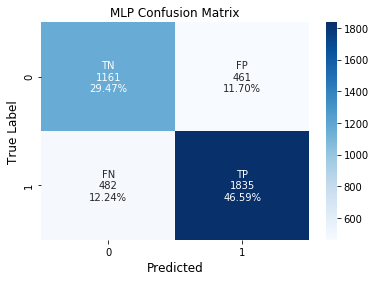

In [807]:
cf_matrix = confusion_matrix(y_test, y_pred)
make_confusion_matrix(cf_matrix,'MLP Confusion Matrix')

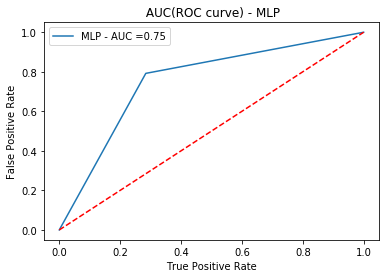

In [808]:
plot_roc_curve(y_test, y_pred, 'MLP')